# Import Libraries

In [92]:
import pandas as pd
import random
import numpy as np
import copy
from matplotlib import pyplot as plt

# Functions

In [93]:
# Calculate Distance between two points
def dist(x1,y1,x2,y2):
    return 100 * np.sqrt((y2 - y1) ** 2 + (x2 - x1) ** 2)

In [94]:
# Routes,Demand and Vehicle Type

# V = Max Number of Vehicles
# L = Hard Limit of Vehicles
# C = Customer List
# D = Demand List

def gen_route(V,L,C,D):
    valid = False

    while not valid:
        cust_remain = C.copy()
        cust_remain.remove("Depot")

        solution = []
        g_demand = []
        s = []
        d = []

        for i in range(0,V):
            s.append("Depot")
            solution.append(s)
            s = []
        
        while len(cust_remain) > 0:
            loc = random.choice(cust_remain)
            solution[random.randint(0,V-1)].append(loc)
            cust_remain.remove(loc)
        
        for route in solution:
            if len(route) == 1:
                solution.remove(route)

        for route in solution:
            for r in route:
                d.append(D[C.index(r)])
            g_demand.append(sum(d))
            d = []

        if all(d <= L for d in g_demand):
            valid = True
            
    return solution

In [95]:
# Distance and Cost
def calc_dist(solution, vehicles, dist_matrix,D,C):
    Dist =[]
    g_dist = []
    g_cost = []
    g_demand = []
    g_vehicle = []
    d = []

    for route in solution:
        for r in route:
            d.append(D[C.index(r)])
        g_demand.append(sum(d))
        d = []
    
    for d in g_demand:
        if d <= 25:
            g_vehicle.append('Type A')
        else:
            g_vehicle.append('Type B')

    for s in solution:
        d = []
        p_loc = ""
        for loc in s:
            if s.index(loc) == 0:
                d.append(dist_matrix["Depot"][loc])
                p_loc = loc
            else:
                d.append(dist_matrix[p_loc][loc])
                p_loc = loc
        Dist.append(d)

    for d in Dist:
        g_dist.append(sum(d))
    
    for d in g_dist:
        g_cost.append(d * vehicles['Cost'][g_vehicle[g_dist.index(d)]])



    return Dist, g_dist, g_cost, g_demand, g_vehicle

In [96]:
# Print Report
def report(solution,g_dist,g_cost,g_vehicle,g_demand,Dist):
    print(f"Total Distance = {round(sum(g_dist),4)} km")
    print(f"Total Cost = RM {round(sum(g_cost),2)}\n")

    for i in range(0,len(solution)):
        print(f"Vehicle {i+1} ({g_vehicle[i]}):")
        print(f"Round Trip Distance:{round(g_dist[i],3)} km, Cost: RM {round(g_cost[i],2)}, Demand:{g_demand[i]}")
        route = ""
        for loc in solution[i]:
            idx = solution[i].index(loc)
            if  idx == 0:
                route += loc
            else:
                route += " -> " + f"{loc} ({round(Dist[i][idx],3)} km)"
        print (f"{route}\n")

In [97]:
# Generate neighbours
def gen_neighbour(solution,D,L,C):
    neighbours = []
    r = []
    d=[]
    n_demand = []
    num = len(solution)

    # Swap among routes itself
    for i in range(num):
        r = solution[i]
        if len(solution[i]) != 2:
            for j in range(1,len(r)):
                for k in range(j+1,len(r)):
                    new_r = [r[:] for r in solution]
                    new_r[i][j], new_r[i][k] = new_r[i][k], new_r[i][j]

                    for route in new_r:
                        for r in route:
                            d.append(D[C.index(r)])
                            n_demand.append(sum(d))
                            d = []

                    if all(d <= L for d in n_demand):
                        neighbours.append(new_r)
                        n_demand = []

    # Swap with other routes
    for i in range(num):
        r = solution[i]
        for j in range(1,len(r)):
            for k in range(num):
                if i != k:
                    for l in range(j,len(solution[k])):
                        new_r = [r[:] for r in solution]
                        new_r[i][j], new_r[k][l] = new_r[k][l], new_r[i][j]

                        for route in new_r:
                            for r in route:
                                d.append(D[C.index(r)])
                                n_demand.append(sum(d))
                                d = []

                        if all(d <= L for d in n_demand):
                            neighbours.append(new_r)
                            n_demand = []
    return neighbours

In [98]:
# Tabu Search Algo
def tabu(solution,max_list,num_of_iter,vehicles,dist_matrix,D,L,C):
    cur_sol = copy.deepcopy(solution)
    best_sol = cur_sol
    best_cost = sum(calc_dist(solution,vehicles,dist_matrix,D,C)[2])
    cost = []
    tabu_list = []

    for iter in range(num_of_iter):
        neighbours = gen_neighbour(cur_sol,D,L,C)
        best_n = None
        best_n_cost = 0

        for s in neighbours:
            c = calc_dist(s,vehicles,dist_matrix,D,C)[2]
            if s not in tabu_list:
                n_cost = sum(c)
                if n_cost < best_cost:
                    best_n = s
                    best_n_cost = n_cost
        
        if best_n is not None:
            cur_sol = best_n
            if best_n_cost < best_cost:
                best_sol = best_n
                best_cost = best_n_cost
                
        tabu_list.append(cur_sol)

        if len(tabu_list) > max_list:
            tabu_list.pop(0)

        print(f"Iteration {iter + 1}: Best Cost = {best_cost}")
    
    return best_sol

In [145]:
# Visualise Routes
def plot(solution,x,y,data,name):
    plt.scatter(x, y)
    for i, label in enumerate(n):
        plt.annotate(label, (x[i], y[i]), textcoords="offset points", xytext=(0,10), ha='center')

    for s in solution:
        s_coor = []
        for loc in s:
            if s.index(loc) == len(s)-1:
                s_coor.append([data[data[:,2] == loc,0].astype(float)[0],data[data[:,2] == loc,1].astype(float)[0]])
                s_coor.append([data[data[:,2] == "Depot",0].astype(float)[0],data[data[:,2] == "Depot",1].astype(float)[0]])
            else:
                s_coor.append([data[data[:,2] == loc,0].astype(float)[0],data[data[:,2] == loc,1].astype(float)[0]])
        s_coor = np.array(s_coor)
        plt.plot(s_coor[:, 0], s_coor[:, 1], marker='o')

    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Customer Locations')
    plt.savefig(f'fig\\{name}.png')
    plt.show()

# Import Data

In [100]:
customers = pd.read_csv("customers.csv")
customers

,Customer,Latitude,Longitude,Demand
0,1,4.3555,113.9777,5
1,2,4.3976,114.0049,8
2,3,4.3163,114.0764,3
3,4,4.3184,113.9932,6
4,5,4.4024,113.9896,5
5,6,4.4142,114.0127,8
6,7,4.4804,114.0734,3
7,8,4.3818,114.2034,6
8,9,4.4935,114.1828,5
9,10,4.4932,114.1322,8


In [101]:
depot = pd.read_csv("depot.csv")
depot

,Customer,Latitude,Longitude,Demand
0,Depot,4.4184,114.0932,0


In [102]:
vehicles = pd.read_csv("vehicles.csv", index_col='Vehicle')
vehicles

,Capacity,Cost
Vehicle,,
Type A,25,1.2
Type B,30,1.5


# Data Preparation

In [103]:
cust = customers
cust['Customer'] = customers['Customer'].apply(lambda x: f'C{x}')
cust

,Customer,Latitude,Longitude,Demand
0,C1,4.3555,113.9777,5
1,C2,4.3976,114.0049,8
2,C3,4.3163,114.0764,3
3,C4,4.3184,113.9932,6
4,C5,4.4024,113.9896,5
5,C6,4.4142,114.0127,8
6,C7,4.4804,114.0734,3
7,C8,4.3818,114.2034,6
8,C9,4.4935,114.1828,5
9,C10,4.4932,114.1322,8


In [104]:
locations = pd.concat([depot,cust]).reset_index(drop=True)
locations

,Customer,Latitude,Longitude,Demand
0,Depot,4.4184,114.0932,0
1,C1,4.3555,113.9777,5
2,C2,4.3976,114.0049,8
3,C3,4.3163,114.0764,3
4,C4,4.3184,113.9932,6
5,C5,4.4024,113.9896,5
6,C6,4.4142,114.0127,8
7,C7,4.4804,114.0734,3
8,C8,4.3818,114.2034,6
9,C9,4.4935,114.1828,5


In [105]:
# Calculate the distance matrix
dist_matrix = pd.DataFrame(index=locations["Customer"], columns=locations["Customer"])

for i in locations["Customer"]:
    for j in locations["Customer"]:
        row_i = locations[locations["Customer"] == i][["Latitude", "Longitude"]]
        row_j = locations[locations["Customer"] == j][["Latitude", "Longitude"]]
        dist_value = dist(row_i["Latitude"].values[0], row_i["Longitude"].values[0], row_j["Latitude"].values[0], row_j["Longitude"].values[0])
        dist_matrix.at[i, j] = dist_value

dist_matrix

Customer,Depot,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10
Customer,,,,,,,,,,,
Depot,0.0,13.151677,9.071676,10.347294,14.142136,10.482824,8.060949,6.508487,11.61189,11.691095,8.435662
C1,13.151677,0.0,5.012235,10.619948,4.020771,4.838616,6.834245,15.734834,22.722716,24.720439,20.695782
C2,9.071676,5.012235,0.0,10.826791,8.005954,1.603527,1.834121,10.746204,19.912782,20.2102,15.920003
C3,10.347294,10.619948,10.826791,0.0,8.32265,12.225976,11.67994,16.412742,14.289594,20.669011,18.549191
C4,14.142136,4.020771,8.005954,8.32265,0.0,8.407711,9.776446,18.076515,21.955318,25.808559,22.332944
C5,10.482824,4.838616,1.603527,12.225976,8.407711,0.0,2.593935,11.448336,21.479013,21.360115,16.905443
C6,8.060949,6.834245,1.834121,11.67994,9.776446,2.593935,0.0,8.981609,19.34328,18.767658,14.32524
C7,6.508487,15.734834,10.746204,16.412742,18.076515,11.448336,8.981609,0.0,16.316237,11.018153,6.017707
C8,11.61189,22.722716,19.912782,14.289594,21.955318,21.479013,19.34328,16.316237,0.0,11.358367,13.220968


In [106]:
# Customers
C = []
for i,rows in locations.iterrows():
    C.append(rows["Customer"])

# Demand
D = []
for i,rows in locations.iterrows():
    D.append(rows["Demand"])

# Size of Customers
N = len(C) - 1

# Hard limit of Vehicles
L = 30

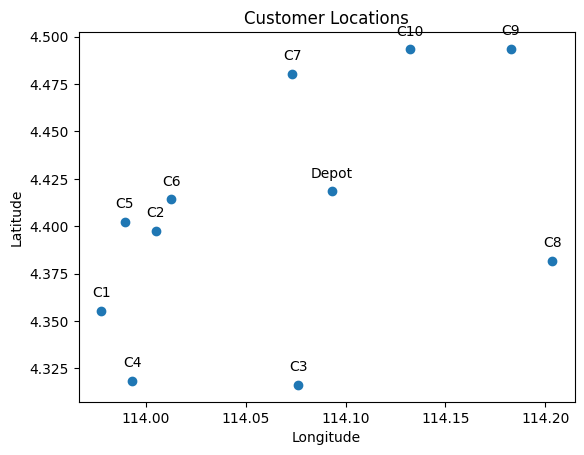

In [107]:
# Visualise Locations
data = []
for i,row in locations.iterrows():
    data.append([row["Longitude"],row["Latitude"],row["Customer"]])

data=np.array(data)

x = data[:, 0].astype(float)
y = data[:, 1].astype(float)
n = data[:, 2]

plt.scatter(x, y)

for i, label in enumerate(n):
    plt.annotate(label, (x[i], y[i]), textcoords="offset points", xytext=(0,10), ha='center')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Customer Locations')
plt.show()

# Model

### Get initial solution

Total Distance = 143.1397 km
Total Cost = RM 214.71

Vehicle 1 (Type B):
Round Trip Distance:54.161 km, Cost: RM 81.24, Demand:27
Depot -> C6 (8.061 km) -> C3 (11.68 km) -> C5 (12.226 km) -> C7 (11.448 km) -> C2 (10.746 km)

Vehicle 2 (Type B):
Round Trip Distance:88.978 km, Cost: RM 133.47, Demand:30
Depot -> C4 (14.142 km) -> C10 (22.333 km) -> C9 (5.06 km) -> C1 (24.72 km) -> C8 (22.723 km)



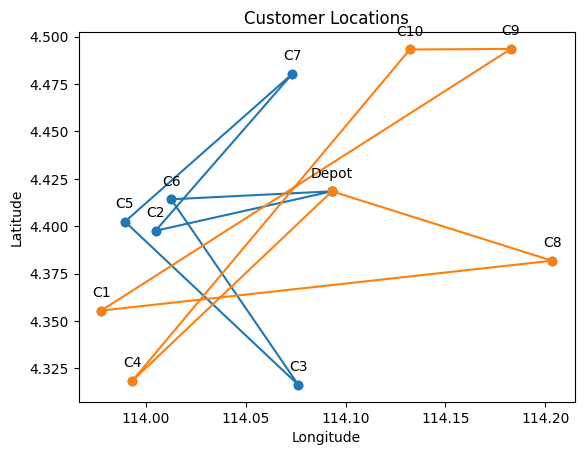

In [146]:
solution = gen_route(2,L,C,D)
Dist, g_dist, g_cost, g_demand, g_vehicle = calc_dist(solution,vehicles,dist_matrix,D,C)
report(solution,g_dist,g_cost,g_vehicle,g_demand,Dist)
plot(solution,x,y,data,"temp")

### Run Tabu Search Algo

In [131]:
ts_sol = tabu(solution,20,100,vehicles,dist_matrix,D,L,C)
tsDist, ts_dist, ts_cost, ts_demand, ts_vehicle = calc_dist(ts_sol,vehicles,dist_matrix,D,C)

Iteration 1: Best Cost = 165.01842293678465
Iteration 2: Best Cost = 134.8025472912339
Iteration 3: Best Cost = 131.25979545631014
Iteration 4: Best Cost = 128.28384797399673
Iteration 5: Best Cost = 111.84144423450418
Iteration 6: Best Cost = 110.85618498114832
Iteration 7: Best Cost = 110.72021531612224
Iteration 8: Best Cost = 110.46908683942664
Iteration 9: Best Cost = 110.46908683942664
Iteration 10: Best Cost = 110.46908683942664
Iteration 11: Best Cost = 110.46908683942664
Iteration 12: Best Cost = 110.46908683942664
Iteration 13: Best Cost = 110.46908683942664
Iteration 14: Best Cost = 110.46908683942664
Iteration 15: Best Cost = 110.46908683942664
Iteration 16: Best Cost = 110.46908683942664
Iteration 17: Best Cost = 110.46908683942664
Iteration 18: Best Cost = 110.46908683942664
Iteration 19: Best Cost = 110.46908683942664
Iteration 20: Best Cost = 110.46908683942664
Iteration 21: Best Cost = 110.46908683942664
Iteration 22: Best Cost = 110.46908683942664
Iteration 23: Best C

Total Distance = 84.9489 km
Total Cost = RM 110.47

Vehicle 1 (Type A):
Round Trip Distance:56.514 km, Cost: RM 67.82, Demand:25
Depot -> C10 (8.436 km) -> C7 (6.018 km) -> C3 (16.413 km) -> C8 (14.29 km) -> C9 (11.358 km)

Vehicle 2 (Type B):
Round Trip Distance:28.435 km, Cost: RM 42.65, Demand:32
Depot -> C4 (14.142 km) -> C1 (4.021 km) -> C6 (6.834 km) -> C2 (1.834 km) -> C5 (1.604 km)



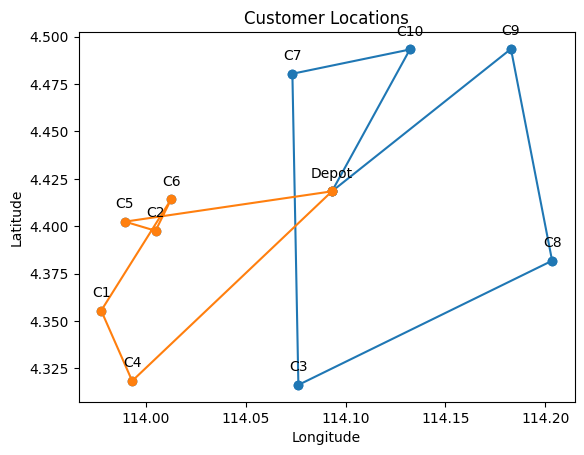

In [147]:
report(ts_sol,ts_dist,ts_cost,ts_vehicle,ts_demand,tsDist)
plot(ts_sol,x,y,data,"temp2")

### Analysis

Total Distance = 152.3856 km
Total Cost = RM 228.58

Vehicle 1 (Type B):
Round Trip Distance:79.749 km, Cost: RM 119.62, Demand:29
Depot -> C6 (8.061 km) -> C5 (2.594 km) -> C3 (12.226 km) -> C7 (16.413 km) -> C1 (15.735 km) -> C9 (24.72 km)

Vehicle 2 (Type B):
Round Trip Distance:72.637 km, Cost: RM 108.96, Demand:28
Depot -> C10 (8.436 km) -> C4 (22.333 km) -> C8 (21.955 km) -> C2 (19.913 km)



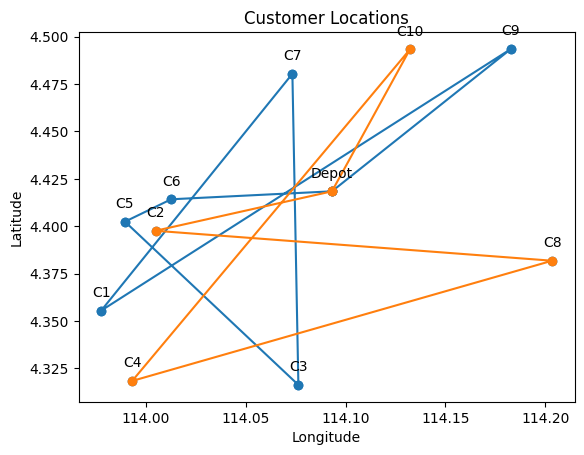

Iteration 1: Best Cost = 166.95975789802696
Iteration 2: Best Cost = 110.90834365132551
Iteration 3: Best Cost = 107.16188369582468
Iteration 4: Best Cost = 107.16188369582468
Iteration 5: Best Cost = 107.16188369582468
Iteration 6: Best Cost = 107.16188369582468
Iteration 7: Best Cost = 107.16188369582468
Iteration 8: Best Cost = 107.16188369582468
Iteration 9: Best Cost = 107.16188369582468
Iteration 10: Best Cost = 107.16188369582468
Iteration 11: Best Cost = 107.16188369582468
Iteration 12: Best Cost = 107.16188369582468
Iteration 13: Best Cost = 107.16188369582468
Iteration 14: Best Cost = 107.16188369582468
Iteration 15: Best Cost = 107.16188369582468
Iteration 16: Best Cost = 107.16188369582468
Iteration 17: Best Cost = 107.16188369582468
Iteration 18: Best Cost = 107.16188369582468
Iteration 19: Best Cost = 107.16188369582468
Iteration 20: Best Cost = 107.16188369582468
Iteration 21: Best Cost = 107.16188369582468
Iteration 22: Best Cost = 107.16188369582468
Iteration 23: Best 

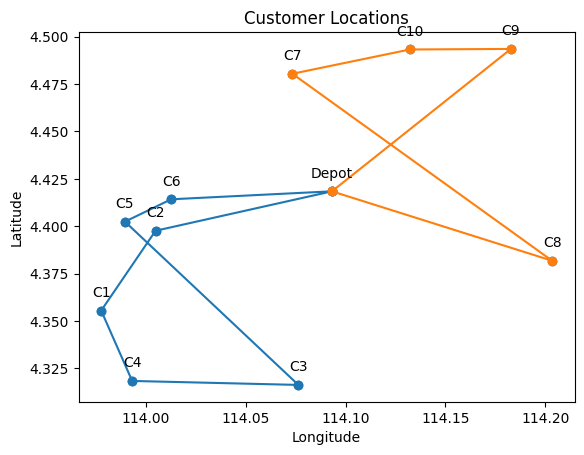

Total Distance = 135.8196 km
Total Cost = RM 203.73

Vehicle 1 (Type B):
Round Trip Distance:77.601 km, Cost: RM 116.4, Demand:27
Depot -> C7 (6.508 km) -> C3 (16.413 km) -> C10 (18.549 km) -> C2 (15.92 km) -> C9 (20.21 km)

Vehicle 2 (Type B):
Round Trip Distance:58.219 km, Cost: RM 87.33, Demand:30
Depot -> C6 (8.061 km) -> C8 (19.343 km) -> C4 (21.955 km) -> C1 (4.021 km) -> C5 (4.839 km)



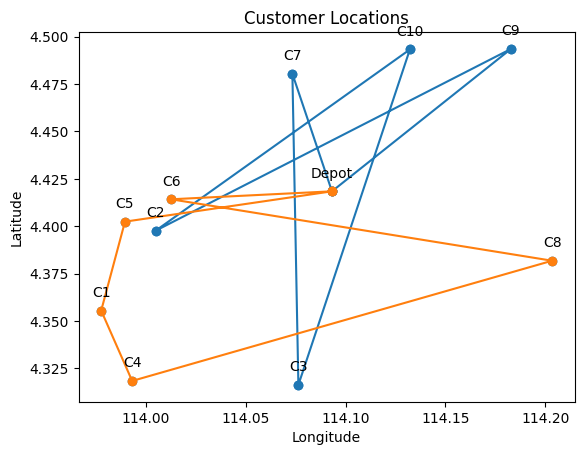

Iteration 1: Best Cost = 192.7175132915313
Iteration 2: Best Cost = 170.28885446897726
Iteration 3: Best Cost = 150.63517994501797
Iteration 4: Best Cost = 132.1074344854728
Iteration 5: Best Cost = 131.75467654125828
Iteration 6: Best Cost = 115.83012362290592
Iteration 7: Best Cost = 109.40804120362267
Iteration 8: Best Cost = 109.40804120362267
Iteration 9: Best Cost = 109.40804120362267
Iteration 10: Best Cost = 109.40804120362267
Iteration 11: Best Cost = 109.40804120362267
Iteration 12: Best Cost = 109.40804120362267
Iteration 13: Best Cost = 109.40804120362267
Iteration 14: Best Cost = 109.40804120362267
Iteration 15: Best Cost = 109.40804120362267
Iteration 16: Best Cost = 109.40804120362267
Iteration 17: Best Cost = 109.40804120362267
Iteration 18: Best Cost = 109.40804120362267
Iteration 19: Best Cost = 109.40804120362267
Iteration 20: Best Cost = 109.40804120362267
Iteration 21: Best Cost = 109.40804120362267
Iteration 22: Best Cost = 109.40804120362267
Iteration 23: Best Co

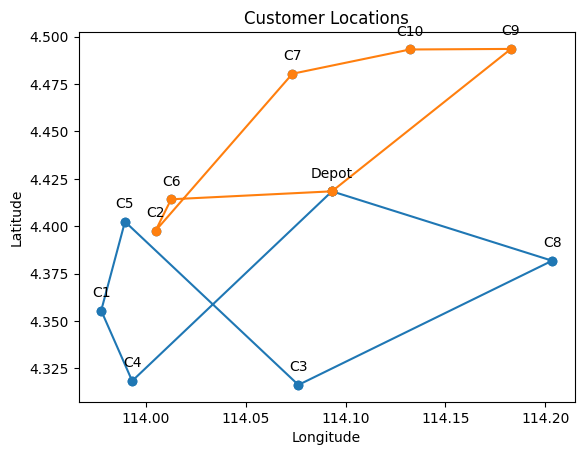

Total Distance = 165.3398 km
Total Cost = RM 248.01

Vehicle 1 (Type B):
Round Trip Distance:95.66 km, Cost: RM 143.49, Demand:30
Depot -> C7 (6.508 km) -> C4 (18.077 km) -> C9 (25.809 km) -> C5 (21.36 km) -> C3 (12.226 km) -> C6 (11.68 km)

Vehicle 2 (Type B):
Round Trip Distance:69.68 km, Cost: RM 104.52, Demand:27
Depot -> C1 (13.152 km) -> C10 (20.696 km) -> C2 (15.92 km) -> C8 (19.913 km)



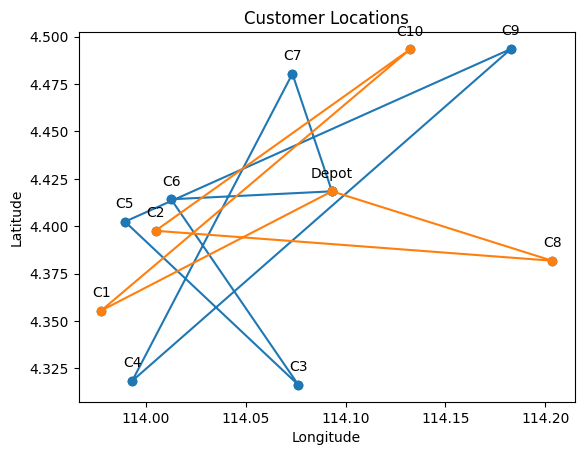

Iteration 1: Best Cost = 224.80624334635047
Iteration 2: Best Cost = 213.2494399329065
Iteration 3: Best Cost = 187.9022227565361
Iteration 4: Best Cost = 180.16295432163287
Iteration 5: Best Cost = 153.8613676411412
Iteration 6: Best Cost = 146.0878843259963
Iteration 7: Best Cost = 137.86484705214218
Iteration 8: Best Cost = 135.93227001603466
Iteration 9: Best Cost = 130.90691524706693
Iteration 10: Best Cost = 125.7264439271093
Iteration 11: Best Cost = 124.86048726361544
Iteration 12: Best Cost = 123.95570353683375
Iteration 13: Best Cost = 115.88977070792744
Iteration 14: Best Cost = 113.48260157314542
Iteration 15: Best Cost = 113.48260157314542
Iteration 16: Best Cost = 113.48260157314542
Iteration 17: Best Cost = 113.48260157314542
Iteration 18: Best Cost = 113.48260157314542
Iteration 19: Best Cost = 113.48260157314542
Iteration 20: Best Cost = 113.48260157314542
Iteration 21: Best Cost = 113.48260157314542
Iteration 22: Best Cost = 113.48260157314542
Iteration 23: Best Cost 

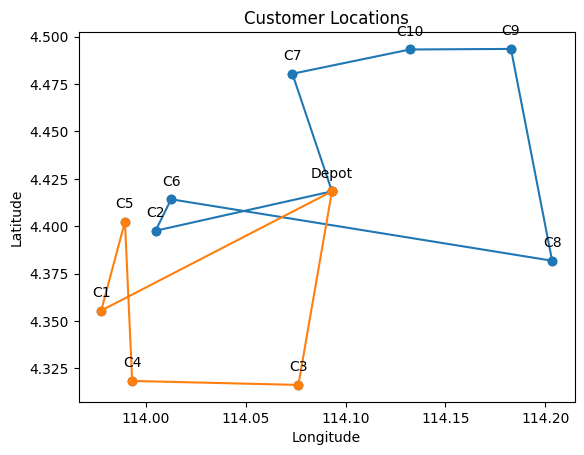

Total Distance = 137.6036 km
Total Cost = RM 206.41

Vehicle 1 (Type B):
Round Trip Distance:90.109 km, Cost: RM 135.16, Demand:27
Depot -> C9 (11.691 km) -> C4 (25.809 km) -> C5 (8.408 km) -> C8 (21.479 km) -> C1 (22.723 km)

Vehicle 2 (Type B):
Round Trip Distance:47.495 km, Cost: RM 71.24, Demand:30
Depot -> C3 (10.347 km) -> C10 (18.549 km) -> C7 (6.018 km) -> C2 (10.746 km) -> C6 (1.834 km)



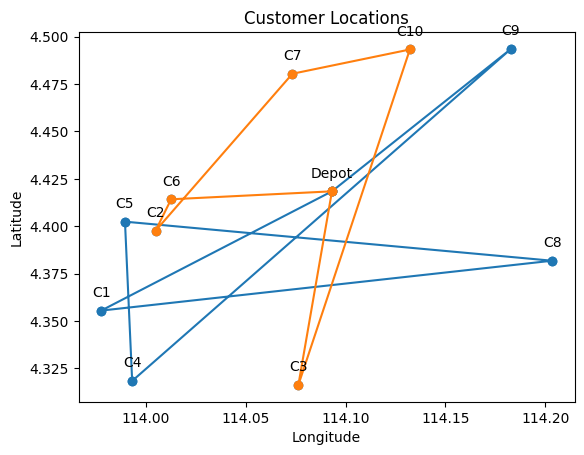

Iteration 1: Best Cost = 206.10343456699866
Iteration 2: Best Cost = 162.76129392090644
Iteration 3: Best Cost = 146.5839072669751
Iteration 4: Best Cost = 145.83418018166896
Iteration 5: Best Cost = 145.14819609278513
Iteration 6: Best Cost = 144.35919457973648
Iteration 7: Best Cost = 134.00550595860494
Iteration 8: Best Cost = 126.64754759419358
Iteration 9: Best Cost = 122.77959311766105
Iteration 10: Best Cost = 116.86768320415695
Iteration 11: Best Cost = 109.89322338183189
Iteration 12: Best Cost = 105.3098403002954
Iteration 13: Best Cost = 104.19823288123621
Iteration 14: Best Cost = 104.19823288123621
Iteration 15: Best Cost = 104.19823288123621
Iteration 16: Best Cost = 104.19823288123621
Iteration 17: Best Cost = 104.19823288123621
Iteration 18: Best Cost = 104.19823288123621
Iteration 19: Best Cost = 104.19823288123621
Iteration 20: Best Cost = 104.19823288123621
Iteration 21: Best Cost = 104.19823288123621
Iteration 22: Best Cost = 104.19823288123621
Iteration 23: Best Co

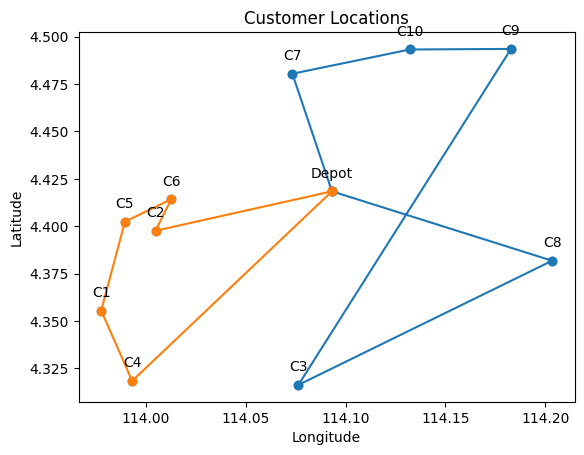

Total Distance = 148.4973 km
Total Cost = RM 222.75

Vehicle 1 (Type B):
Round Trip Distance:92.007 km, Cost: RM 138.01, Demand:27
Depot -> C9 (11.691 km) -> C4 (25.809 km) -> C7 (18.077 km) -> C1 (15.735 km) -> C10 (20.696 km)

Vehicle 2 (Type B):
Round Trip Distance:56.49 km, Cost: RM 84.74, Demand:30
Depot -> C6 (8.061 km) -> C2 (1.834 km) -> C3 (10.827 km) -> C8 (14.29 km) -> C5 (21.479 km)



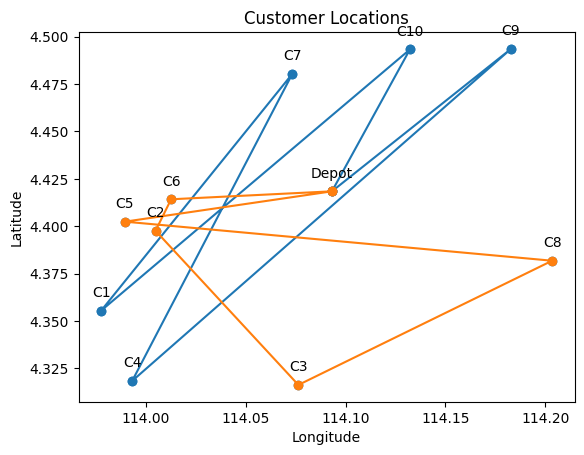

Iteration 1: Best Cost = 163.72817673047558
Iteration 2: Best Cost = 148.80475991991688
Iteration 3: Best Cost = 145.11263049972752
Iteration 4: Best Cost = 133.81311929551225
Iteration 5: Best Cost = 123.96899987443041
Iteration 6: Best Cost = 121.69637150258089
Iteration 7: Best Cost = 121.11216323501333
Iteration 8: Best Cost = 120.97410084589555
Iteration 9: Best Cost = 119.52772438821664
Iteration 10: Best Cost = 118.3969218337437
Iteration 11: Best Cost = 118.3969218337437
Iteration 12: Best Cost = 118.3969218337437
Iteration 13: Best Cost = 118.3969218337437
Iteration 14: Best Cost = 118.3969218337437
Iteration 15: Best Cost = 118.3969218337437
Iteration 16: Best Cost = 118.3969218337437
Iteration 17: Best Cost = 118.3969218337437
Iteration 18: Best Cost = 118.3969218337437
Iteration 19: Best Cost = 118.3969218337437
Iteration 20: Best Cost = 118.3969218337437
Iteration 21: Best Cost = 118.3969218337437
Iteration 22: Best Cost = 118.3969218337437
Iteration 23: Best Cost = 118.39

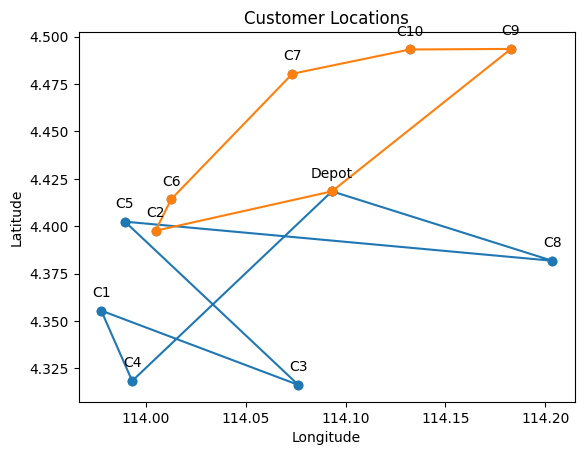

Total Distance = 150.4936 km
Total Cost = RM 225.74

Vehicle 1 (Type B):
Round Trip Distance:72.637 km, Cost: RM 108.96, Demand:28
Depot -> C10 (8.436 km) -> C4 (22.333 km) -> C8 (21.955 km) -> C2 (19.913 km)

Vehicle 2 (Type B):
Round Trip Distance:77.857 km, Cost: RM 116.79, Demand:29
Depot -> C1 (13.152 km) -> C5 (4.839 km) -> C7 (11.448 km) -> C6 (8.982 km) -> C9 (18.768 km) -> C3 (20.669 km)



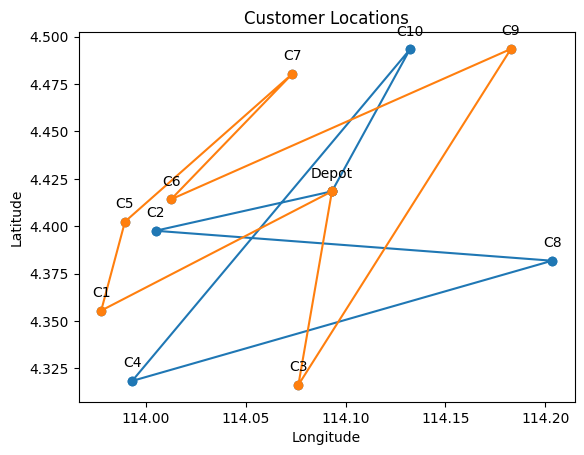

Iteration 1: Best Cost = 174.14510905909958
Iteration 2: Best Cost = 168.85593803027558
Iteration 3: Best Cost = 168.69449796001365
Iteration 4: Best Cost = 159.81308357679023
Iteration 5: Best Cost = 155.12344887933665
Iteration 6: Best Cost = 136.180453139748
Iteration 7: Best Cost = 128.57309184805337
Iteration 8: Best Cost = 106.2121154053249
Iteration 9: Best Cost = 105.23511417153402
Iteration 10: Best Cost = 105.23511417153402
Iteration 11: Best Cost = 105.23511417153402
Iteration 12: Best Cost = 105.23511417153402
Iteration 13: Best Cost = 105.23511417153402
Iteration 14: Best Cost = 105.23511417153402
Iteration 15: Best Cost = 105.23511417153402
Iteration 16: Best Cost = 105.23511417153402
Iteration 17: Best Cost = 105.23511417153402
Iteration 18: Best Cost = 105.23511417153402
Iteration 19: Best Cost = 105.23511417153402
Iteration 20: Best Cost = 105.23511417153402
Iteration 21: Best Cost = 105.23511417153402
Iteration 22: Best Cost = 105.23511417153402
Iteration 23: Best Cos

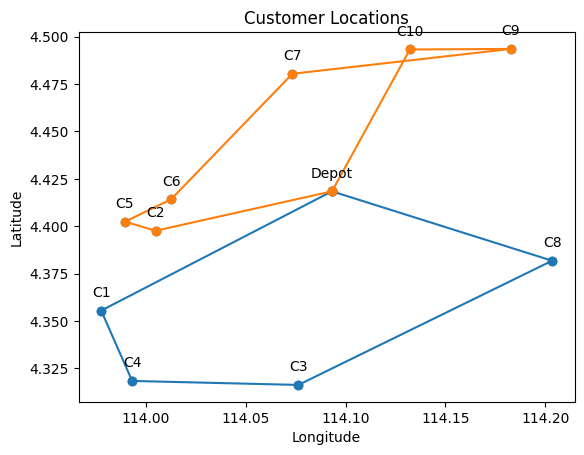

Total Distance = 97.1824 km
Total Cost = RM 145.77

Vehicle 1 (Type B):
Round Trip Distance:54.036 km, Cost: RM 81.05, Demand:30
Depot -> C8 (11.612 km) -> C9 (11.358 km) -> C10 (5.06 km) -> C6 (14.325 km) -> C3 (11.68 km)

Vehicle 2 (Type B):
Round Trip Distance:43.147 km, Cost: RM 64.72, Demand:27
Depot -> C4 (14.142 km) -> C5 (8.408 km) -> C1 (4.839 km) -> C2 (5.012 km) -> C7 (10.746 km)



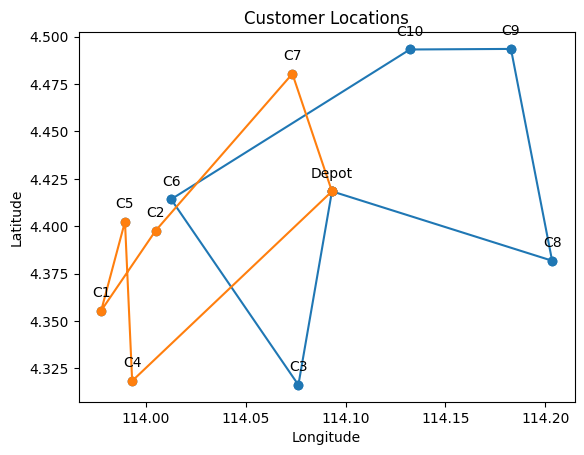

Iteration 1: Best Cost = 141.84702457546268
Iteration 2: Best Cost = 137.72780644654117
Iteration 3: Best Cost = 136.04535619973598
Iteration 4: Best Cost = 114.63819602537919
Iteration 5: Best Cost = 108.73971877446078
Iteration 6: Best Cost = 103.3204879854829
Iteration 7: Best Cost = 102.88428277390454
Iteration 8: Best Cost = 102.88428277390454
Iteration 9: Best Cost = 102.88428277390454
Iteration 10: Best Cost = 102.88428277390454
Iteration 11: Best Cost = 102.88428277390454
Iteration 12: Best Cost = 102.88428277390454
Iteration 13: Best Cost = 102.88428277390454
Iteration 14: Best Cost = 102.88428277390454
Iteration 15: Best Cost = 102.88428277390454
Iteration 16: Best Cost = 102.88428277390454
Iteration 17: Best Cost = 102.88428277390454
Iteration 18: Best Cost = 102.88428277390454
Iteration 19: Best Cost = 102.88428277390454
Iteration 20: Best Cost = 102.88428277390454
Iteration 21: Best Cost = 102.88428277390454
Iteration 22: Best Cost = 102.88428277390454
Iteration 23: Best C

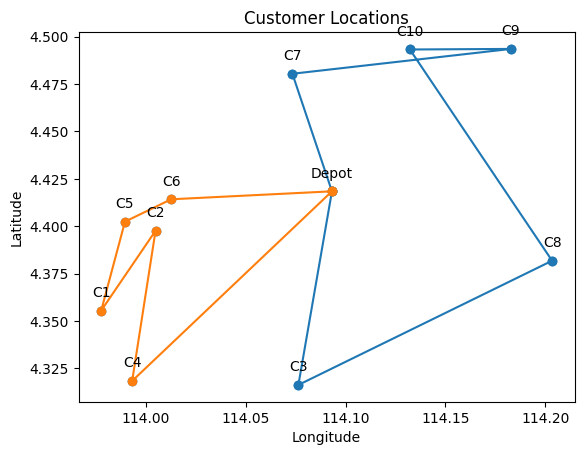

Total Distance = 139.3503 km
Total Cost = RM 209.03

Vehicle 1 (Type B):
Round Trip Distance:48.169 km, Cost: RM 72.25, Demand:29
Depot -> C9 (11.691 km) -> C5 (21.36 km) -> C2 (1.604 km) -> C6 (1.834 km) -> C3 (11.68 km)

Vehicle 2 (Type B):
Round Trip Distance:91.181 km, Cost: RM 136.77, Demand:28
Depot -> C10 (8.436 km) -> C4 (22.333 km) -> C8 (21.955 km) -> C1 (22.723 km) -> C7 (15.735 km)



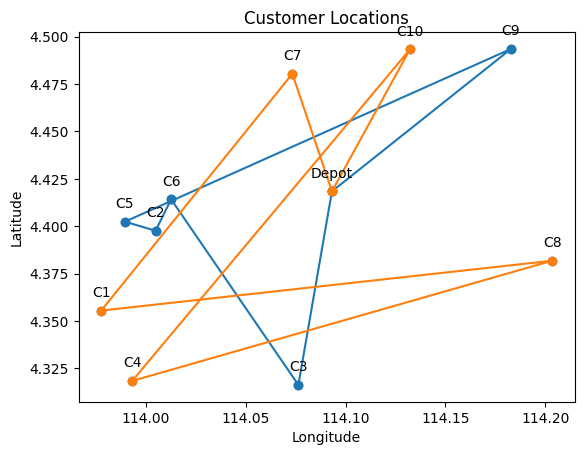

Iteration 1: Best Cost = 197.3055834618744
Iteration 2: Best Cost = 193.16401035560926
Iteration 3: Best Cost = 164.07255218892834
Iteration 4: Best Cost = 161.23026276207565
Iteration 5: Best Cost = 153.28985096423617
Iteration 6: Best Cost = 134.7861570847428
Iteration 7: Best Cost = 133.12805484547704
Iteration 8: Best Cost = 126.37926195108359
Iteration 9: Best Cost = 123.31828479676055
Iteration 10: Best Cost = 113.27220219463047
Iteration 11: Best Cost = 112.14139964015752
Iteration 12: Best Cost = 112.14139964015752
Iteration 13: Best Cost = 112.14139964015752
Iteration 14: Best Cost = 112.14139964015752
Iteration 15: Best Cost = 112.14139964015752
Iteration 16: Best Cost = 112.14139964015752
Iteration 17: Best Cost = 112.14139964015752
Iteration 18: Best Cost = 112.14139964015752
Iteration 19: Best Cost = 112.14139964015752
Iteration 20: Best Cost = 112.14139964015752
Iteration 21: Best Cost = 112.14139964015752
Iteration 22: Best Cost = 112.14139964015752
Iteration 23: Best Co

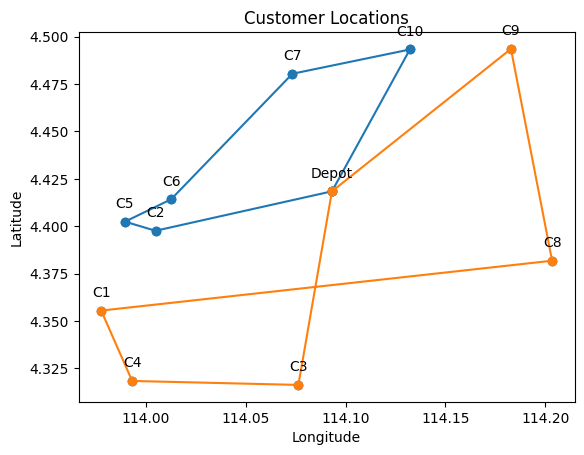

Total Distance = 114.9881 km
Total Cost = RM 172.48

Vehicle 1 (Type B):
Round Trip Distance:55.974 km, Cost: RM 83.96, Demand:27
Depot -> C4 (14.142 km) -> C10 (22.333 km) -> C5 (16.905 km) -> C6 (2.594 km)

Vehicle 2 (Type B):
Round Trip Distance:59.014 km, Cost: RM 88.52, Demand:30
Depot -> C7 (6.508 km) -> C9 (11.018 km) -> C8 (11.358 km) -> C3 (14.29 km) -> C2 (10.827 km) -> C1 (5.012 km)



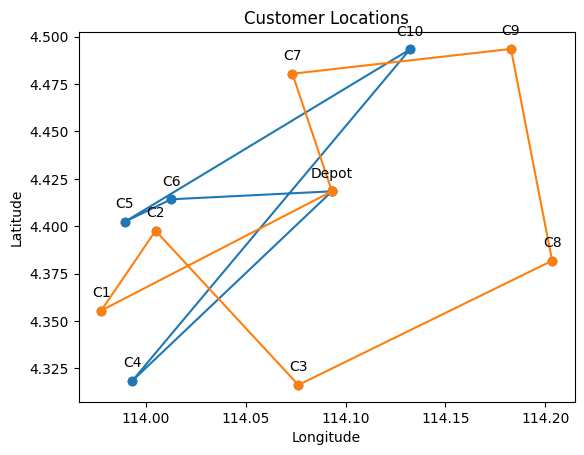

Iteration 1: Best Cost = 161.33976433942019
Iteration 2: Best Cost = 149.27333961802327
Iteration 3: Best Cost = 140.1465428439828
Iteration 4: Best Cost = 116.04318810689665
Iteration 5: Best Cost = 110.74829136441888
Iteration 6: Best Cost = 110.74829136441888
Iteration 7: Best Cost = 110.74829136441888
Iteration 8: Best Cost = 110.74829136441888
Iteration 9: Best Cost = 110.74829136441888
Iteration 10: Best Cost = 110.74829136441888
Iteration 11: Best Cost = 110.74829136441888
Iteration 12: Best Cost = 110.74829136441888
Iteration 13: Best Cost = 110.74829136441888
Iteration 14: Best Cost = 110.74829136441888
Iteration 15: Best Cost = 110.74829136441888
Iteration 16: Best Cost = 110.74829136441888
Iteration 17: Best Cost = 110.74829136441888
Iteration 18: Best Cost = 110.74829136441888
Iteration 19: Best Cost = 110.74829136441888
Iteration 20: Best Cost = 110.74829136441888
Iteration 21: Best Cost = 110.74829136441888
Iteration 22: Best Cost = 110.74829136441888
Iteration 23: Best C

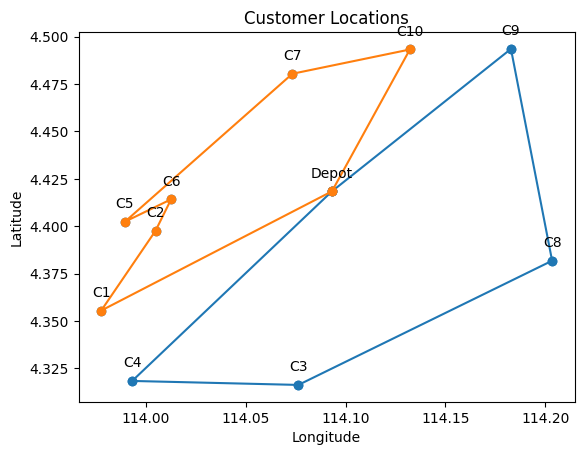

Total Distance = 159.8371 km
Total Cost = RM 239.76

Vehicle 1 (Type B):
Round Trip Distance:66.953 km, Cost: RM 100.43, Demand:30
Depot -> C5 (10.483 km) -> C3 (12.226 km) -> C6 (11.68 km) -> C8 (19.343 km) -> C10 (13.221 km)

Vehicle 2 (Type B):
Round Trip Distance:92.884 km, Cost: RM 139.33, Demand:27
Depot -> C4 (14.142 km) -> C7 (18.077 km) -> C1 (15.735 km) -> C9 (24.72 km) -> C2 (20.21 km)



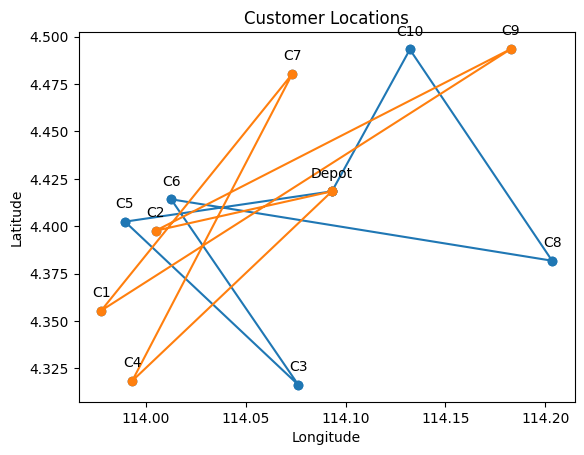

Iteration 1: Best Cost = 227.06822393924512
Iteration 2: Best Cost = 200.96416637964964
Iteration 3: Best Cost = 169.32337332007484
Iteration 4: Best Cost = 144.28228941446258
Iteration 5: Best Cost = 139.72727064238717
Iteration 6: Best Cost = 125.80026965994529
Iteration 7: Best Cost = 112.06406617883029
Iteration 8: Best Cost = 106.7226268839258
Iteration 9: Best Cost = 105.08930590566658
Iteration 10: Best Cost = 105.08930590566658
Iteration 11: Best Cost = 105.08930590566658
Iteration 12: Best Cost = 105.08930590566658
Iteration 13: Best Cost = 105.08930590566658
Iteration 14: Best Cost = 105.08930590566658
Iteration 15: Best Cost = 105.08930590566658
Iteration 16: Best Cost = 105.08930590566658
Iteration 17: Best Cost = 105.08930590566658
Iteration 18: Best Cost = 105.08930590566658
Iteration 19: Best Cost = 105.08930590566658
Iteration 20: Best Cost = 105.08930590566658
Iteration 21: Best Cost = 105.08930590566658
Iteration 22: Best Cost = 105.08930590566658
Iteration 23: Best C

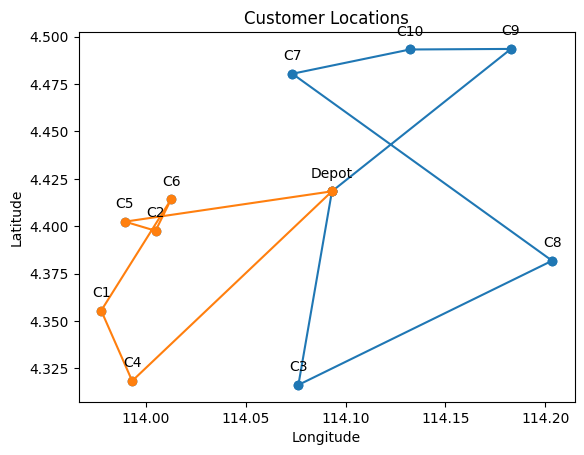

Total Distance = 139.3335 km
Total Cost = RM 209.0

Vehicle 1 (Type B):
Round Trip Distance:43.318 km, Cost: RM 64.98, Demand:29
Depot -> C6 (8.061 km) -> C10 (14.325 km) -> C2 (15.92 km) -> C1 (5.012 km)

Vehicle 2 (Type B):
Round Trip Distance:96.015 km, Cost: RM 144.02, Demand:28
Depot -> C5 (10.483 km) -> C8 (21.479 km) -> C3 (14.29 km) -> C9 (20.669 km) -> C7 (11.018 km) -> C4 (18.077 km)



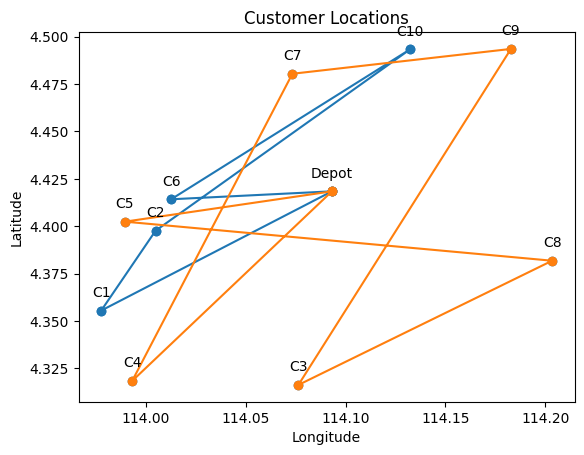

Iteration 1: Best Cost = 200.88606186304617
Iteration 2: Best Cost = 199.71019037210192
Iteration 3: Best Cost = 185.88408327513753
Iteration 4: Best Cost = 170.7277844096485
Iteration 5: Best Cost = 169.7773683691093
Iteration 6: Best Cost = 162.13993538845497
Iteration 7: Best Cost = 157.19410490835014
Iteration 8: Best Cost = 147.39335499194326
Iteration 9: Best Cost = 141.9550482817687
Iteration 10: Best Cost = 141.8610863821079
Iteration 11: Best Cost = 125.5476063071115
Iteration 12: Best Cost = 116.73545665555918
Iteration 13: Best Cost = 116.02757173996432
Iteration 14: Best Cost = 114.89676918549137
Iteration 15: Best Cost = 114.83620664184183
Iteration 16: Best Cost = 114.83620664184183
Iteration 17: Best Cost = 114.83620664184183
Iteration 18: Best Cost = 114.83620664184183
Iteration 19: Best Cost = 114.83620664184183
Iteration 20: Best Cost = 114.83620664184183
Iteration 21: Best Cost = 114.83620664184183
Iteration 22: Best Cost = 114.83620664184183
Iteration 23: Best Cost 

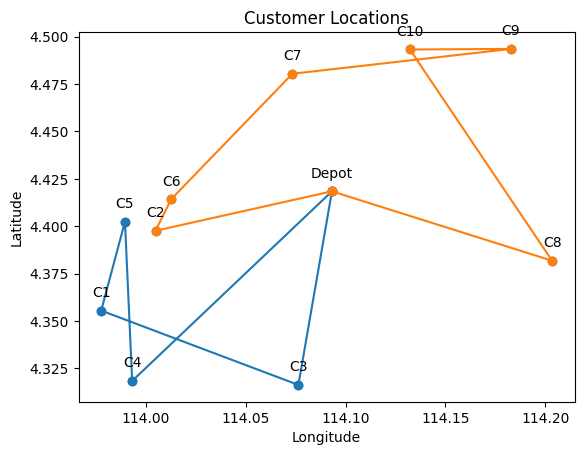

Total Distance = 125.3267 km
Total Cost = RM 187.99

Vehicle 1 (Type B):
Round Trip Distance:63.592 km, Cost: RM 95.39, Demand:30
Depot -> C2 (9.072 km) -> C6 (1.834 km) -> C8 (19.343 km) -> C1 (22.723 km) -> C3 (10.62 km)

Vehicle 2 (Type B):
Round Trip Distance:61.735 km, Cost: RM 92.6, Demand:27
Depot -> C5 (10.483 km) -> C4 (8.408 km) -> C9 (25.809 km) -> C7 (11.018 km) -> C10 (6.018 km)



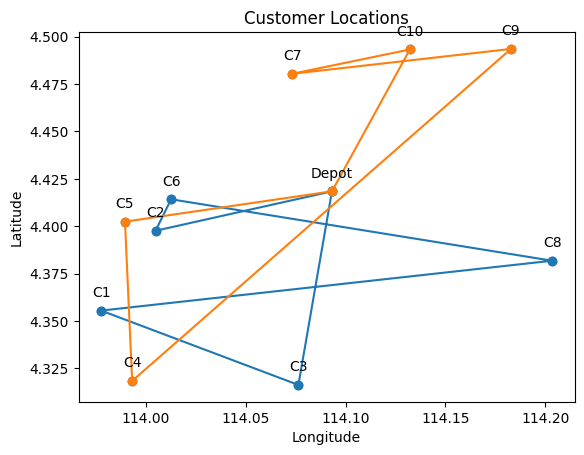

Iteration 1: Best Cost = 176.11070805395684
Iteration 2: Best Cost = 176.07425815234208
Iteration 3: Best Cost = 153.93881870009145
Iteration 4: Best Cost = 139.12495775106729
Iteration 5: Best Cost = 138.88207995654898
Iteration 6: Best Cost = 138.0820960271928
Iteration 7: Best Cost = 136.8053582654368
Iteration 8: Best Cost = 132.57276129195193
Iteration 9: Best Cost = 126.427218153218
Iteration 10: Best Cost = 120.69075009853549
Iteration 11: Best Cost = 99.79816660102509
Iteration 12: Best Cost = 97.70415041420442
Iteration 13: Best Cost = 96.59254299514521
Iteration 14: Best Cost = 93.5908412502527
Iteration 15: Best Cost = 93.5908412502527
Iteration 16: Best Cost = 93.5908412502527
Iteration 17: Best Cost = 93.5908412502527
Iteration 18: Best Cost = 93.5908412502527
Iteration 19: Best Cost = 93.5908412502527
Iteration 20: Best Cost = 93.5908412502527
Iteration 21: Best Cost = 93.5908412502527
Iteration 22: Best Cost = 93.5908412502527
Iteration 23: Best Cost = 93.5908412502527
I

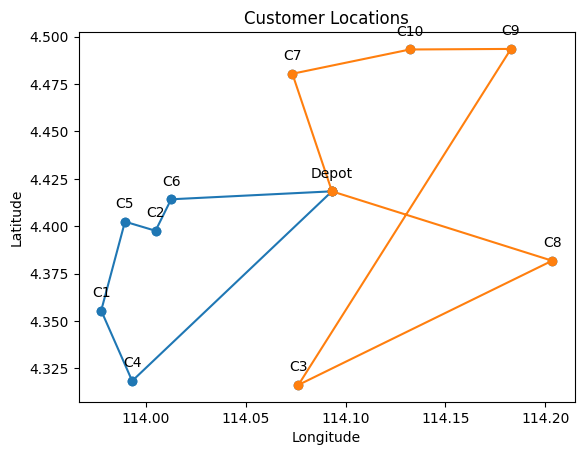

Total Distance = 150.7611 km
Total Cost = RM 226.14

Vehicle 1 (Type B):
Round Trip Distance:76.787 km, Cost: RM 115.18, Demand:27
Depot -> C10 (8.436 km) -> C4 (22.333 km) -> C9 (25.809 km) -> C2 (20.21 km)

Vehicle 2 (Type B):
Round Trip Distance:73.974 km, Cost: RM 110.96, Demand:30
Depot -> C3 (10.347 km) -> C6 (11.68 km) -> C8 (19.343 km) -> C7 (16.316 km) -> C5 (11.448 km) -> C1 (4.839 km)



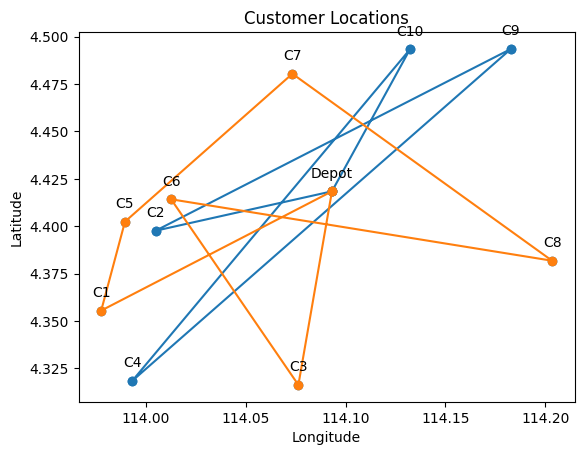

Iteration 1: Best Cost = 182.70254235544525
Iteration 2: Best Cost = 153.81842409555662
Iteration 3: Best Cost = 149.00008435403765
Iteration 4: Best Cost = 145.75650489579482
Iteration 5: Best Cost = 143.57144514602913
Iteration 6: Best Cost = 138.47060177105453
Iteration 7: Best Cost = 138.2513051281552
Iteration 8: Best Cost = 134.25680309099604
Iteration 9: Best Cost = 130.53020850467288
Iteration 10: Best Cost = 121.45543030489193
Iteration 11: Best Cost = 119.83248374378459
Iteration 12: Best Cost = 113.27676442777337
Iteration 13: Best Cost = 113.27676442777337
Iteration 14: Best Cost = 113.27676442777337
Iteration 15: Best Cost = 113.27676442777337
Iteration 16: Best Cost = 113.27676442777337
Iteration 17: Best Cost = 113.27676442777337
Iteration 18: Best Cost = 113.27676442777337
Iteration 19: Best Cost = 113.27676442777337
Iteration 20: Best Cost = 113.27676442777337
Iteration 21: Best Cost = 113.27676442777337
Iteration 22: Best Cost = 113.27676442777337
Iteration 23: Best C

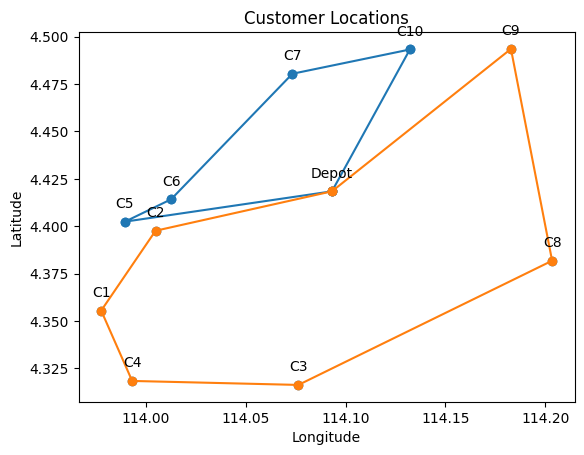

Total Distance = 131.4218 km
Total Cost = RM 197.13

Vehicle 1 (Type B):
Round Trip Distance:49.347 km, Cost: RM 74.02, Demand:30
Depot -> C7 (6.508 km) -> C9 (11.018 km) -> C2 (20.21 km) -> C6 (1.834 km) -> C4 (9.776 km)

Vehicle 2 (Type B):
Round Trip Distance:82.074 km, Cost: RM 123.11, Demand:27
Depot -> C3 (10.347 km) -> C1 (10.62 km) -> C8 (22.723 km) -> C5 (21.479 km) -> C10 (16.905 km)



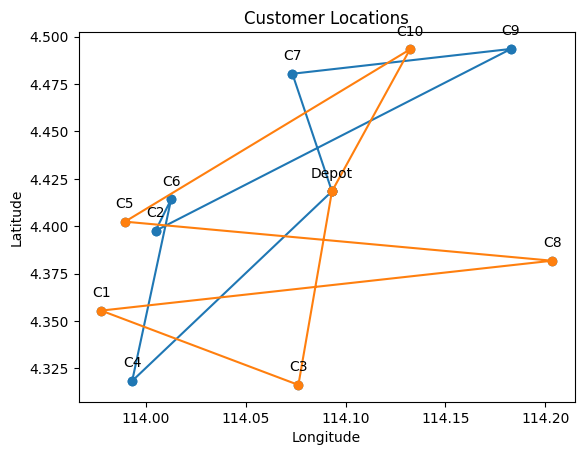

Iteration 1: Best Cost = 169.1363202274771
Iteration 2: Best Cost = 164.51058609781745
Iteration 3: Best Cost = 157.27389402773795
Iteration 4: Best Cost = 150.14498407509848
Iteration 5: Best Cost = 141.86916595810544
Iteration 6: Best Cost = 137.24068052148485
Iteration 7: Best Cost = 136.61805735279071
Iteration 8: Best Cost = 108.94907510730124
Iteration 9: Best Cost = 103.82439208135352
Iteration 10: Best Cost = 103.82439208135352
Iteration 11: Best Cost = 103.82439208135352
Iteration 12: Best Cost = 103.82439208135352
Iteration 13: Best Cost = 103.82439208135352
Iteration 14: Best Cost = 103.82439208135352
Iteration 15: Best Cost = 103.82439208135352
Iteration 16: Best Cost = 103.82439208135352
Iteration 17: Best Cost = 103.82439208135352
Iteration 18: Best Cost = 103.82439208135352
Iteration 19: Best Cost = 103.82439208135352
Iteration 20: Best Cost = 103.82439208135352
Iteration 21: Best Cost = 103.82439208135352
Iteration 22: Best Cost = 103.82439208135352
Iteration 23: Best C

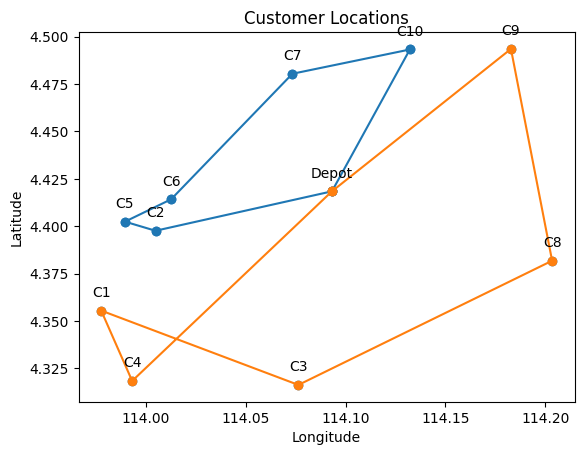

Total Distance = 127.4459 km
Total Cost = RM 191.17

Vehicle 1 (Type B):
Round Trip Distance:73.616 km, Cost: RM 110.42, Demand:27
Depot -> C10 (8.436 km) -> C5 (16.905 km) -> C7 (11.448 km) -> C9 (11.018 km) -> C4 (25.809 km)

Vehicle 2 (Type B):
Round Trip Distance:53.83 km, Cost: RM 80.74, Demand:30
Depot -> C8 (11.612 km) -> C1 (22.723 km) -> C6 (6.834 km) -> C2 (1.834 km) -> C3 (10.827 km)



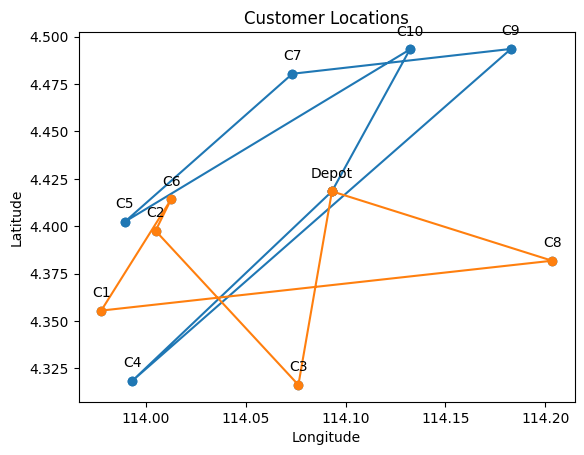

Iteration 1: Best Cost = 158.68531484343714
Iteration 2: Best Cost = 153.14005459623309
Iteration 3: Best Cost = 147.19470305788474
Iteration 4: Best Cost = 124.85877092916144
Iteration 5: Best Cost = 119.54640975957287
Iteration 6: Best Cost = 102.20349767729557
Iteration 7: Best Cost = 98.08080980432054
Iteration 8: Best Cost = 92.05387611387835
Iteration 9: Best Cost = 92.05387611387835
Iteration 10: Best Cost = 92.05387611387835
Iteration 11: Best Cost = 92.05387611387835
Iteration 12: Best Cost = 92.05387611387835
Iteration 13: Best Cost = 92.05387611387835
Iteration 14: Best Cost = 92.05387611387835
Iteration 15: Best Cost = 92.05387611387835
Iteration 16: Best Cost = 92.05387611387835
Iteration 17: Best Cost = 92.05387611387835
Iteration 18: Best Cost = 92.05387611387835
Iteration 19: Best Cost = 92.05387611387835
Iteration 20: Best Cost = 92.05387611387835
Iteration 21: Best Cost = 92.05387611387835
Iteration 22: Best Cost = 92.05387611387835
Iteration 23: Best Cost = 92.053876

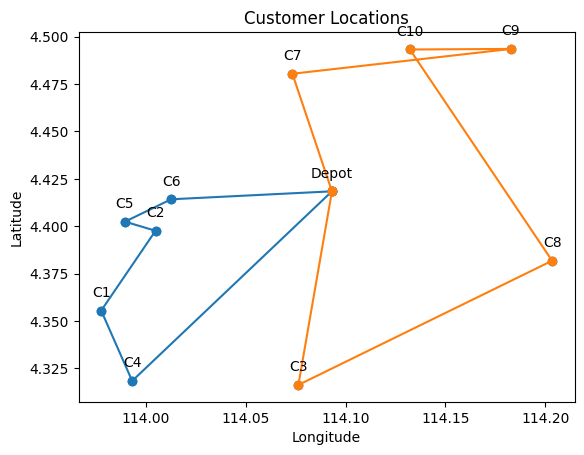

Total Distance = 140.2418 km
Total Cost = RM 210.36

Vehicle 1 (Type B):
Round Trip Distance:73.564 km, Cost: RM 110.35, Demand:30
Depot -> C10 (8.436 km) -> C5 (16.905 km) -> C8 (21.479 km) -> C1 (22.723 km) -> C4 (4.021 km)

Vehicle 2 (Type B):
Round Trip Distance:66.678 km, Cost: RM 100.02, Demand:27
Depot -> C2 (9.072 km) -> C7 (10.746 km) -> C3 (16.413 km) -> C6 (11.68 km) -> C9 (18.768 km)



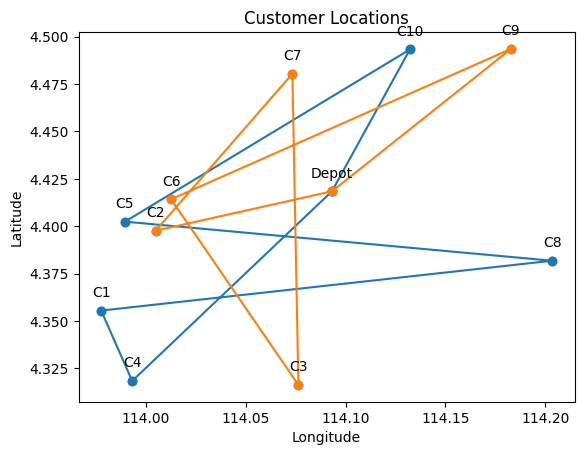

Iteration 1: Best Cost = 198.99981390552117
Iteration 2: Best Cost = 196.42954804726415
Iteration 3: Best Cost = 175.43619566051962
Iteration 4: Best Cost = 167.64396003998104
Iteration 5: Best Cost = 164.9115836312713
Iteration 6: Best Cost = 153.95308858058692
Iteration 7: Best Cost = 142.53624411461968
Iteration 8: Best Cost = 136.60440203441902
Iteration 9: Best Cost = 135.6942426424264
Iteration 10: Best Cost = 118.01221443921523
Iteration 11: Best Cost = 114.95123728489219
Iteration 12: Best Cost = 104.90515468276212
Iteration 13: Best Cost = 103.77435212828917
Iteration 14: Best Cost = 103.77435212828917
Iteration 15: Best Cost = 103.77435212828917
Iteration 16: Best Cost = 103.77435212828917
Iteration 17: Best Cost = 103.77435212828917
Iteration 18: Best Cost = 103.77435212828917
Iteration 19: Best Cost = 103.77435212828917
Iteration 20: Best Cost = 103.77435212828917
Iteration 21: Best Cost = 103.77435212828917
Iteration 22: Best Cost = 103.77435212828917
Iteration 23: Best Co

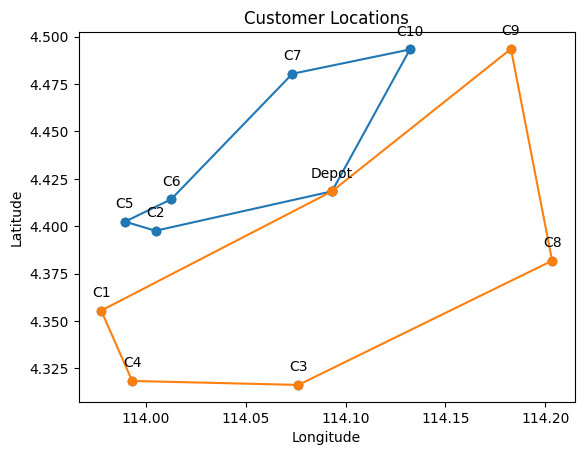

Total Distance = 113.4311 km
Total Cost = RM 170.15

Vehicle 1 (Type B):
Round Trip Distance:53.71 km, Cost: RM 80.56, Demand:30
Depot -> C3 (10.347 km) -> C2 (10.827 km) -> C6 (1.834 km) -> C8 (19.343 km) -> C9 (11.358 km)

Vehicle 2 (Type B):
Round Trip Distance:59.721 km, Cost: RM 89.58, Demand:27
Depot -> C1 (13.152 km) -> C10 (20.696 km) -> C7 (6.018 km) -> C5 (11.448 km) -> C4 (8.408 km)



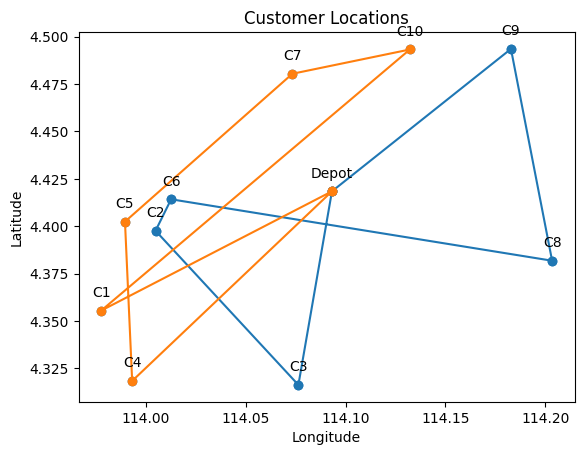

Iteration 1: Best Cost = 160.27538934901992
Iteration 2: Best Cost = 121.60607472874482
Iteration 3: Best Cost = 112.26978886346559
Iteration 4: Best Cost = 105.6435326811183
Iteration 5: Best Cost = 94.586643041406
Iteration 6: Best Cost = 82.41806885863852
Iteration 7: Best Cost = 82.41806885863852
Iteration 8: Best Cost = 82.41806885863852
Iteration 9: Best Cost = 82.41806885863852
Iteration 10: Best Cost = 82.41806885863852
Iteration 11: Best Cost = 82.41806885863852
Iteration 12: Best Cost = 82.41806885863852
Iteration 13: Best Cost = 82.41806885863852
Iteration 14: Best Cost = 82.41806885863852
Iteration 15: Best Cost = 82.41806885863852
Iteration 16: Best Cost = 82.41806885863852
Iteration 17: Best Cost = 82.41806885863852
Iteration 18: Best Cost = 82.41806885863852
Iteration 19: Best Cost = 82.41806885863852
Iteration 20: Best Cost = 82.41806885863852
Iteration 21: Best Cost = 82.41806885863852
Iteration 22: Best Cost = 82.41806885863852
Iteration 23: Best Cost = 82.41806885863

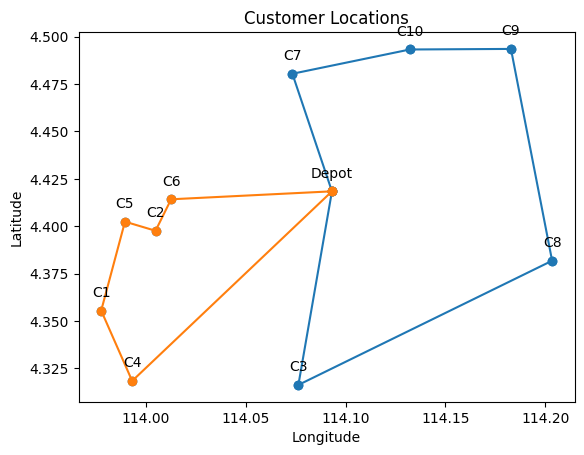

Total Distance = 126.3162 km
Total Cost = RM 189.47

Vehicle 1 (Type B):
Round Trip Distance:51.639 km, Cost: RM 77.46, Demand:27
Depot -> C10 (8.436 km) -> C3 (18.549 km) -> C5 (12.226 km) -> C4 (8.408 km) -> C1 (4.021 km)

Vehicle 2 (Type B):
Round Trip Distance:74.677 km, Cost: RM 112.02, Demand:30
Depot -> C6 (8.061 km) -> C8 (19.343 km) -> C7 (16.316 km) -> C2 (10.746 km) -> C9 (20.21 km)



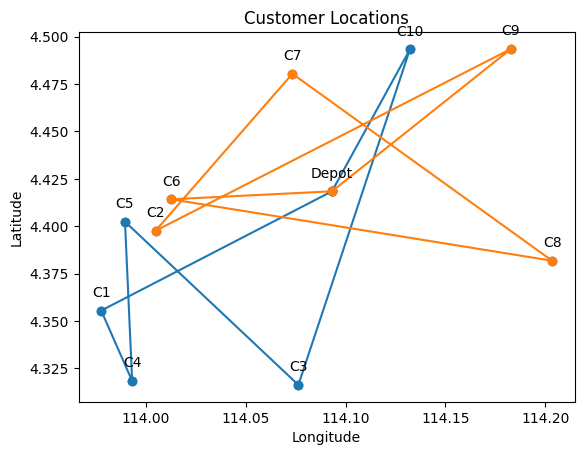

Iteration 1: Best Cost = 184.6393138644155
Iteration 2: Best Cost = 171.0121089279499
Iteration 3: Best Cost = 134.57794262530336
Iteration 4: Best Cost = 128.81335040799726
Iteration 5: Best Cost = 124.94539593146473
Iteration 6: Best Cost = 103.72918315859827
Iteration 7: Best Cost = 102.09586218033905
Iteration 8: Best Cost = 102.09586218033905
Iteration 9: Best Cost = 102.09586218033905
Iteration 10: Best Cost = 102.09586218033905
Iteration 11: Best Cost = 102.09586218033905
Iteration 12: Best Cost = 102.09586218033905
Iteration 13: Best Cost = 102.09586218033905
Iteration 14: Best Cost = 102.09586218033905
Iteration 15: Best Cost = 102.09586218033905
Iteration 16: Best Cost = 102.09586218033905
Iteration 17: Best Cost = 102.09586218033905
Iteration 18: Best Cost = 102.09586218033905
Iteration 19: Best Cost = 102.09586218033905
Iteration 20: Best Cost = 102.09586218033905
Iteration 21: Best Cost = 102.09586218033905
Iteration 22: Best Cost = 102.09586218033905
Iteration 23: Best Co

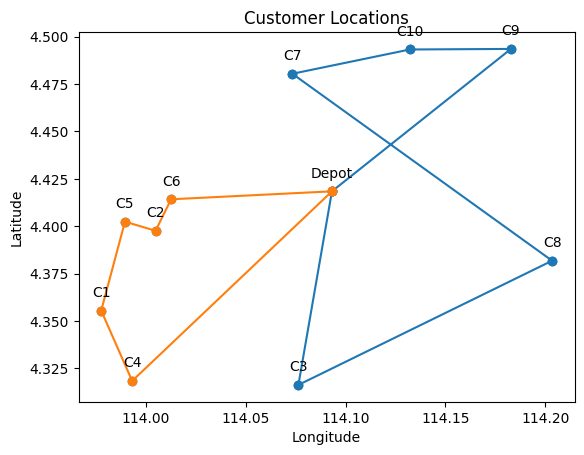

Total Distance = 117.4776 km
Total Cost = RM 176.22

Vehicle 1 (Type B):
Round Trip Distance:69.945 km, Cost: RM 104.92, Demand:30
Depot -> C7 (6.508 km) -> C9 (11.018 km) -> C5 (21.36 km) -> C3 (12.226 km) -> C2 (10.827 km) -> C4 (8.006 km)

Vehicle 2 (Type B):
Round Trip Distance:47.532 km, Cost: RM 71.3, Demand:27
Depot -> C1 (13.152 km) -> C6 (6.834 km) -> C10 (14.325 km) -> C8 (13.221 km)



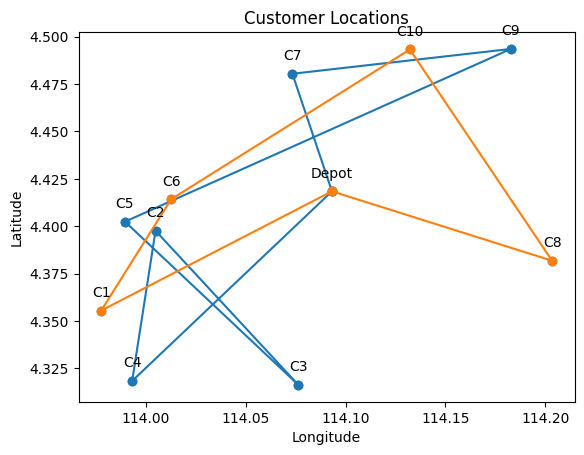

Iteration 1: Best Cost = 174.72377877936702
Iteration 2: Best Cost = 173.87684220398955
Iteration 3: Best Cost = 173.463781634978
Iteration 4: Best Cost = 155.48986697376213
Iteration 5: Best Cost = 136.94027850601714
Iteration 6: Best Cost = 133.97222366673674
Iteration 7: Best Cost = 132.5786028584776
Iteration 8: Best Cost = 125.78557524114217
Iteration 9: Best Cost = 119.77182245902495
Iteration 10: Best Cost = 113.53588159978955
Iteration 11: Best Cost = 113.53588159978955
Iteration 12: Best Cost = 113.53588159978955
Iteration 13: Best Cost = 113.53588159978955
Iteration 14: Best Cost = 113.53588159978955
Iteration 15: Best Cost = 113.53588159978955
Iteration 16: Best Cost = 113.53588159978955
Iteration 17: Best Cost = 113.53588159978955
Iteration 18: Best Cost = 113.53588159978955
Iteration 19: Best Cost = 113.53588159978955
Iteration 20: Best Cost = 113.53588159978955
Iteration 21: Best Cost = 113.53588159978955
Iteration 22: Best Cost = 113.53588159978955
Iteration 23: Best Cos

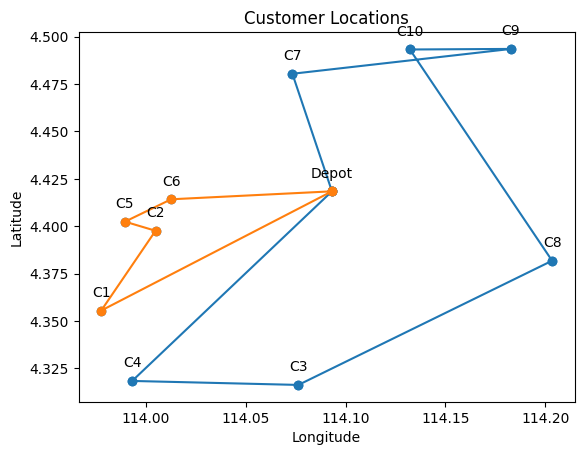

Total Distance = 122.7908 km
Total Cost = RM 184.19

Vehicle 1 (Type B):
Round Trip Distance:49.783 km, Cost: RM 74.67, Demand:30
Depot -> C8 (11.612 km) -> C2 (19.913 km) -> C1 (5.012 km) -> C5 (4.839 km) -> C4 (8.408 km)

Vehicle 2 (Type B):
Round Trip Distance:73.008 km, Cost: RM 109.51, Demand:27
Depot -> C3 (10.347 km) -> C10 (18.549 km) -> C6 (14.325 km) -> C9 (18.768 km) -> C7 (11.018 km)



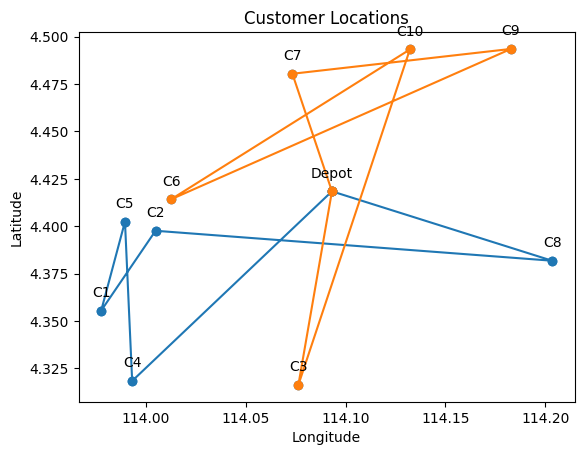

Iteration 1: Best Cost = 171.62155802104002
Iteration 2: Best Cost = 169.31742340808404
Iteration 3: Best Cost = 162.73525978622882
Iteration 4: Best Cost = 160.80262812755146
Iteration 5: Best Cost = 150.47312399954973
Iteration 6: Best Cost = 145.19081866849567
Iteration 7: Best Cost = 142.286096490807
Iteration 8: Best Cost = 124.70236644829072
Iteration 9: Best Cost = 122.13427450571194
Iteration 10: Best Cost = 118.66360738254043
Iteration 11: Best Cost = 112.16793082354332
Iteration 12: Best Cost = 111.50609364734936
Iteration 13: Best Cost = 111.50609364734936
Iteration 14: Best Cost = 111.50609364734936
Iteration 15: Best Cost = 111.50609364734936
Iteration 16: Best Cost = 111.50609364734936
Iteration 17: Best Cost = 111.50609364734936
Iteration 18: Best Cost = 111.50609364734936
Iteration 19: Best Cost = 111.50609364734936
Iteration 20: Best Cost = 111.50609364734936
Iteration 21: Best Cost = 111.50609364734936
Iteration 22: Best Cost = 111.50609364734936
Iteration 23: Best Co

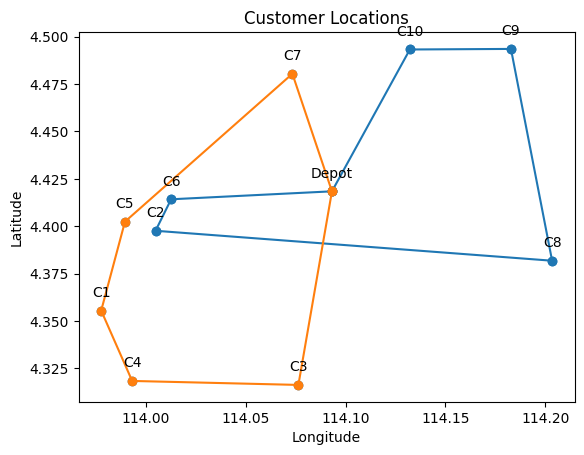

Total Distance = 118.5909 km
Total Cost = RM 154.95

Vehicle 1 (Type A):
Round Trip Distance:53.732 km, Cost: RM 64.48, Demand:22
Depot -> C5 (10.483 km) -> C3 (12.226 km) -> C6 (11.68 km) -> C8 (19.343 km)

Vehicle 2 (Type A):
Round Trip Distance:22.709 km, Cost: RM 27.25, Demand:8
Depot -> C9 (11.691 km) -> C7 (11.018 km)

Vehicle 3 (Type B):
Round Trip Distance:42.15 km, Cost: RM 63.22, Demand:27
Depot -> C10 (8.436 km) -> C1 (20.696 km) -> C2 (5.012 km) -> C4 (8.006 km)



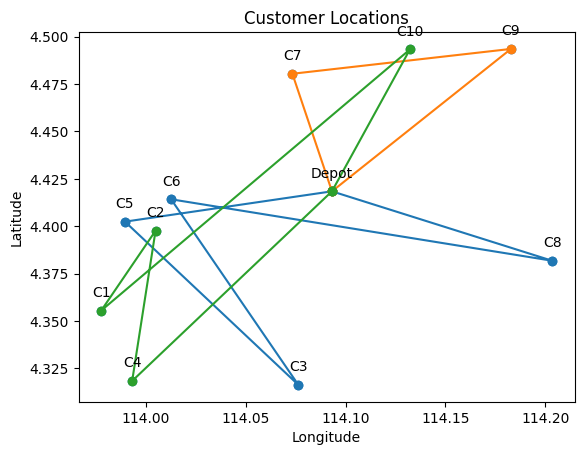

Iteration 1: Best Cost = 148.01889896635248
Iteration 2: Best Cost = 147.68559869402054
Iteration 3: Best Cost = 144.87760590584946
Iteration 4: Best Cost = 138.60495521406096
Iteration 5: Best Cost = 128.79018430958087
Iteration 6: Best Cost = 127.35607252504732
Iteration 7: Best Cost = 118.4611129977592
Iteration 8: Best Cost = 112.97256963333476
Iteration 9: Best Cost = 104.91275277164797
Iteration 10: Best Cost = 103.44955147550967
Iteration 11: Best Cost = 102.3673025018951
Iteration 12: Best Cost = 92.01460358586883
Iteration 13: Best Cost = 88.10808457484003
Iteration 14: Best Cost = 88.10808457484003
Iteration 15: Best Cost = 88.10808457484003
Iteration 16: Best Cost = 88.10808457484003
Iteration 17: Best Cost = 88.10808457484003
Iteration 18: Best Cost = 88.10808457484003
Iteration 19: Best Cost = 88.10808457484003
Iteration 20: Best Cost = 88.10808457484003
Iteration 21: Best Cost = 88.10808457484003
Iteration 22: Best Cost = 88.10808457484003
Iteration 23: Best Cost = 88.108

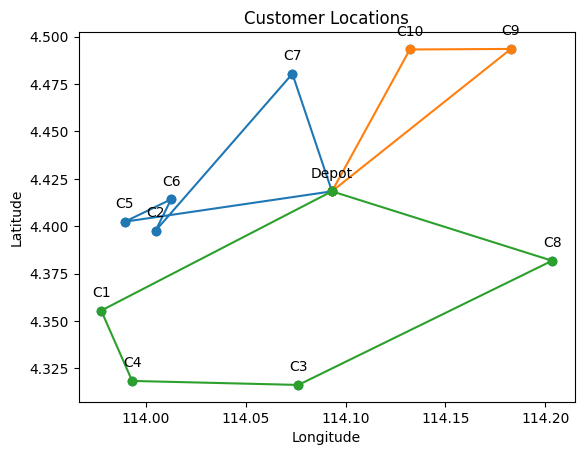

Total Distance = 149.7486 km
Total Cost = RM 201.92

Vehicle 1 (Type A):
Round Trip Distance:65.032 km, Cost: RM 78.04, Demand:18
Depot -> C3 (10.347 km) -> C7 (16.413 km) -> C8 (16.316 km) -> C4 (21.955 km)

Vehicle 2 (Type A):
Round Trip Distance:10.655 km, Cost: RM 12.79, Demand:13
Depot -> C6 (8.061 km) -> C5 (2.594 km)

Vehicle 3 (Type B):
Round Trip Distance:74.062 km, Cost: RM 111.09, Demand:26
Depot -> C10 (8.436 km) -> C1 (20.696 km) -> C9 (24.72 km) -> C2 (20.21 km)



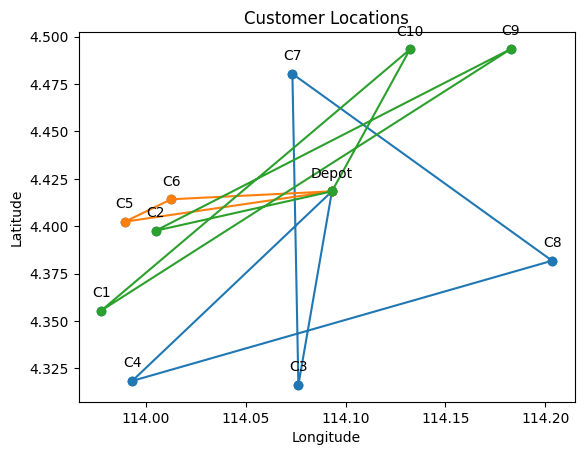

Iteration 1: Best Cost = 183.96525890787353
Iteration 2: Best Cost = 141.33188035233974
Iteration 3: Best Cost = 135.62168125107607
Iteration 4: Best Cost = 124.21364650969392
Iteration 5: Best Cost = 124.1518255408501
Iteration 6: Best Cost = 122.22765202266862
Iteration 7: Best Cost = 119.58092951106428
Iteration 8: Best Cost = 111.42038674986927
Iteration 9: Best Cost = 111.1428248602418
Iteration 10: Best Cost = 106.4977654343231
Iteration 11: Best Cost = 106.4977654343231
Iteration 12: Best Cost = 106.4977654343231
Iteration 13: Best Cost = 106.4977654343231
Iteration 14: Best Cost = 106.4977654343231
Iteration 15: Best Cost = 106.4977654343231
Iteration 16: Best Cost = 106.4977654343231
Iteration 17: Best Cost = 106.4977654343231
Iteration 18: Best Cost = 106.4977654343231
Iteration 19: Best Cost = 106.4977654343231
Iteration 20: Best Cost = 106.4977654343231
Iteration 21: Best Cost = 106.4977654343231
Iteration 22: Best Cost = 106.4977654343231
Iteration 23: Best Cost = 106.4977

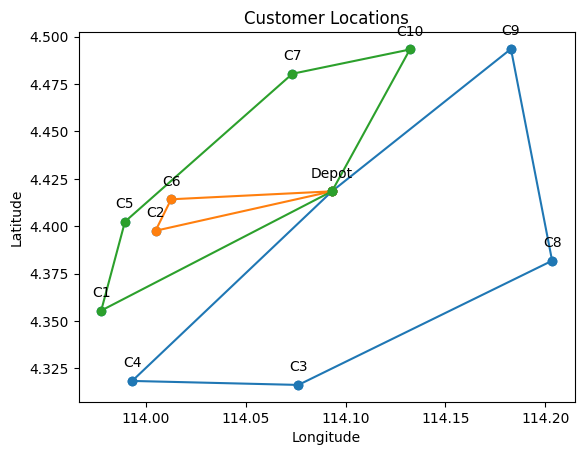

Total Distance = 149.3368 km
Total Cost = RM 204.15

Vehicle 1 (Type A):
Round Trip Distance:44.04 km, Cost: RM 52.85, Demand:16
Depot -> C9 (11.691 km) -> C3 (20.669 km) -> C6 (11.68 km)

Vehicle 2 (Type B):
Round Trip Distance:83.149 km, Cost: RM 124.72, Demand:27
Depot -> C7 (6.508 km) -> C8 (16.316 km) -> C1 (22.723 km) -> C10 (20.696 km) -> C5 (16.905 km)

Vehicle 3 (Type A):
Round Trip Distance:22.148 km, Cost: RM 26.58, Demand:14
Depot -> C4 (14.142 km) -> C2 (8.006 km)



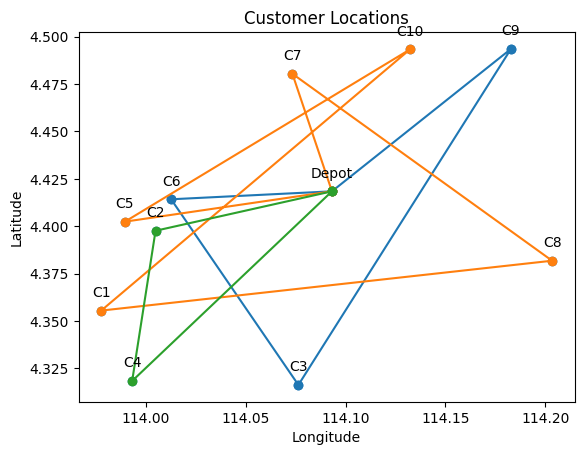

Iteration 1: Best Cost = 203.15270770982386
Iteration 2: Best Cost = 174.60252426389843
Iteration 3: Best Cost = 156.4755365587343
Iteration 4: Best Cost = 148.52553270233236
Iteration 5: Best Cost = 147.37801658220275
Iteration 6: Best Cost = 147.07206324617223
Iteration 7: Best Cost = 147.04737304764367
Iteration 8: Best Cost = 145.16730048977215
Iteration 9: Best Cost = 134.1777550610036
Iteration 10: Best Cost = 131.18164970769152
Iteration 11: Best Cost = 127.18202769103146
Iteration 12: Best Cost = 105.95045654904484
Iteration 13: Best Cost = 104.95253444698879
Iteration 14: Best Cost = 100.38393979269848
Iteration 15: Best Cost = 100.38393979269848
Iteration 16: Best Cost = 100.38393979269848
Iteration 17: Best Cost = 100.38393979269848
Iteration 18: Best Cost = 100.38393979269848
Iteration 19: Best Cost = 100.38393979269848
Iteration 20: Best Cost = 100.38393979269848
Iteration 21: Best Cost = 100.38393979269848
Iteration 22: Best Cost = 100.38393979269848
Iteration 23: Best Co

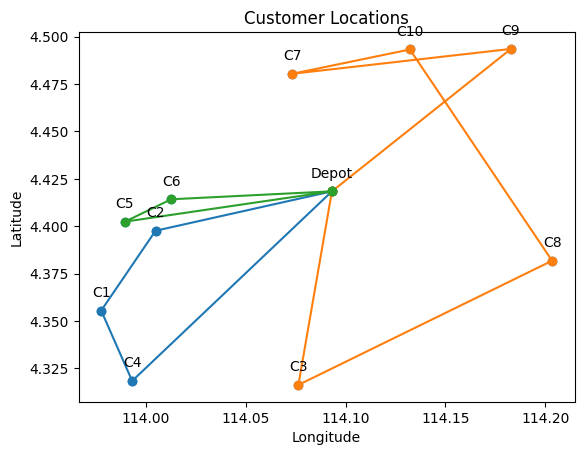

Total Distance = 137.8399 km
Total Cost = RM 165.41

Vehicle 1 (Type A):
Round Trip Distance:37.293 km, Cost: RM 44.75, Demand:18
Depot -> C9 (11.691 km) -> C6 (18.768 km) -> C1 (6.834 km)

Vehicle 2 (Type A):
Round Trip Distance:44.78 km, Cost: RM 53.74, Demand:15
Depot -> C7 (6.508 km) -> C8 (16.316 km) -> C4 (21.955 km)

Vehicle 3 (Type A):
Round Trip Distance:55.767 km, Cost: RM 66.92, Demand:24
Depot -> C2 (9.072 km) -> C10 (15.92 km) -> C3 (18.549 km) -> C5 (12.226 km)



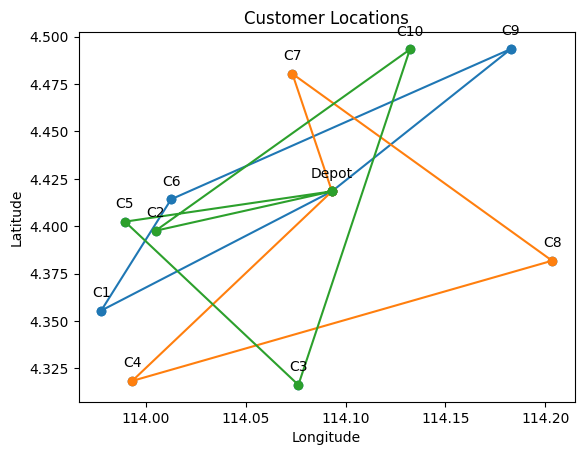

Iteration 1: Best Cost = 133.15793541249207
Iteration 2: Best Cost = 124.94568228418531
Iteration 3: Best Cost = 115.04147675374398
Iteration 4: Best Cost = 97.34877309510625
Iteration 5: Best Cost = 93.44225408407743
Iteration 6: Best Cost = 89.69579412857661
Iteration 7: Best Cost = 89.69579412857661
Iteration 8: Best Cost = 89.69579412857661
Iteration 9: Best Cost = 89.69579412857661
Iteration 10: Best Cost = 89.69579412857661
Iteration 11: Best Cost = 89.69579412857661
Iteration 12: Best Cost = 89.69579412857661
Iteration 13: Best Cost = 89.69579412857661
Iteration 14: Best Cost = 89.69579412857661
Iteration 15: Best Cost = 89.69579412857661
Iteration 16: Best Cost = 89.69579412857661
Iteration 17: Best Cost = 89.69579412857661
Iteration 18: Best Cost = 89.69579412857661
Iteration 19: Best Cost = 89.69579412857661
Iteration 20: Best Cost = 89.69579412857661
Iteration 21: Best Cost = 89.69579412857661
Iteration 22: Best Cost = 89.69579412857661
Iteration 23: Best Cost = 89.695794128

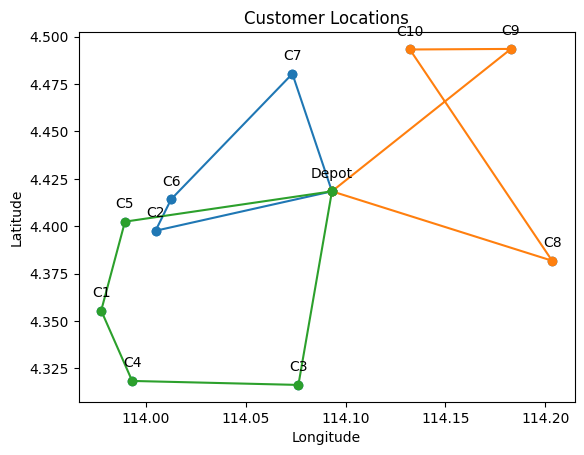

Total Distance = 134.0616 km
Total Cost = RM 183.3

Vehicle 1 (Type B):
Round Trip Distance:74.737 km, Cost: RM 112.11, Demand:30
Depot -> C3 (10.347 km) -> C6 (11.68 km) -> C10 (14.325 km) -> C5 (16.905 km) -> C8 (21.479 km)

Vehicle 2 (Type A):
Round Trip Distance:17.078 km, Cost: RM 20.49, Demand:14
Depot -> C2 (9.072 km) -> C4 (8.006 km)

Vehicle 3 (Type A):
Round Trip Distance:42.247 km, Cost: RM 50.7, Demand:13
Depot -> C7 (6.508 km) -> C9 (11.018 km) -> C1 (24.72 km)



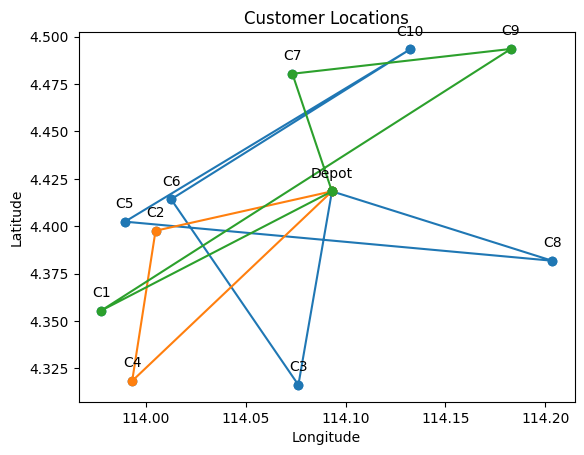

Iteration 1: Best Cost = 142.2999631650829
Iteration 2: Best Cost = 107.07305164158402
Iteration 3: Best Cost = 106.36254114624226
Iteration 4: Best Cost = 105.20525023301211
Iteration 5: Best Cost = 104.78219170805515
Iteration 6: Best Cost = 98.0901184239937
Iteration 7: Best Cost = 98.0901184239937
Iteration 8: Best Cost = 98.0901184239937
Iteration 9: Best Cost = 98.0901184239937
Iteration 10: Best Cost = 98.0901184239937
Iteration 11: Best Cost = 98.0901184239937
Iteration 12: Best Cost = 98.0901184239937
Iteration 13: Best Cost = 98.0901184239937
Iteration 14: Best Cost = 98.0901184239937
Iteration 15: Best Cost = 98.0901184239937
Iteration 16: Best Cost = 98.0901184239937
Iteration 17: Best Cost = 98.0901184239937
Iteration 18: Best Cost = 98.0901184239937
Iteration 19: Best Cost = 98.0901184239937
Iteration 20: Best Cost = 98.0901184239937
Iteration 21: Best Cost = 98.0901184239937
Iteration 22: Best Cost = 98.0901184239937
Iteration 23: Best Cost = 98.0901184239937
Iteration 2

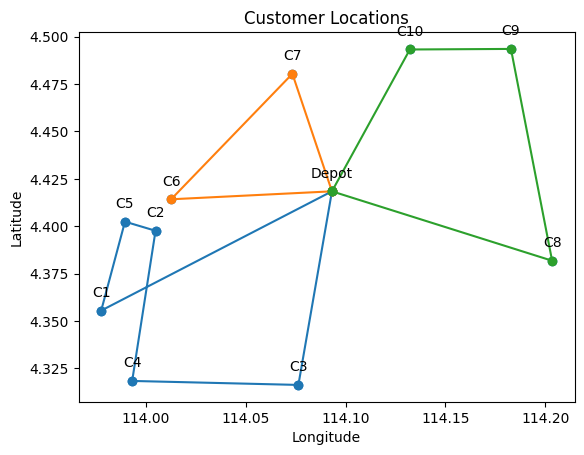

Total Distance = 126.1199 km
Total Cost = RM 151.34

Vehicle 1 (Type A):
Round Trip Distance:24.992 km, Cost: RM 29.99, Demand:16
Depot -> C2 (9.072 km) -> C10 (15.92 km)

Vehicle 2 (Type A):
Round Trip Distance:54.861 km, Cost: RM 65.83, Demand:22
Depot -> C8 (11.612 km) -> C6 (19.343 km) -> C3 (11.68 km) -> C5 (12.226 km)

Vehicle 3 (Type A):
Round Trip Distance:46.267 km, Cost: RM 55.52, Demand:19
Depot -> C1 (13.152 km) -> C4 (4.021 km) -> C7 (18.077 km) -> C9 (11.018 km)



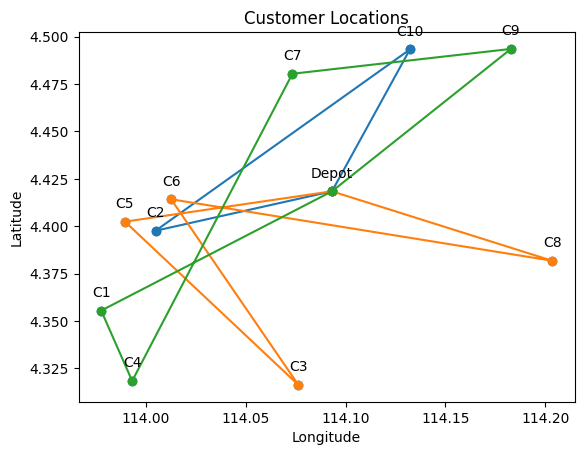

Iteration 1: Best Cost = 147.04908372437419
Iteration 2: Best Cost = 136.40122320796434
Iteration 3: Best Cost = 129.44026536779478
Iteration 4: Best Cost = 109.57201775105281
Iteration 5: Best Cost = 104.3915464310952
Iteration 6: Best Cost = 96.36461583311933
Iteration 7: Best Cost = 93.02430698127333
Iteration 8: Best Cost = 80.85573279850583
Iteration 9: Best Cost = 79.64286084966542
Iteration 10: Best Cost = 79.64286084966542
Iteration 11: Best Cost = 79.64286084966542
Iteration 12: Best Cost = 79.64286084966542
Iteration 13: Best Cost = 79.64286084966542
Iteration 14: Best Cost = 79.64286084966542
Iteration 15: Best Cost = 79.64286084966542
Iteration 16: Best Cost = 79.64286084966542
Iteration 17: Best Cost = 79.64286084966542
Iteration 18: Best Cost = 79.64286084966542
Iteration 19: Best Cost = 79.64286084966542
Iteration 20: Best Cost = 79.64286084966542
Iteration 21: Best Cost = 79.64286084966542
Iteration 22: Best Cost = 79.64286084966542
Iteration 23: Best Cost = 79.64286084

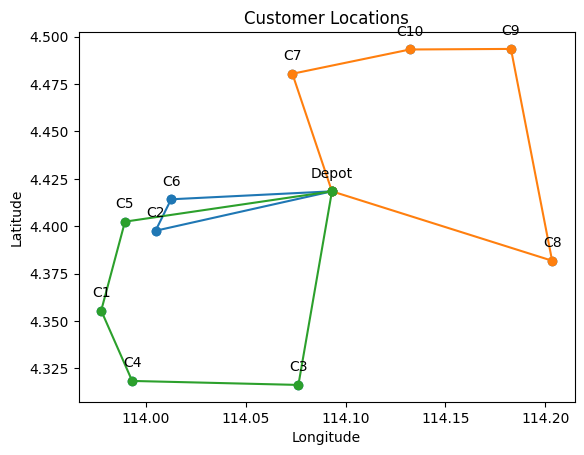

Total Distance = 136.8623 km
Total Cost = RM 188.82

Vehicle 1 (Type A):
Round Trip Distance:17.99 km, Cost: RM 21.59, Demand:10
Depot -> C1 (13.152 km) -> C5 (4.839 km)

Vehicle 2 (Type A):
Round Trip Distance:36.91 km, Cost: RM 44.29, Demand:17
Depot -> C8 (11.612 km) -> C7 (16.316 km) -> C6 (8.982 km)

Vehicle 3 (Type B):
Round Trip Distance:81.962 km, Cost: RM 122.94, Demand:30
Depot -> C2 (9.072 km) -> C9 (20.21 km) -> C4 (25.809 km) -> C3 (8.323 km) -> C10 (18.549 km)



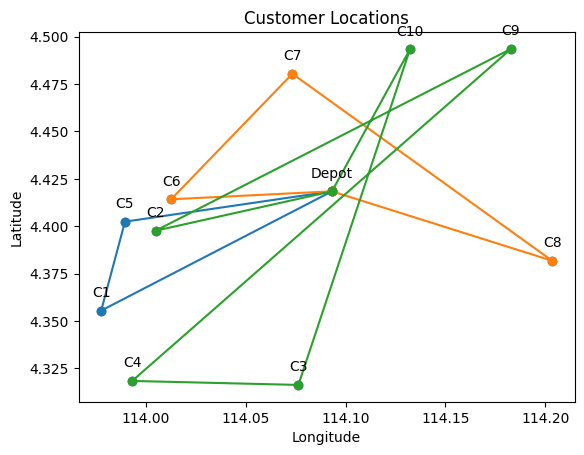

Iteration 1: Best Cost = 139.6550139643875
Iteration 2: Best Cost = 139.6507752661497
Iteration 3: Best Cost = 137.43388558981155
Iteration 4: Best Cost = 135.48318580297968
Iteration 5: Best Cost = 132.66237949922268
Iteration 6: Best Cost = 119.179390222904
Iteration 7: Best Cost = 107.99069394682924
Iteration 8: Best Cost = 106.87057348595414
Iteration 9: Best Cost = 104.09261484946227
Iteration 10: Best Cost = 97.83036513577439
Iteration 11: Best Cost = 94.01889145760069
Iteration 12: Best Cost = 94.01889145760069
Iteration 13: Best Cost = 94.01889145760069
Iteration 14: Best Cost = 94.01889145760069
Iteration 15: Best Cost = 94.01889145760069
Iteration 16: Best Cost = 94.01889145760069
Iteration 17: Best Cost = 94.01889145760069
Iteration 18: Best Cost = 94.01889145760069
Iteration 19: Best Cost = 94.01889145760069
Iteration 20: Best Cost = 94.01889145760069
Iteration 21: Best Cost = 94.01889145760069
Iteration 22: Best Cost = 94.01889145760069
Iteration 23: Best Cost = 94.0188914

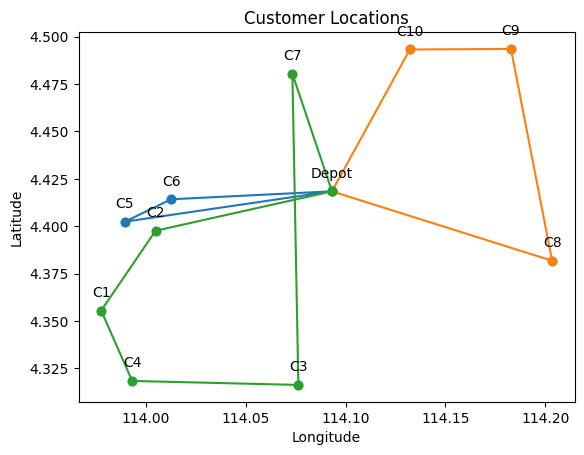

Total Distance = 124.9896 km
Total Cost = RM 149.99

Vehicle 1 (Type A):
Round Trip Distance:30.769 km, Cost: RM 36.92, Demand:14
Depot -> C10 (8.436 km) -> C4 (22.333 km)

Vehicle 2 (Type A):
Round Trip Distance:52.251 km, Cost: RM 62.7, Demand:21
Depot -> C9 (11.691 km) -> C1 (24.72 km) -> C2 (5.012 km) -> C3 (10.827 km)

Vehicle 3 (Type A):
Round Trip Distance:41.97 km, Cost: RM 50.36, Demand:22
Depot -> C8 (11.612 km) -> C7 (16.316 km) -> C5 (11.448 km) -> C6 (2.594 km)



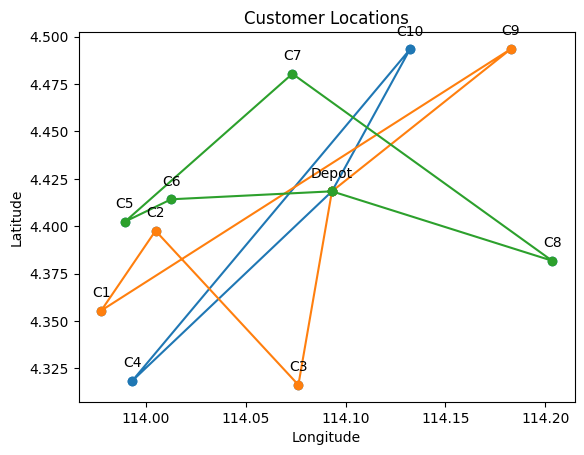

Iteration 1: Best Cost = 149.70382226668116
Iteration 2: Best Cost = 148.93657657800028
Iteration 3: Best Cost = 146.6543522065922
Iteration 4: Best Cost = 143.25421073397916
Iteration 5: Best Cost = 141.23250956383885
Iteration 6: Best Cost = 140.94885325013976
Iteration 7: Best Cost = 140.1816075614589
Iteration 8: Best Cost = 131.94922804213144
Iteration 9: Best Cost = 130.82910758125635
Iteration 10: Best Cost = 115.77069732661857
Iteration 11: Best Cost = 112.24029780906235
Iteration 12: Best Cost = 106.86771059600898
Iteration 13: Best Cost = 103.02950456272296
Iteration 14: Best Cost = 102.28957289813394
Iteration 15: Best Cost = 102.22693563307097
Iteration 16: Best Cost = 101.57435563438224
Iteration 17: Best Cost = 95.31210592069436
Iteration 18: Best Cost = 90.51180342624949
Iteration 19: Best Cost = 90.51180342624949
Iteration 20: Best Cost = 90.51180342624949
Iteration 21: Best Cost = 90.51180342624949
Iteration 22: Best Cost = 90.51180342624949
Iteration 23: Best Cost = 9

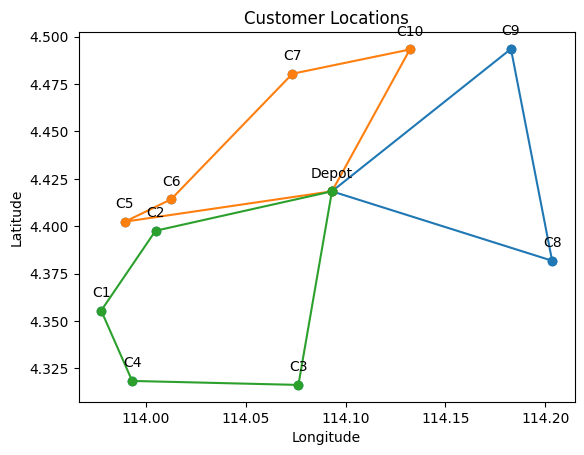

Total Distance = 125.8339 km
Total Cost = RM 168.19

Vehicle 1 (Type B):
Round Trip Distance:57.288 km, Cost: RM 85.93, Demand:26
Depot -> C9 (11.691 km) -> C1 (24.72 km) -> C6 (6.834 km) -> C5 (2.594 km) -> C7 (11.448 km)

Vehicle 2 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 3 (Type A):
Round Trip Distance:56.934 km, Cost: RM 68.32, Demand:25
Depot -> C4 (14.142 km) -> C3 (8.323 km) -> C10 (18.549 km) -> C2 (15.92 km)



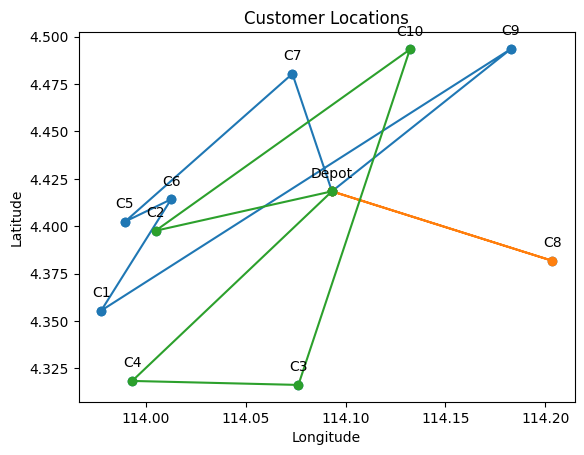

Iteration 1: Best Cost = 141.53715095034948
Iteration 2: Best Cost = 140.14220612118072
Iteration 3: Best Cost = 139.90567845831237
Iteration 4: Best Cost = 126.39833715408403
Iteration 5: Best Cost = 118.74303734956382
Iteration 6: Best Cost = 111.08748017947634
Iteration 7: Best Cost = 105.07866040552801
Iteration 8: Best Cost = 104.17401836194966
Iteration 9: Best Cost = 104.17401836194966
Iteration 10: Best Cost = 104.17401836194966
Iteration 11: Best Cost = 104.17401836194966
Iteration 12: Best Cost = 104.17401836194966
Iteration 13: Best Cost = 104.17401836194966
Iteration 14: Best Cost = 104.17401836194966
Iteration 15: Best Cost = 104.17401836194966
Iteration 16: Best Cost = 104.17401836194966
Iteration 17: Best Cost = 104.17401836194966
Iteration 18: Best Cost = 104.17401836194966
Iteration 19: Best Cost = 104.17401836194966
Iteration 20: Best Cost = 104.17401836194966
Iteration 21: Best Cost = 104.17401836194966
Iteration 22: Best Cost = 104.17401836194966
Iteration 23: Best 

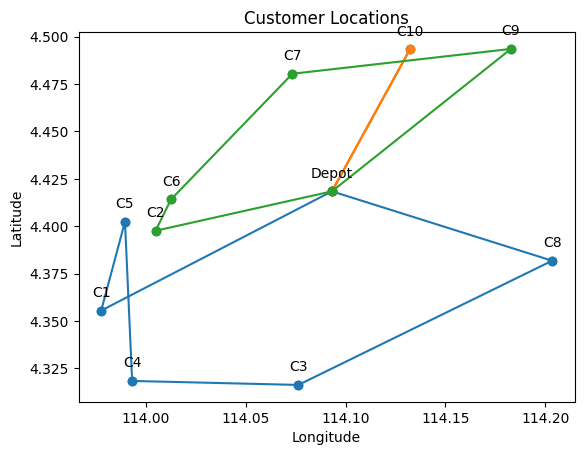

Total Distance = 120.6671 km
Total Cost = RM 163.45

Vehicle 1 (Type B):
Round Trip Distance:62.15 km, Cost: RM 93.23, Demand:27
Depot -> C7 (6.508 km) -> C10 (6.018 km) -> C5 (16.905 km) -> C9 (21.36 km) -> C8 (11.358 km)

Vehicle 2 (Type A):
Round Trip Distance:34.598 km, Cost: RM 41.52, Demand:16
Depot -> C1 (13.152 km) -> C3 (10.62 km) -> C2 (10.827 km)

Vehicle 3 (Type A):
Round Trip Distance:23.919 km, Cost: RM 28.7, Demand:14
Depot -> C4 (14.142 km) -> C6 (9.776 km)



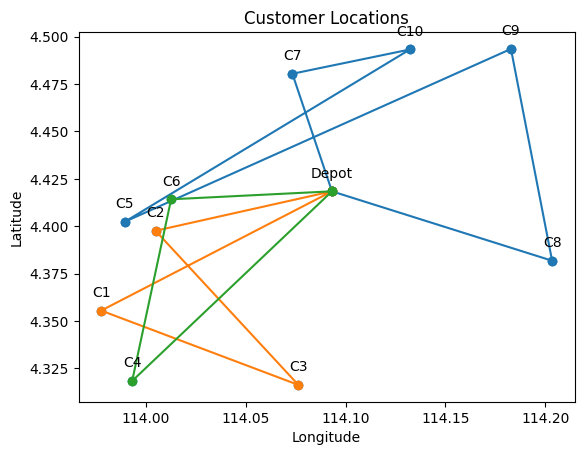

Iteration 1: Best Cost = 162.3447633774505
Iteration 2: Best Cost = 144.18055967133714
Iteration 3: Best Cost = 139.07512139536277
Iteration 4: Best Cost = 114.11132013907782
Iteration 5: Best Cost = 107.24356525629045
Iteration 6: Best Cost = 106.60555285023226
Iteration 7: Best Cost = 103.82759421374038
Iteration 8: Best Cost = 103.07532175894733
Iteration 9: Best Cost = 101.15780730477906
Iteration 10: Best Cost = 101.15780730477906
Iteration 11: Best Cost = 101.15780730477906
Iteration 12: Best Cost = 101.15780730477906
Iteration 13: Best Cost = 101.15780730477906
Iteration 14: Best Cost = 101.15780730477906
Iteration 15: Best Cost = 101.15780730477906
Iteration 16: Best Cost = 101.15780730477906
Iteration 17: Best Cost = 101.15780730477906
Iteration 18: Best Cost = 101.15780730477906
Iteration 19: Best Cost = 101.15780730477906
Iteration 20: Best Cost = 101.15780730477906
Iteration 21: Best Cost = 101.15780730477906
Iteration 22: Best Cost = 101.15780730477906
Iteration 23: Best C

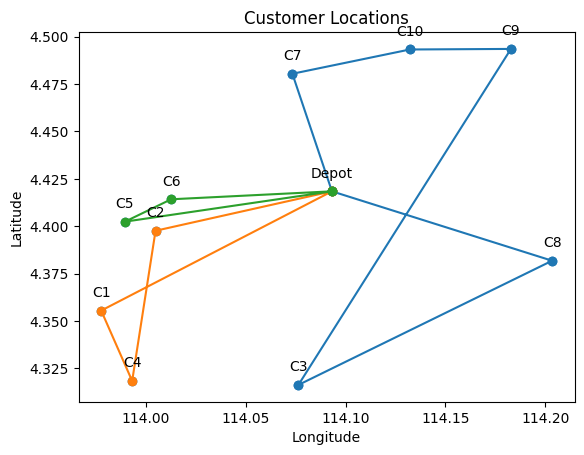

Total Distance = 129.4263 km
Total Cost = RM 155.31

Vehicle 1 (Type A):
Round Trip Distance:25.267 km, Cost: RM 30.32, Demand:17
Depot -> C7 (6.508 km) -> C6 (8.982 km) -> C4 (9.776 km)

Vehicle 2 (Type A):
Round Trip Distance:54.568 km, Cost: RM 65.48, Demand:24
Depot -> C9 (11.691 km) -> C5 (21.36 km) -> C2 (1.604 km) -> C8 (19.913 km)

Vehicle 3 (Type A):
Round Trip Distance:49.592 km, Cost: RM 59.51, Demand:16
Depot -> C3 (10.347 km) -> C10 (18.549 km) -> C1 (20.696 km)



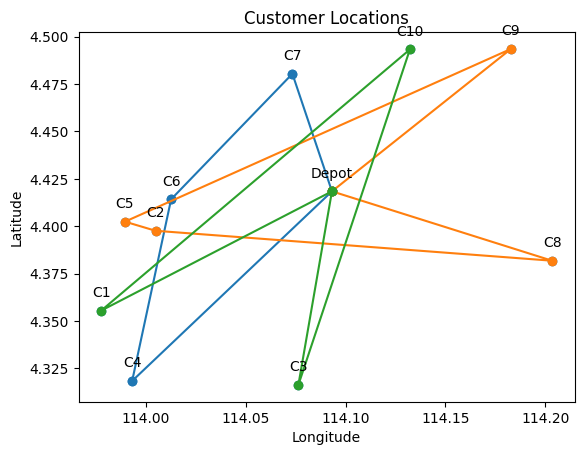

Iteration 1: Best Cost = 128.46116138032778
Iteration 2: Best Cost = 101.31327256258007
Iteration 3: Best Cost = 98.7577457023536
Iteration 4: Best Cost = 97.50839195885587
Iteration 5: Best Cost = 97.50631723744243
Iteration 6: Best Cost = 96.8537372387537
Iteration 7: Best Cost = 89.95347511900763
Iteration 8: Best Cost = 89.3802175631073
Iteration 9: Best Cost = 89.28517223025219
Iteration 10: Best Cost = 89.28517223025219
Iteration 11: Best Cost = 89.28517223025219
Iteration 12: Best Cost = 89.28517223025219
Iteration 13: Best Cost = 89.28517223025219
Iteration 14: Best Cost = 89.28517223025219
Iteration 15: Best Cost = 89.28517223025219
Iteration 16: Best Cost = 89.28517223025219
Iteration 17: Best Cost = 89.28517223025219
Iteration 18: Best Cost = 89.28517223025219
Iteration 19: Best Cost = 89.28517223025219
Iteration 20: Best Cost = 89.28517223025219
Iteration 21: Best Cost = 89.28517223025219
Iteration 22: Best Cost = 89.28517223025219
Iteration 23: Best Cost = 89.2851722302521

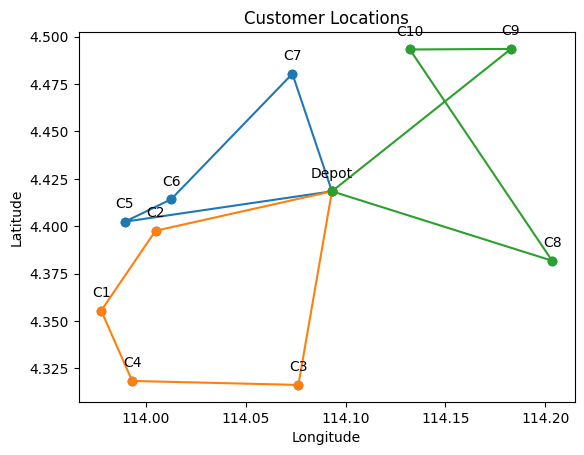

Total Distance = 135.836 km
Total Cost = RM 192.17

Vehicle 1 (Type A):
Round Trip Distance:19.741 km, Cost: RM 23.69, Demand:11
Depot -> C6 (8.061 km) -> C3 (11.68 km)

Vehicle 2 (Type A):
Round Trip Distance:18.858 km, Cost: RM 22.63, Demand:16
Depot -> C7 (6.508 km) -> C2 (10.746 km) -> C5 (1.604 km)

Vehicle 3 (Type B):
Round Trip Distance:97.237 km, Cost: RM 145.86, Demand:30
Depot -> C1 (13.152 km) -> C8 (22.723 km) -> C10 (13.221 km) -> C4 (22.333 km) -> C9 (25.809 km)



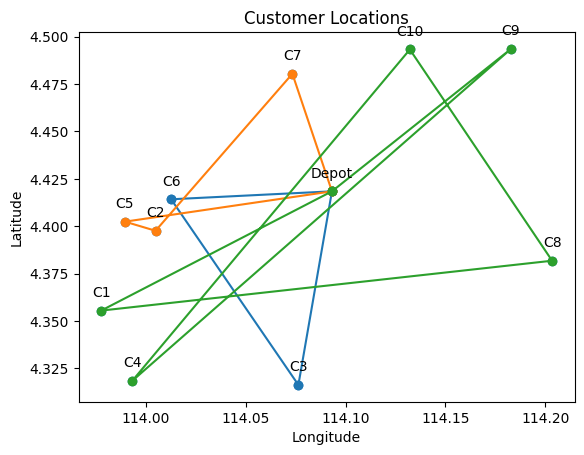

Iteration 1: Best Cost = 191.20841600748986
Iteration 2: Best Cost = 156.95135305180315
Iteration 3: Best Cost = 144.4963416493493
Iteration 4: Best Cost = 138.32649550512488
Iteration 5: Best Cost = 132.9298456073368
Iteration 6: Best Cost = 127.99236680506088
Iteration 7: Best Cost = 126.49434052160912
Iteration 8: Best Cost = 126.33343088036355
Iteration 9: Best Cost = 121.56413975249745
Iteration 10: Best Cost = 112.91816961014125
Iteration 11: Best Cost = 112.5876345947598
Iteration 12: Best Cost = 107.9425751688411
Iteration 13: Best Cost = 103.99726638853588
Iteration 14: Best Cost = 103.5476104083163
Iteration 15: Best Cost = 101.85423239154089
Iteration 16: Best Cost = 101.85423239154089
Iteration 17: Best Cost = 101.85423239154089
Iteration 18: Best Cost = 101.85423239154089
Iteration 19: Best Cost = 101.85423239154089
Iteration 20: Best Cost = 101.85423239154089
Iteration 21: Best Cost = 101.85423239154089
Iteration 22: Best Cost = 101.85423239154089
Iteration 23: Best Cost 

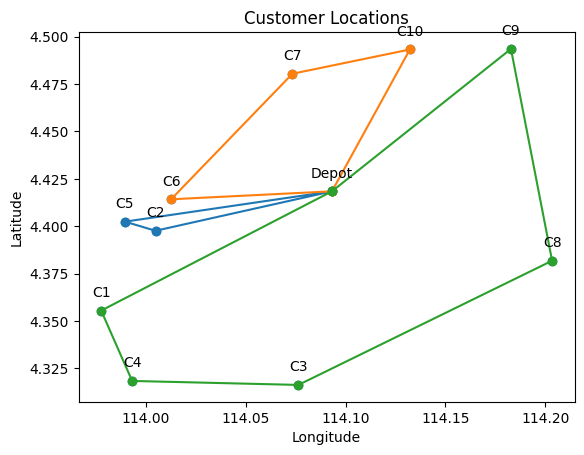

Total Distance = 151.582 km
Total Cost = RM 181.9

Vehicle 1 (Type A):
Round Trip Distance:46.124 km, Cost: RM 55.35, Demand:25
Depot -> C6 (8.061 km) -> C2 (1.834 km) -> C8 (19.913 km) -> C7 (16.316 km)

Vehicle 2 (Type A):
Round Trip Distance:55.737 km, Cost: RM 66.88, Demand:13
Depot -> C3 (10.347 km) -> C9 (20.669 km) -> C1 (24.72 km)

Vehicle 3 (Type A):
Round Trip Distance:49.721 km, Cost: RM 59.67, Demand:19
Depot -> C5 (10.483 km) -> C10 (16.905 km) -> C4 (22.333 km)



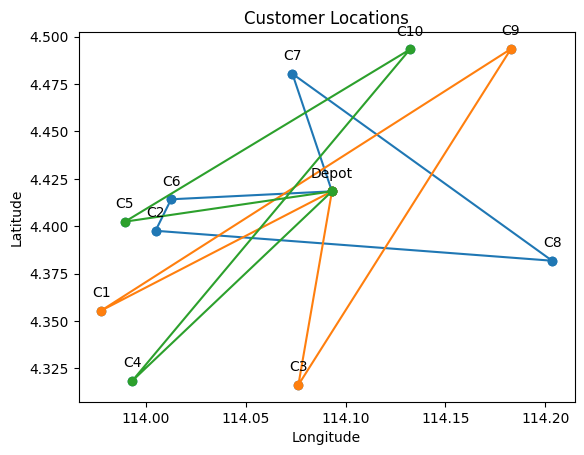

Iteration 1: Best Cost = 181.23960300397158
Iteration 2: Best Cost = 153.6914854547218
Iteration 3: Best Cost = 147.28562671416654
Iteration 4: Best Cost = 119.32888961798989
Iteration 5: Best Cost = 108.57752412123061
Iteration 6: Best Cost = 105.18462504227143
Iteration 7: Best Cost = 97.68805448543057
Iteration 8: Best Cost = 95.75588125692059
Iteration 9: Best Cost = 94.91385125618535
Iteration 10: Best Cost = 94.8392370698451
Iteration 11: Best Cost = 93.0122669488807
Iteration 12: Best Cost = 92.91722161602559
Iteration 13: Best Cost = 92.91722161602559
Iteration 14: Best Cost = 92.91722161602559
Iteration 15: Best Cost = 92.91722161602559
Iteration 16: Best Cost = 92.91722161602559
Iteration 17: Best Cost = 92.91722161602559
Iteration 18: Best Cost = 92.91722161602559
Iteration 19: Best Cost = 92.91722161602559
Iteration 20: Best Cost = 92.91722161602559
Iteration 21: Best Cost = 92.91722161602559
Iteration 22: Best Cost = 92.91722161602559
Iteration 23: Best Cost = 92.917221616

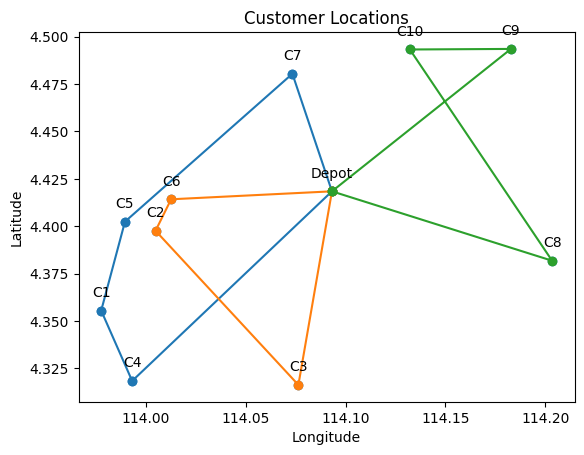

Total Distance = 131.112 km
Total Cost = RM 157.33

Vehicle 1 (Type A):
Round Trip Distance:31.04 km, Cost: RM 37.25, Demand:22
Depot -> C3 (10.347 km) -> C4 (8.323 km) -> C6 (9.776 km) -> C5 (2.594 km)

Vehicle 2 (Type A):
Round Trip Distance:68.17 km, Cost: RM 81.8, Demand:22
Depot -> C10 (8.436 km) -> C1 (20.696 km) -> C8 (22.723 km) -> C7 (16.316 km)

Vehicle 3 (Type A):
Round Trip Distance:31.901 km, Cost: RM 38.28, Demand:13
Depot -> C9 (11.691 km) -> C2 (20.21 km)



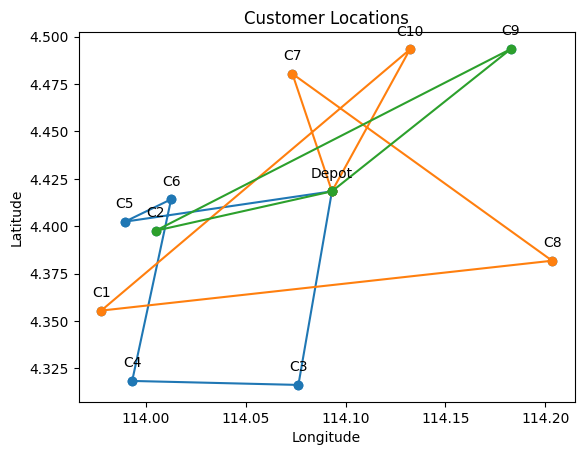

Iteration 1: Best Cost = 118.77560521711621
Iteration 2: Best Cost = 118.49804332748873
Iteration 3: Best Cost = 116.01353080128452
Iteration 4: Best Cost = 105.20287396540854
Iteration 5: Best Cost = 105.10782863255343
Iteration 6: Best Cost = 103.03817912153306
Iteration 7: Best Cost = 100.03858183773454
Iteration 8: Best Cost = 98.1735161895084
Iteration 9: Best Cost = 96.71031489337008
Iteration 10: Best Cost = 95.34860919385994
Iteration 11: Best Cost = 93.57911215304432
Iteration 12: Best Cost = 92.67447010946594
Iteration 13: Best Cost = 92.67447010946594
Iteration 14: Best Cost = 92.67447010946594
Iteration 15: Best Cost = 92.67447010946594
Iteration 16: Best Cost = 92.67447010946594
Iteration 17: Best Cost = 92.67447010946594
Iteration 18: Best Cost = 92.67447010946594
Iteration 19: Best Cost = 92.67447010946594
Iteration 20: Best Cost = 92.67447010946594
Iteration 21: Best Cost = 92.67447010946594
Iteration 22: Best Cost = 92.67447010946594
Iteration 23: Best Cost = 92.674470

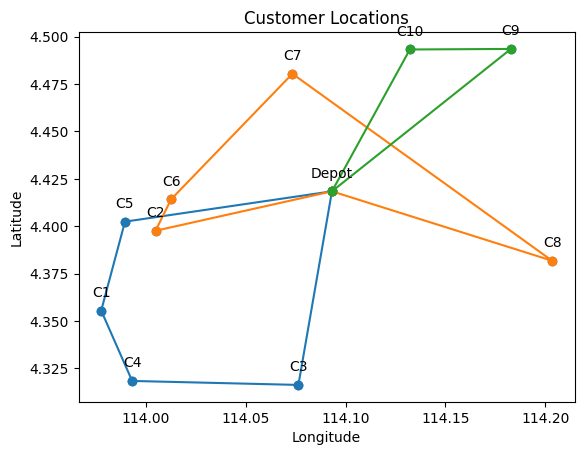

Total Distance = 109.869 km
Total Cost = RM 141.7

Vehicle 1 (Type B):
Round Trip Distance:32.859 km, Cost: RM 49.29, Demand:26
Depot -> C6 (8.061 km) -> C2 (1.834 km) -> C5 (1.604 km) -> C9 (21.36 km)

Vehicle 2 (Type A):
Round Trip Distance:26.985 km, Cost: RM 32.38, Demand:11
Depot -> C10 (8.436 km) -> C3 (18.549 km)

Vehicle 3 (Type A):
Round Trip Distance:50.025 km, Cost: RM 60.03, Demand:20
Depot -> C8 (11.612 km) -> C7 (16.316 km) -> C4 (18.077 km) -> C1 (4.021 km)



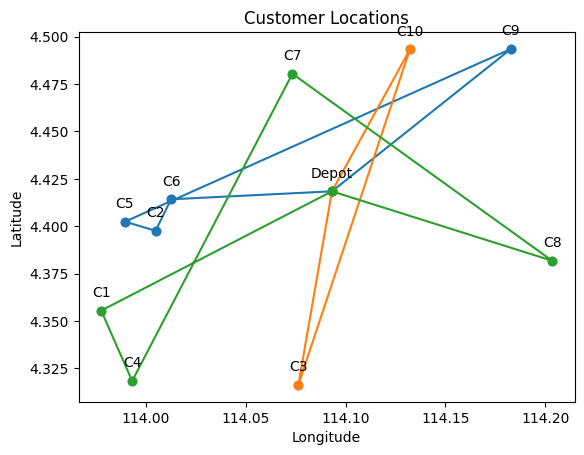

Iteration 1: Best Cost = 138.641350700403
Iteration 2: Best Cost = 134.59345153222506
Iteration 3: Best Cost = 128.70472761523925
Iteration 4: Best Cost = 115.28275641276338
Iteration 5: Best Cost = 107.86729310521655
Iteration 6: Best Cost = 104.20416442072629
Iteration 7: Best Cost = 103.89694457296717
Iteration 8: Best Cost = 101.88486966688848
Iteration 9: Best Cost = 92.38186653988434
Iteration 10: Best Cost = 90.58813022836459
Iteration 11: Best Cost = 90.58813022836459
Iteration 12: Best Cost = 90.58813022836459
Iteration 13: Best Cost = 90.58813022836459
Iteration 14: Best Cost = 90.58813022836459
Iteration 15: Best Cost = 90.58813022836459
Iteration 16: Best Cost = 90.58813022836459
Iteration 17: Best Cost = 90.58813022836459
Iteration 18: Best Cost = 90.58813022836459
Iteration 19: Best Cost = 90.58813022836459
Iteration 20: Best Cost = 90.58813022836459
Iteration 21: Best Cost = 90.58813022836459
Iteration 22: Best Cost = 90.58813022836459
Iteration 23: Best Cost = 90.588130

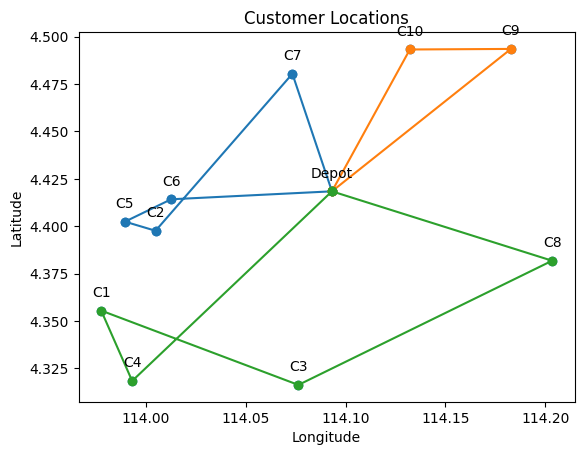

Total Distance = 124.9575 km
Total Cost = RM 174.11

Vehicle 1 (Type A):
Round Trip Distance:28.896 km, Cost: RM 34.68, Demand:11
Depot -> C3 (10.347 km) -> C10 (18.549 km)

Vehicle 2 (Type B):
Round Trip Distance:80.547 km, Cost: RM 120.82, Demand:28
Depot -> C6 (8.061 km) -> C8 (19.343 km) -> C7 (16.316 km) -> C9 (11.018 km) -> C4 (25.809 km)

Vehicle 3 (Type A):
Round Trip Distance:15.514 km, Cost: RM 18.62, Demand:18
Depot -> C2 (9.072 km) -> C5 (1.604 km) -> C1 (4.839 km)



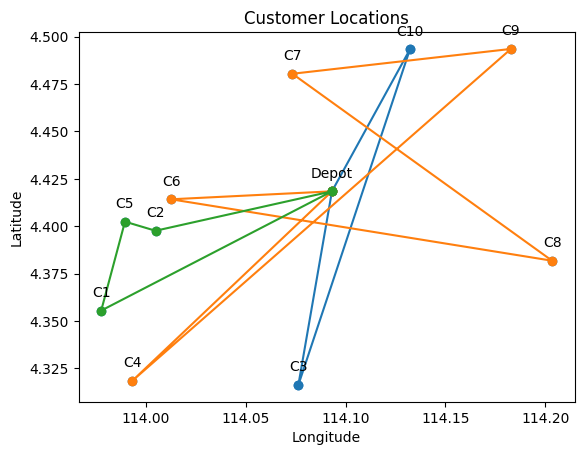

Iteration 1: Best Cost = 168.33227200956352
Iteration 2: Best Cost = 162.4797396069463
Iteration 3: Best Cost = 155.07826242097866
Iteration 4: Best Cost = 151.83749256623855
Iteration 5: Best Cost = 149.06250164752726
Iteration 6: Best Cost = 136.91577171741108
Iteration 7: Best Cost = 133.98968703155145
Iteration 8: Best Cost = 123.73678733422028
Iteration 9: Best Cost = 102.67738224934077
Iteration 10: Best Cost = 101.74128111612852
Iteration 11: Best Cost = 101.74128111612852
Iteration 12: Best Cost = 101.74128111612852
Iteration 13: Best Cost = 101.74128111612852
Iteration 14: Best Cost = 101.74128111612852
Iteration 15: Best Cost = 101.74128111612852
Iteration 16: Best Cost = 101.74128111612852
Iteration 17: Best Cost = 101.74128111612852
Iteration 18: Best Cost = 101.74128111612852
Iteration 19: Best Cost = 101.74128111612852
Iteration 20: Best Cost = 101.74128111612852
Iteration 21: Best Cost = 101.74128111612852
Iteration 22: Best Cost = 101.74128111612852
Iteration 23: Best C

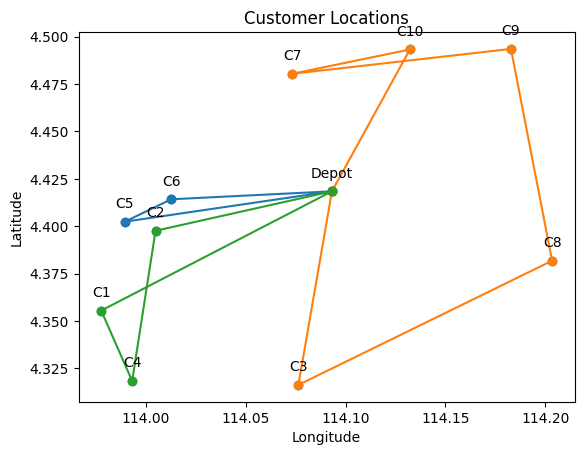

Total Distance = 144.3591 km
Total Cost = RM 195.85

Vehicle 1 (Type B):
Round Trip Distance:75.404 km, Cost: RM 113.11, Demand:28
Depot -> C5 (10.483 km) -> C3 (12.226 km) -> C2 (10.827 km) -> C8 (19.913 km) -> C4 (21.955 km)

Vehicle 2 (Type A):
Round Trip Distance:57.264 km, Cost: RM 68.72, Demand:24
Depot -> C7 (6.508 km) -> C1 (15.735 km) -> C10 (20.696 km) -> C6 (14.325 km)

Vehicle 3 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)



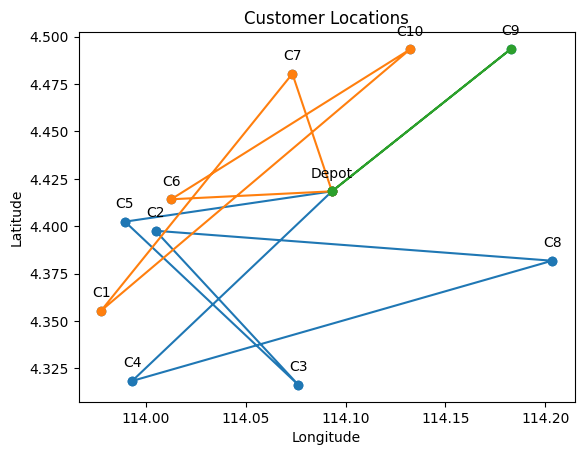

Iteration 1: Best Cost = 180.3777069935119
Iteration 2: Best Cost = 170.73805950582727
Iteration 3: Best Cost = 119.63767428316305
Iteration 4: Best Cost = 105.68670905573937
Iteration 5: Best Cost = 104.32165232199398
Iteration 6: Best Cost = 92.8592177879916
Iteration 7: Best Cost = 90.48206597810689
Iteration 8: Best Cost = 87.48036423321437
Iteration 9: Best Cost = 87.48036423321437
Iteration 10: Best Cost = 87.48036423321437
Iteration 11: Best Cost = 87.48036423321437
Iteration 12: Best Cost = 87.48036423321437
Iteration 13: Best Cost = 87.48036423321437
Iteration 14: Best Cost = 87.48036423321437
Iteration 15: Best Cost = 87.48036423321437
Iteration 16: Best Cost = 87.48036423321437
Iteration 17: Best Cost = 87.48036423321437
Iteration 18: Best Cost = 87.48036423321437
Iteration 19: Best Cost = 87.48036423321437
Iteration 20: Best Cost = 87.48036423321437
Iteration 21: Best Cost = 87.48036423321437
Iteration 22: Best Cost = 87.48036423321437
Iteration 23: Best Cost = 87.480364233

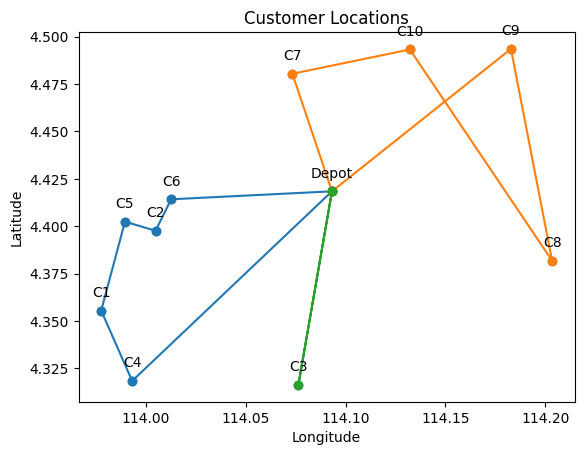

Total Distance = 100.1812 km
Total Cost = RM 135.96

Vehicle 1 (Type A):
Round Trip Distance:22.709 km, Cost: RM 27.25, Demand:8
Depot -> C9 (11.691 km) -> C7 (11.018 km)

Vehicle 2 (Type A):
Round Trip Distance:24.997 km, Cost: RM 30.0, Demand:19
Depot -> C4 (14.142 km) -> C1 (4.021 km) -> C6 (6.834 km)

Vehicle 3 (Type B):
Round Trip Distance:52.475 km, Cost: RM 78.71, Demand:30
Depot -> C10 (8.436 km) -> C2 (15.92 km) -> C5 (1.604 km) -> C3 (12.226 km) -> C8 (14.29 km)



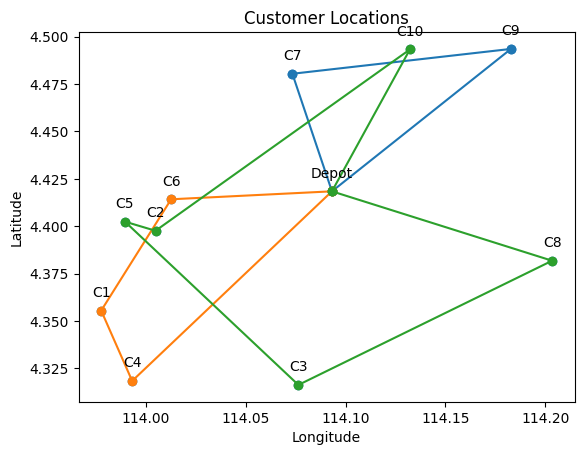

Iteration 1: Best Cost = 133.0919055042119
Iteration 2: Best Cost = 115.29076620186838
Iteration 3: Best Cost = 104.54654862249842
Iteration 4: Best Cost = 101.43111252802362
Iteration 5: Best Cost = 95.34656061915081
Iteration 6: Best Cost = 91.44004160812202
Iteration 7: Best Cost = 91.44004160812202
Iteration 8: Best Cost = 91.44004160812202
Iteration 9: Best Cost = 91.44004160812202
Iteration 10: Best Cost = 91.44004160812202
Iteration 11: Best Cost = 91.44004160812202
Iteration 12: Best Cost = 91.44004160812202
Iteration 13: Best Cost = 91.44004160812202
Iteration 14: Best Cost = 91.44004160812202
Iteration 15: Best Cost = 91.44004160812202
Iteration 16: Best Cost = 91.44004160812202
Iteration 17: Best Cost = 91.44004160812202
Iteration 18: Best Cost = 91.44004160812202
Iteration 19: Best Cost = 91.44004160812202
Iteration 20: Best Cost = 91.44004160812202
Iteration 21: Best Cost = 91.44004160812202
Iteration 22: Best Cost = 91.44004160812202
Iteration 23: Best Cost = 91.440041608

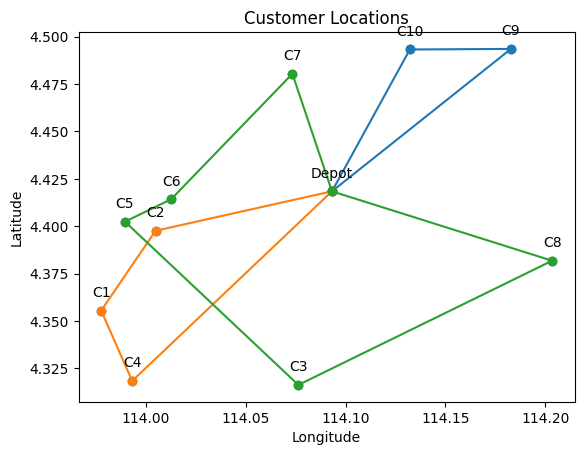

Total Distance = 125.681 km
Total Cost = RM 150.82

Vehicle 1 (Type A):
Round Trip Distance:65.352 km, Cost: RM 78.42, Demand:25
Depot -> C5 (10.483 km) -> C3 (12.226 km) -> C10 (18.549 km) -> C7 (6.018 km) -> C4 (18.077 km)

Vehicle 2 (Type A):
Round Trip Distance:40.343 km, Cost: RM 48.41, Demand:19
Depot -> C2 (9.072 km) -> C8 (19.913 km) -> C9 (11.358 km)

Vehicle 3 (Type A):
Round Trip Distance:19.986 km, Cost: RM 23.98, Demand:13
Depot -> C1 (13.152 km) -> C6 (6.834 km)



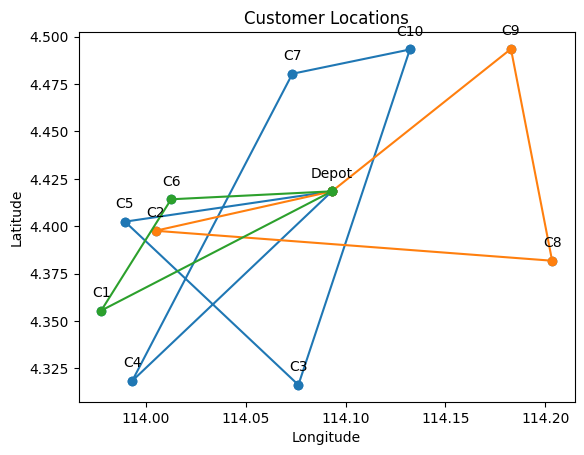

Iteration 1: Best Cost = 148.18892413401167
Iteration 2: Best Cost = 140.97448744029347
Iteration 3: Best Cost = 129.99289803529388
Iteration 4: Best Cost = 117.56698991615963
Iteration 5: Best Cost = 116.35411796731923
Iteration 6: Best Cost = 113.15149478467163
Iteration 7: Best Cost = 111.88778574282203
Iteration 8: Best Cost = 103.97640259742504
Iteration 9: Best Cost = 103.97640259742504
Iteration 10: Best Cost = 103.97640259742504
Iteration 11: Best Cost = 103.97640259742504
Iteration 12: Best Cost = 103.97640259742504
Iteration 13: Best Cost = 103.97640259742504
Iteration 14: Best Cost = 103.97640259742504
Iteration 15: Best Cost = 103.97640259742504
Iteration 16: Best Cost = 103.97640259742504
Iteration 17: Best Cost = 103.97640259742504
Iteration 18: Best Cost = 103.97640259742504
Iteration 19: Best Cost = 103.97640259742504
Iteration 20: Best Cost = 103.97640259742504
Iteration 21: Best Cost = 103.97640259742504
Iteration 22: Best Cost = 103.97640259742504
Iteration 23: Best 

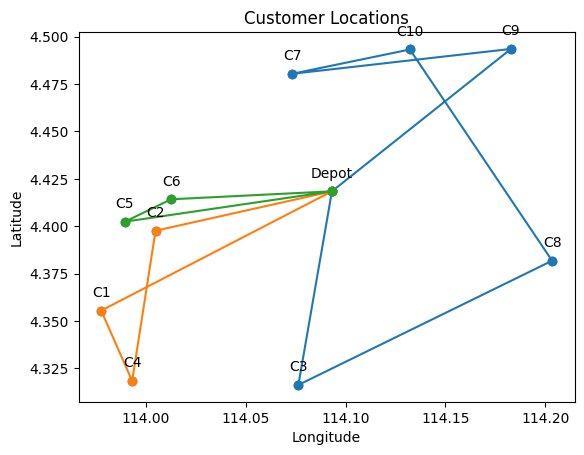

Total Distance = 136.2445 km
Total Cost = RM 163.49

Vehicle 1 (Type A):
Round Trip Distance:33.847 km, Cost: RM 40.62, Demand:13
Depot -> C1 (13.152 km) -> C10 (20.696 km)

Vehicle 2 (Type A):
Round Trip Distance:49.68 km, Cost: RM 59.62, Demand:21
Depot -> C5 (10.483 km) -> C7 (11.448 km) -> C6 (8.982 km) -> C9 (18.768 km)

Vehicle 3 (Type A):
Round Trip Distance:52.717 km, Cost: RM 63.26, Demand:23
Depot -> C8 (11.612 km) -> C4 (21.955 km) -> C3 (8.323 km) -> C2 (10.827 km)



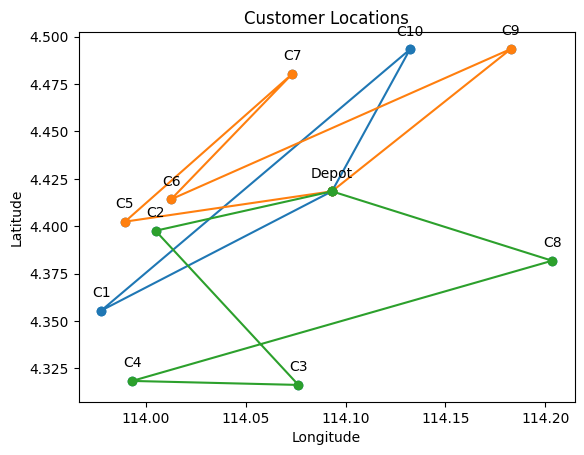

Iteration 1: Best Cost = 154.98386188452065
Iteration 2: Best Cost = 136.76447831908854
Iteration 3: Best Cost = 114.31683411702052
Iteration 4: Best Cost = 108.63110372581819
Iteration 5: Best Cost = 108.47383451264403
Iteration 6: Best Cost = 104.96480398699553
Iteration 7: Best Cost = 99.17811431076981
Iteration 8: Best Cost = 96.36461583311933
Iteration 9: Best Cost = 93.02430698127333
Iteration 10: Best Cost = 80.85573279850583
Iteration 11: Best Cost = 79.64286084966542
Iteration 12: Best Cost = 79.64286084966542
Iteration 13: Best Cost = 79.64286084966542
Iteration 14: Best Cost = 79.64286084966542
Iteration 15: Best Cost = 79.64286084966542
Iteration 16: Best Cost = 79.64286084966542
Iteration 17: Best Cost = 79.64286084966542
Iteration 18: Best Cost = 79.64286084966542
Iteration 19: Best Cost = 79.64286084966542
Iteration 20: Best Cost = 79.64286084966542
Iteration 21: Best Cost = 79.64286084966542
Iteration 22: Best Cost = 79.64286084966542
Iteration 23: Best Cost = 79.642860

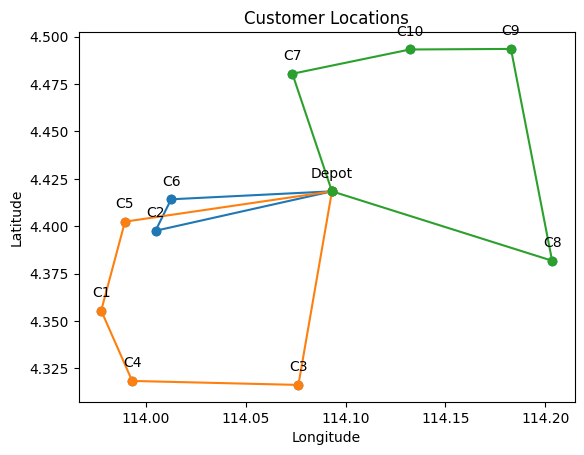

Total Distance = 97.5728 km
Total Cost = RM 117.09

Vehicle 1 (Type A):
Round Trip Distance:22.573 km, Cost: RM 27.09, Demand:8
Depot -> C3 (10.347 km) -> C5 (12.226 km)

Vehicle 2 (Type A):
Round Trip Distance:21.098 km, Cost: RM 25.32, Demand:19
Depot -> C2 (9.072 km) -> C4 (8.006 km) -> C1 (4.021 km)

Vehicle 3 (Type A):
Round Trip Distance:31.076 km, Cost: RM 37.29, Demand:21
Depot -> C9 (11.691 km) -> C10 (5.06 km) -> C6 (14.325 km)

Vehicle 4 (Type A):
Round Trip Distance:22.825 km, Cost: RM 27.39, Demand:9
Depot -> C7 (6.508 km) -> C8 (16.316 km)



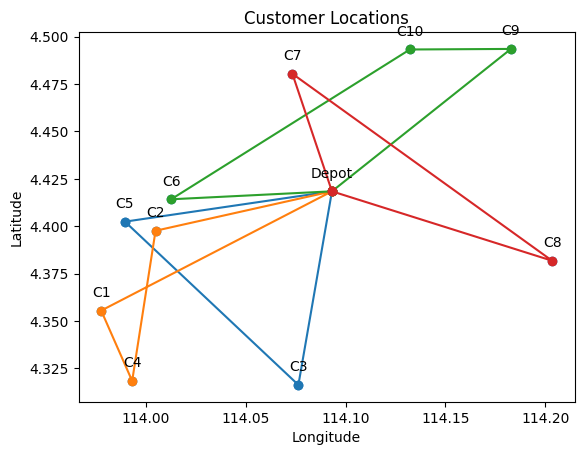

Iteration 1: Best Cost = 106.96070323566396
Iteration 2: Best Cost = 95.57521259930895
Iteration 3: Best Cost = 95.48016726645383
Iteration 4: Best Cost = 95.48016726645383
Iteration 5: Best Cost = 95.48016726645383
Iteration 6: Best Cost = 95.48016726645383
Iteration 7: Best Cost = 95.48016726645383
Iteration 8: Best Cost = 95.48016726645383
Iteration 9: Best Cost = 95.48016726645383
Iteration 10: Best Cost = 95.48016726645383
Iteration 11: Best Cost = 95.48016726645383
Iteration 12: Best Cost = 95.48016726645383
Iteration 13: Best Cost = 95.48016726645383
Iteration 14: Best Cost = 95.48016726645383
Iteration 15: Best Cost = 95.48016726645383
Iteration 16: Best Cost = 95.48016726645383
Iteration 17: Best Cost = 95.48016726645383
Iteration 18: Best Cost = 95.48016726645383
Iteration 19: Best Cost = 95.48016726645383
Iteration 20: Best Cost = 95.48016726645383
Iteration 21: Best Cost = 95.48016726645383
Iteration 22: Best Cost = 95.48016726645383
Iteration 23: Best Cost = 95.48016726645

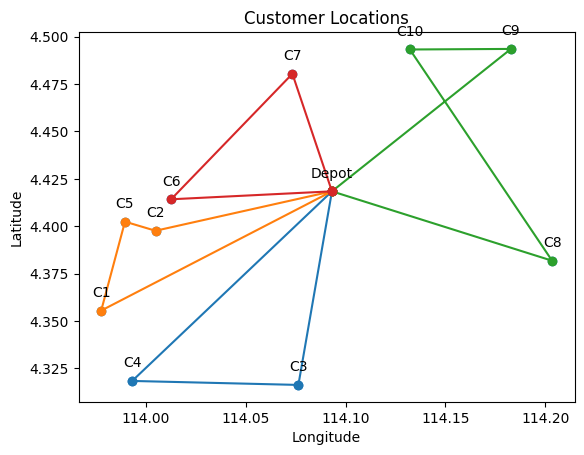

Total Distance = 116.0948 km
Total Cost = RM 139.31

Vehicle 1 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 2 (Type A):
Round Trip Distance:16.751 km, Cost: RM 20.1, Demand:13
Depot -> C9 (11.691 km) -> C10 (5.06 km)

Vehicle 3 (Type A):
Round Trip Distance:36.67 km, Cost: RM 44.0, Demand:25
Depot -> C6 (8.061 km) -> C4 (9.776 km) -> C2 (8.006 km) -> C3 (10.827 km)

Vehicle 4 (Type A):
Round Trip Distance:52.191 km, Cost: RM 62.63, Demand:14
Depot -> C1 (13.152 km) -> C8 (22.723 km) -> C7 (16.316 km)



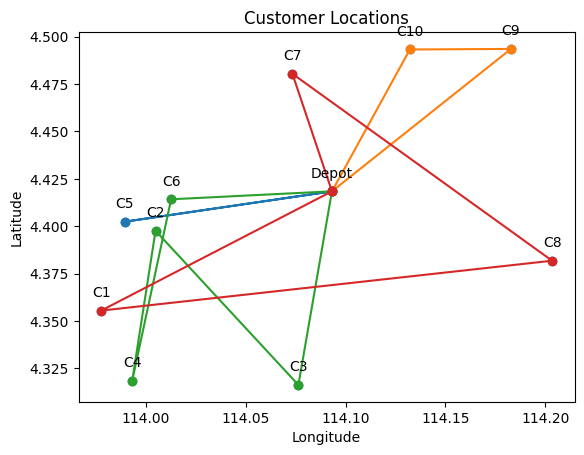

Iteration 1: Best Cost = 136.7850569737294
Iteration 2: Best Cost = 134.80039354691579
Iteration 3: Best Cost = 132.2717174757114
Iteration 4: Best Cost = 127.89650083506402
Iteration 5: Best Cost = 118.62383427051907
Iteration 6: Best Cost = 118.34712185318816
Iteration 7: Best Cost = 108.75548433526166
Iteration 8: Best Cost = 95.8587639373363
Iteration 9: Best Cost = 92.11230398183548
Iteration 10: Best Cost = 88.74704514161198
Iteration 11: Best Cost = 87.28384384547365
Iteration 12: Best Cost = 83.37732483444486
Iteration 13: Best Cost = 83.37732483444486
Iteration 14: Best Cost = 83.37732483444486
Iteration 15: Best Cost = 83.37732483444486
Iteration 16: Best Cost = 83.37732483444486
Iteration 17: Best Cost = 83.37732483444486
Iteration 18: Best Cost = 83.37732483444486
Iteration 19: Best Cost = 83.37732483444486
Iteration 20: Best Cost = 83.37732483444486
Iteration 21: Best Cost = 83.37732483444486
Iteration 22: Best Cost = 83.37732483444486
Iteration 23: Best Cost = 83.37732483

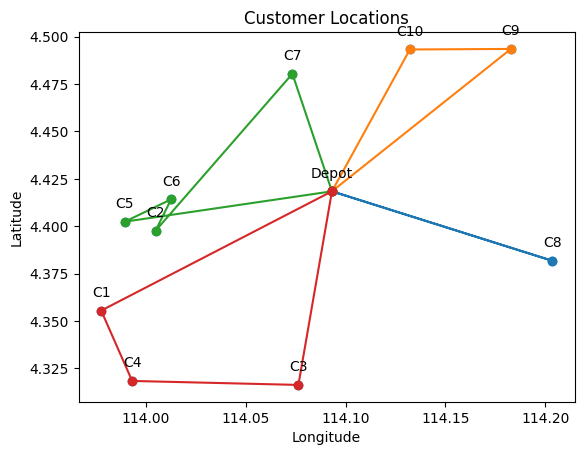

Total Distance = 119.1466 km
Total Cost = RM 142.98

Vehicle 1 (Type A):
Round Trip Distance:22.027 km, Cost: RM 26.43, Demand:11
Depot -> C3 (10.347 km) -> C6 (11.68 km)

Vehicle 2 (Type A):
Round Trip Distance:15.321 km, Cost: RM 18.39, Demand:10
Depot -> C5 (10.483 km) -> C1 (4.839 km)

Vehicle 3 (Type A):
Round Trip Distance:57.442 km, Cost: RM 68.93, Demand:20
Depot -> C9 (11.691 km) -> C8 (11.358 km) -> C7 (16.316 km) -> C4 (18.077 km)

Vehicle 4 (Type A):
Round Trip Distance:24.356 km, Cost: RM 29.23, Demand:16
Depot -> C10 (8.436 km) -> C2 (15.92 km)



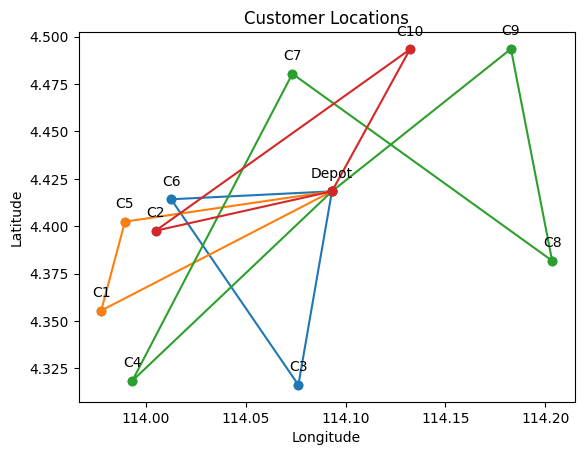

Iteration 1: Best Cost = 141.87502052864232
Iteration 2: Best Cost = 125.775333249133
Iteration 3: Best Cost = 124.35650598231464
Iteration 4: Best Cost = 123.82082838151442
Iteration 5: Best Cost = 120.55281435840773
Iteration 6: Best Cost = 104.0718903573133
Iteration 7: Best Cost = 102.57533387294961
Iteration 8: Best Cost = 97.1650802202125
Iteration 9: Best Cost = 96.16215368938634
Iteration 10: Best Cost = 94.08168553637728
Iteration 11: Best Cost = 94.08168553637728
Iteration 12: Best Cost = 94.08168553637728
Iteration 13: Best Cost = 94.08168553637728
Iteration 14: Best Cost = 94.08168553637728
Iteration 15: Best Cost = 94.08168553637728
Iteration 16: Best Cost = 94.08168553637728
Iteration 17: Best Cost = 94.08168553637728
Iteration 18: Best Cost = 94.08168553637728
Iteration 19: Best Cost = 94.08168553637728
Iteration 20: Best Cost = 94.08168553637728
Iteration 21: Best Cost = 94.08168553637728
Iteration 22: Best Cost = 94.08168553637728
Iteration 23: Best Cost = 94.081685536

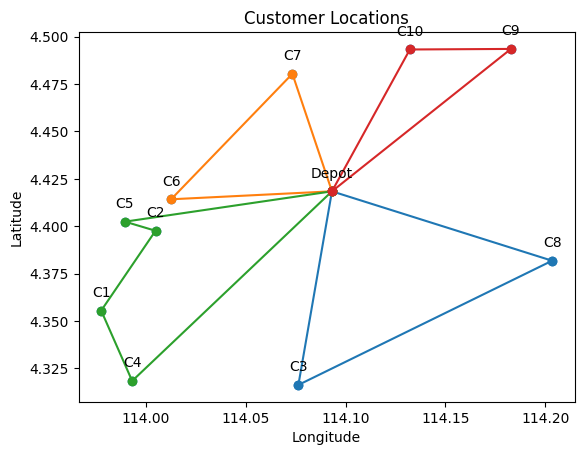

Total Distance = 140.4728 km
Total Cost = RM 168.57

Vehicle 1 (Type A):
Round Trip Distance:36.412 km, Cost: RM 43.69, Demand:10
Depot -> C9 (11.691 km) -> C1 (24.72 km)

Vehicle 2 (Type A):
Round Trip Distance:37.506 km, Cost: RM 45.01, Demand:14
Depot -> C3 (10.347 km) -> C7 (16.413 km) -> C2 (10.746 km)

Vehicle 3 (Type A):
Round Trip Distance:10.655 km, Cost: RM 12.79, Demand:13
Depot -> C6 (8.061 km) -> C5 (2.594 km)

Vehicle 4 (Type A):
Round Trip Distance:55.9 km, Cost: RM 67.08, Demand:20
Depot -> C8 (11.612 km) -> C4 (21.955 km) -> C10 (22.333 km)



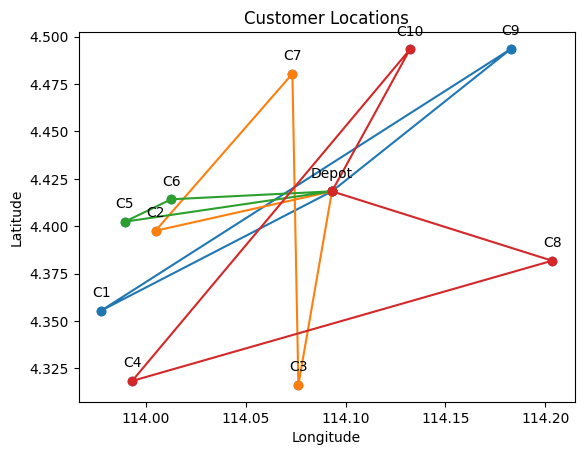

Iteration 1: Best Cost = 145.70078929931407
Iteration 2: Best Cost = 144.33494688304575
Iteration 3: Best Cost = 143.8404259922679
Iteration 4: Best Cost = 140.73053547106736
Iteration 5: Best Cost = 134.41098940067144
Iteration 6: Best Cost = 124.28078376765455
Iteration 7: Best Cost = 121.92480294037125
Iteration 8: Best Cost = 121.32474979657269
Iteration 9: Best Cost = 118.96876896928939
Iteration 10: Best Cost = 106.82659327911459
Iteration 11: Best Cost = 106.75737482061948
Iteration 12: Best Cost = 106.42683980523805
Iteration 13: Best Cost = 105.97718382501849
Iteration 14: Best Cost = 104.28380580824306
Iteration 15: Best Cost = 104.28380580824306
Iteration 16: Best Cost = 104.28380580824306
Iteration 17: Best Cost = 104.28380580824306
Iteration 18: Best Cost = 104.28380580824306
Iteration 19: Best Cost = 104.28380580824306
Iteration 20: Best Cost = 104.28380580824306
Iteration 21: Best Cost = 104.28380580824306
Iteration 22: Best Cost = 104.28380580824306
Iteration 23: Best C

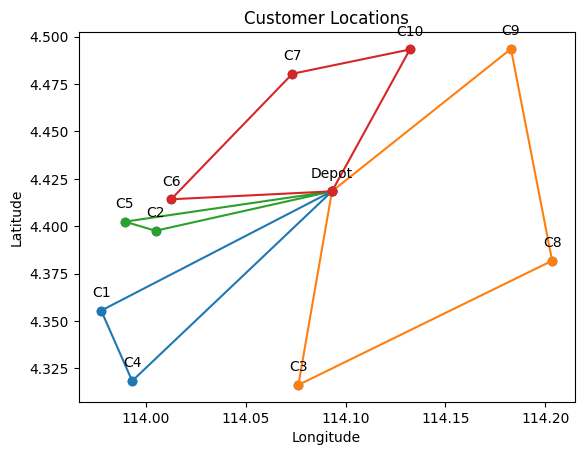

Total Distance = 126.932 km
Total Cost = RM 152.32

Vehicle 1 (Type A):
Round Trip Distance:71.291 km, Cost: RM 85.55, Demand:19
Depot -> C8 (11.612 km) -> C3 (14.29 km) -> C9 (20.669 km) -> C1 (24.72 km)

Vehicle 2 (Type A):
Round Trip Distance:35.119 km, Cost: RM 42.14, Demand:17
Depot -> C6 (8.061 km) -> C7 (8.982 km) -> C4 (18.077 km)

Vehicle 3 (Type A):
Round Trip Distance:12.086 km, Cost: RM 14.5, Demand:13
Depot -> C5 (10.483 km) -> C2 (1.604 km)

Vehicle 4 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)



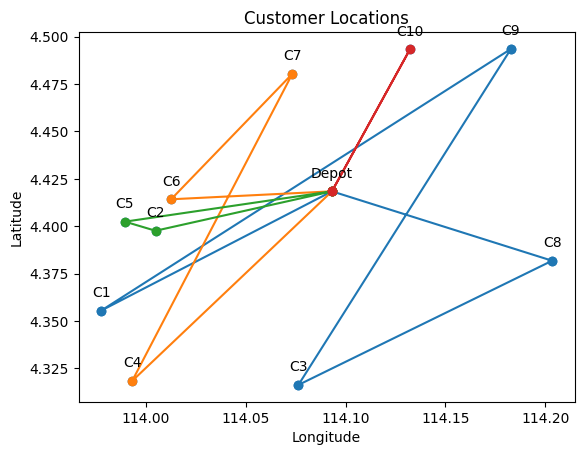

Iteration 1: Best Cost = 144.69562368639342
Iteration 2: Best Cost = 102.0991404483534
Iteration 3: Best Cost = 100.40576243157797
Iteration 4: Best Cost = 100.40576243157797
Iteration 5: Best Cost = 100.40576243157797
Iteration 6: Best Cost = 100.40576243157797
Iteration 7: Best Cost = 100.40576243157797
Iteration 8: Best Cost = 100.40576243157797
Iteration 9: Best Cost = 100.40576243157797
Iteration 10: Best Cost = 100.40576243157797
Iteration 11: Best Cost = 100.40576243157797
Iteration 12: Best Cost = 100.40576243157797
Iteration 13: Best Cost = 100.40576243157797
Iteration 14: Best Cost = 100.40576243157797
Iteration 15: Best Cost = 100.40576243157797
Iteration 16: Best Cost = 100.40576243157797
Iteration 17: Best Cost = 100.40576243157797
Iteration 18: Best Cost = 100.40576243157797
Iteration 19: Best Cost = 100.40576243157797
Iteration 20: Best Cost = 100.40576243157797
Iteration 21: Best Cost = 100.40576243157797
Iteration 22: Best Cost = 100.40576243157797
Iteration 23: Best C

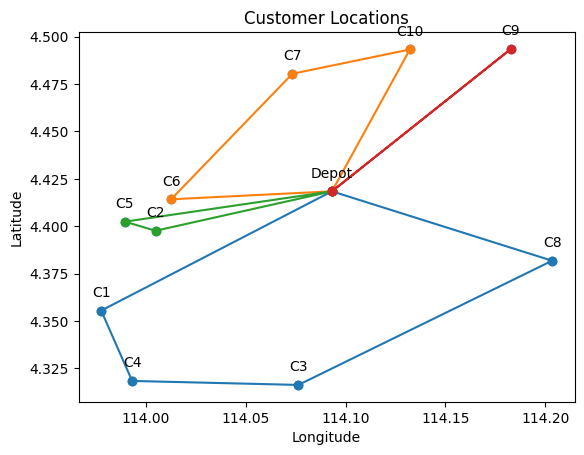

Total Distance = 148.528 km
Total Cost = RM 196.4

Vehicle 1 (Type B):
Round Trip Distance:60.552 km, Cost: RM 90.83, Demand:27
Depot -> C4 (14.142 km) -> C9 (25.809 km) -> C6 (18.768 km) -> C2 (1.834 km)

Vehicle 2 (Type A):
Round Trip Distance:25.341 km, Cost: RM 30.41, Demand:13
Depot -> C10 (8.436 km) -> C5 (16.905 km)

Vehicle 3 (Type A):
Round Trip Distance:35.874 km, Cost: RM 43.05, Demand:11
Depot -> C1 (13.152 km) -> C8 (22.723 km)

Vehicle 4 (Type A):
Round Trip Distance:26.76 km, Cost: RM 32.11, Demand:6
Depot -> C3 (10.347 km) -> C7 (16.413 km)



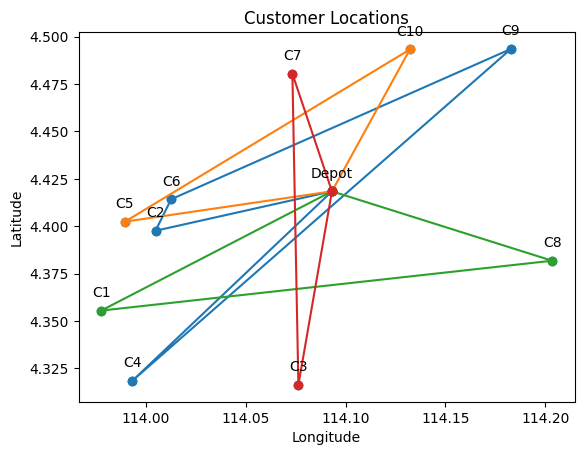

Iteration 1: Best Cost = 185.46611581633405
Iteration 2: Best Cost = 178.56840495029
Iteration 3: Best Cost = 170.51706146322874
Iteration 4: Best Cost = 159.32537081300092
Iteration 5: Best Cost = 158.01525611785934
Iteration 6: Best Cost = 141.14019688537797
Iteration 7: Best Cost = 134.88353261611456
Iteration 8: Best Cost = 106.904101997669
Iteration 9: Best Cost = 99.34392380436219
Iteration 10: Best Cost = 99.2506437458845
Iteration 11: Best Cost = 97.17275073903411
Iteration 12: Best Cost = 97.00804036004477
Iteration 13: Best Cost = 95.94464030639213
Iteration 14: Best Cost = 94.08168553637728
Iteration 15: Best Cost = 94.08168553637728
Iteration 16: Best Cost = 94.08168553637728
Iteration 17: Best Cost = 94.08168553637728
Iteration 18: Best Cost = 94.08168553637728
Iteration 19: Best Cost = 94.08168553637728
Iteration 20: Best Cost = 94.08168553637728
Iteration 21: Best Cost = 94.08168553637728
Iteration 22: Best Cost = 94.08168553637728
Iteration 23: Best Cost = 94.0816855363

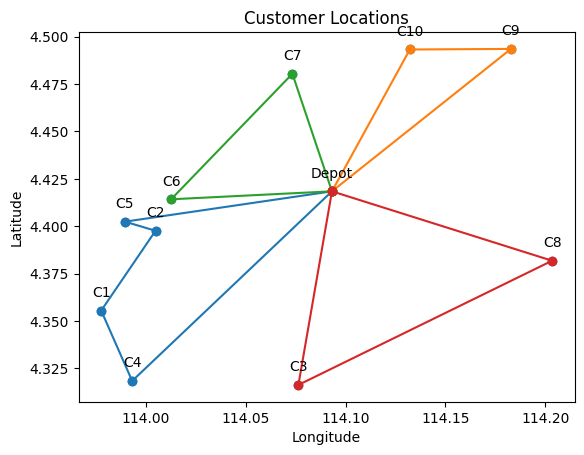

Total Distance = 153.54 km
Total Cost = RM 184.25

Vehicle 1 (Type A):
Round Trip Distance:35.874 km, Cost: RM 43.05, Demand:11
Depot -> C1 (13.152 km) -> C8 (22.723 km)

Vehicle 2 (Type A):
Round Trip Distance:42.139 km, Cost: RM 50.57, Demand:16
Depot -> C9 (11.691 km) -> C6 (18.768 km) -> C3 (11.68 km)

Vehicle 3 (Type A):
Round Trip Distance:43.308 km, Cost: RM 51.97, Demand:21
Depot -> C5 (10.483 km) -> C10 (16.905 km) -> C2 (15.92 km)

Vehicle 4 (Type A):
Round Trip Distance:32.219 km, Cost: RM 38.66, Demand:9
Depot -> C4 (14.142 km) -> C7 (18.077 km)



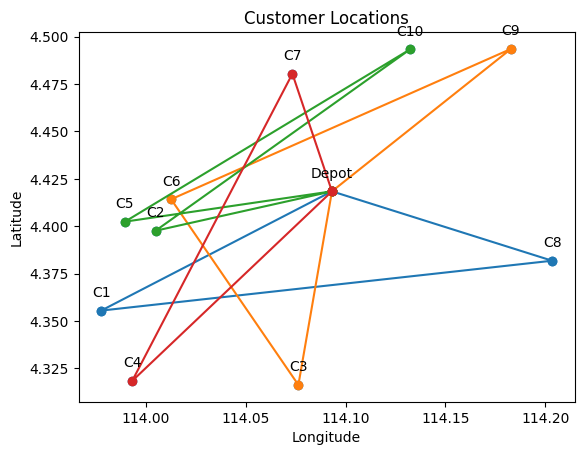

Iteration 1: Best Cost = 160.2805792171235
Iteration 2: Best Cost = 148.84563132748264
Iteration 3: Best Cost = 130.52733696157384
Iteration 4: Best Cost = 123.62962609552979
Iteration 5: Best Cost = 122.69767002785957
Iteration 6: Best Cost = 114.00210167921954
Iteration 7: Best Cost = 112.46581667428089
Iteration 8: Best Cost = 111.15004419714563
Iteration 9: Best Cost = 107.75714511818647
Iteration 10: Best Cost = 102.48388033397006
Iteration 11: Best Cost = 91.29218968374222
Iteration 12: Best Cost = 85.073059922479
Iteration 13: Best Cost = 85.073059922479
Iteration 14: Best Cost = 85.073059922479
Iteration 15: Best Cost = 85.073059922479
Iteration 16: Best Cost = 85.073059922479
Iteration 17: Best Cost = 85.073059922479
Iteration 18: Best Cost = 85.073059922479
Iteration 19: Best Cost = 85.073059922479
Iteration 20: Best Cost = 85.073059922479
Iteration 21: Best Cost = 85.073059922479
Iteration 22: Best Cost = 85.073059922479
Iteration 23: Best Cost = 85.073059922479
Iteration 24

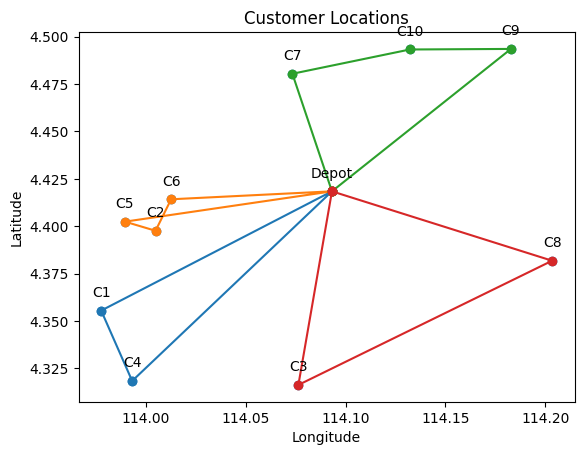

Total Distance = 124.2299 km
Total Cost = RM 149.08

Vehicle 1 (Type A):
Round Trip Distance:56.772 km, Cost: RM 68.13, Demand:21
Depot -> C3 (10.347 km) -> C9 (20.669 km) -> C10 (5.06 km) -> C1 (20.696 km)

Vehicle 2 (Type A):
Round Trip Distance:31.525 km, Cost: RM 37.83, Demand:14
Depot -> C8 (11.612 km) -> C2 (19.913 km)

Vehicle 3 (Type A):
Round Trip Distance:17.043 km, Cost: RM 20.45, Demand:11
Depot -> C6 (8.061 km) -> C7 (8.982 km)

Vehicle 4 (Type A):
Round Trip Distance:18.891 km, Cost: RM 22.67, Demand:11
Depot -> C5 (10.483 km) -> C4 (8.408 km)



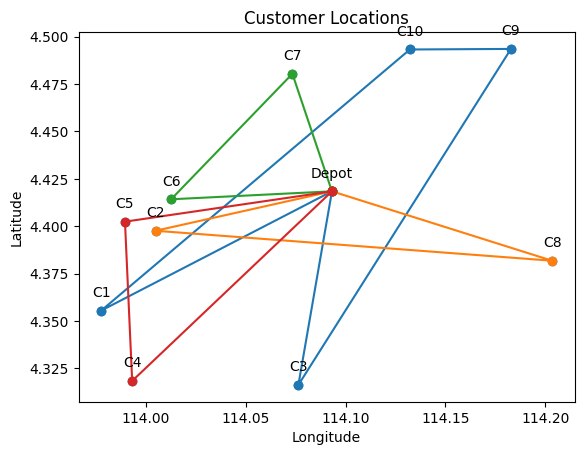

Iteration 1: Best Cost = 143.36195310568132
Iteration 2: Best Cost = 141.5131240309483
Iteration 3: Best Cost = 141.21061716905618
Iteration 4: Best Cost = 135.39752466466018
Iteration 5: Best Cost = 130.76152965142467
Iteration 6: Best Cost = 130.49077895741644
Iteration 7: Best Cost = 128.60144564604377
Iteration 8: Best Cost = 122.26485814666025
Iteration 9: Best Cost = 121.47804792051623
Iteration 10: Best Cost = 120.48012581846018
Iteration 11: Best Cost = 113.67557770598812
Iteration 12: Best Cost = 113.67557770598812
Iteration 13: Best Cost = 113.67557770598812
Iteration 14: Best Cost = 113.67557770598812
Iteration 15: Best Cost = 113.67557770598812
Iteration 16: Best Cost = 113.67557770598812
Iteration 17: Best Cost = 113.67557770598812
Iteration 18: Best Cost = 113.67557770598812
Iteration 19: Best Cost = 113.67557770598812
Iteration 20: Best Cost = 113.67557770598812
Iteration 21: Best Cost = 113.67557770598812
Iteration 22: Best Cost = 113.67557770598812
Iteration 23: Best C

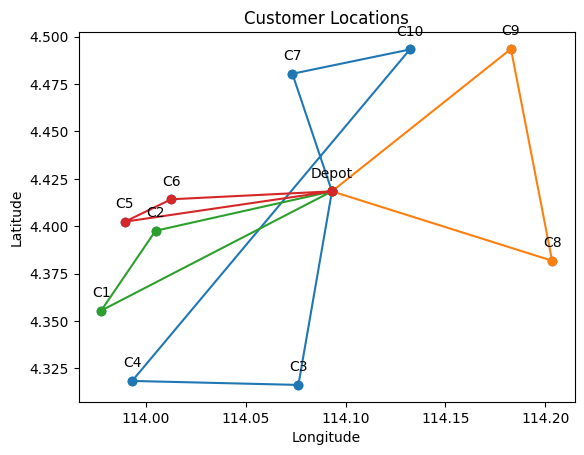

Total Distance = 132.6744 km
Total Cost = RM 159.21

Vehicle 1 (Type A):
Round Trip Distance:24.992 km, Cost: RM 29.99, Demand:16
Depot -> C2 (9.072 km) -> C10 (15.92 km)

Vehicle 2 (Type A):
Round Trip Distance:65.624 km, Cost: RM 78.75, Demand:19
Depot -> C8 (11.612 km) -> C1 (22.723 km) -> C3 (10.62 km) -> C9 (20.669 km)

Vehicle 3 (Type A):
Round Trip Distance:33.998 km, Cost: RM 40.8, Demand:14
Depot -> C4 (14.142 km) -> C5 (8.408 km) -> C7 (11.448 km)

Vehicle 4 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)



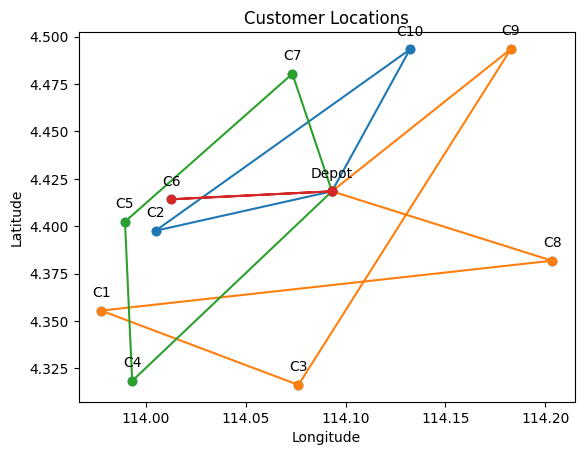

Iteration 1: Best Cost = 146.72101440883358
Iteration 2: Best Cost = 145.88441749513234
Iteration 3: Best Cost = 139.94342030640672
Iteration 4: Best Cost = 136.52816348227574
Iteration 5: Best Cost = 129.5516328674675
Iteration 6: Best Cost = 128.43163016650715
Iteration 7: Best Cost = 125.37230771930666
Iteration 8: Best Cost = 112.34041066889378
Iteration 9: Best Cost = 111.15192122182016
Iteration 10: Best Cost = 99.32888369224537
Iteration 11: Best Cost = 89.72845723101213
Iteration 12: Best Cost = 88.51558528217174
Iteration 13: Best Cost = 84.60906627114294
Iteration 14: Best Cost = 84.60906627114294
Iteration 15: Best Cost = 84.60906627114294
Iteration 16: Best Cost = 84.60906627114294
Iteration 17: Best Cost = 84.60906627114294
Iteration 18: Best Cost = 84.60906627114294
Iteration 19: Best Cost = 84.60906627114294
Iteration 20: Best Cost = 84.60906627114294
Iteration 21: Best Cost = 84.60906627114294
Iteration 22: Best Cost = 84.60906627114294
Iteration 23: Best Cost = 84.6090

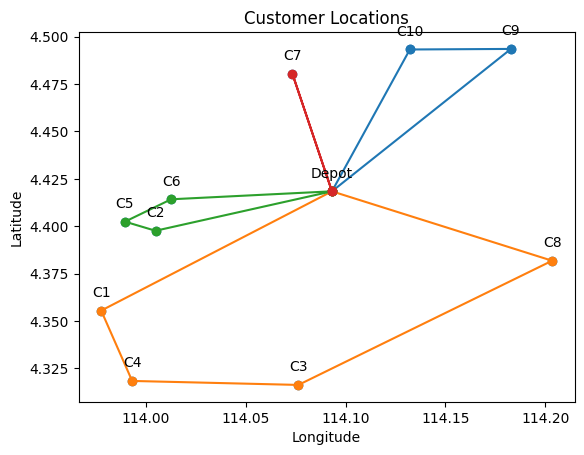

Total Distance = 110.1108 km
Total Cost = RM 132.13

Vehicle 1 (Type A):
Round Trip Distance:22.97 km, Cost: RM 27.56, Demand:11
Depot -> C8 (11.612 km) -> C9 (11.358 km)

Vehicle 2 (Type A):
Round Trip Distance:54.14 km, Cost: RM 64.97, Demand:24
Depot -> C6 (8.061 km) -> C1 (6.834 km) -> C10 (20.696 km) -> C3 (18.549 km)

Vehicle 3 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 4 (Type A):
Round Trip Distance:18.858 km, Cost: RM 22.63, Demand:16
Depot -> C7 (6.508 km) -> C2 (10.746 km) -> C5 (1.604 km)



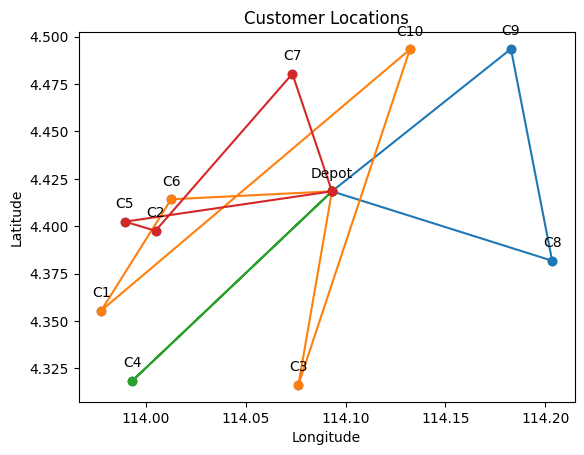

Iteration 1: Best Cost = 122.696247130536
Iteration 2: Best Cost = 120.25598758655238
Iteration 3: Best Cost = 109.6643500801231
Iteration 4: Best Cost = 100.52862169413012
Iteration 5: Best Cost = 97.4375681014221
Iteration 6: Best Cost = 93.6260944232484
Iteration 7: Best Cost = 90.35586951815097
Iteration 8: Best Cost = 90.35586951815097
Iteration 9: Best Cost = 90.35586951815097
Iteration 10: Best Cost = 90.35586951815097
Iteration 11: Best Cost = 90.35586951815097
Iteration 12: Best Cost = 90.35586951815097
Iteration 13: Best Cost = 90.35586951815097
Iteration 14: Best Cost = 90.35586951815097
Iteration 15: Best Cost = 90.35586951815097
Iteration 16: Best Cost = 90.35586951815097
Iteration 17: Best Cost = 90.35586951815097
Iteration 18: Best Cost = 90.35586951815097
Iteration 19: Best Cost = 90.35586951815097
Iteration 20: Best Cost = 90.35586951815097
Iteration 21: Best Cost = 90.35586951815097
Iteration 22: Best Cost = 90.35586951815097
Iteration 23: Best Cost = 90.3558695181509

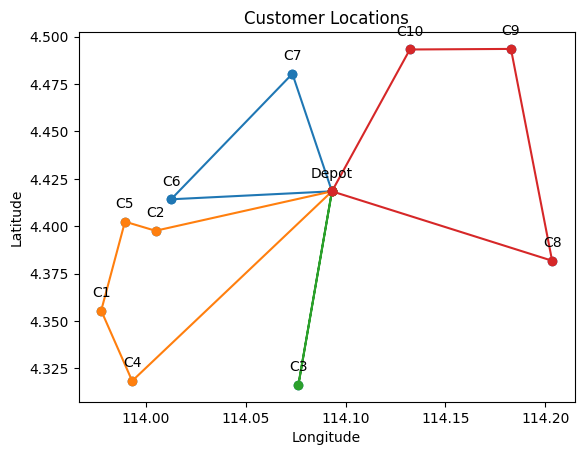

Total Distance = 139.3503 km
Total Cost = RM 189.0

Vehicle 1 (Type A):
Round Trip Distance:35.147 km, Cost: RM 42.18, Demand:11
Depot -> C7 (6.508 km) -> C3 (16.413 km) -> C5 (12.226 km)

Vehicle 2 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 3 (Type B):
Round Trip Distance:72.605 km, Cost: RM 108.91, Demand:27
Depot -> C4 (14.142 km) -> C10 (22.333 km) -> C2 (15.92 km) -> C9 (20.21 km)

Vehicle 4 (Type A):
Round Trip Distance:19.986 km, Cost: RM 23.98, Demand:13
Depot -> C1 (13.152 km) -> C6 (6.834 km)



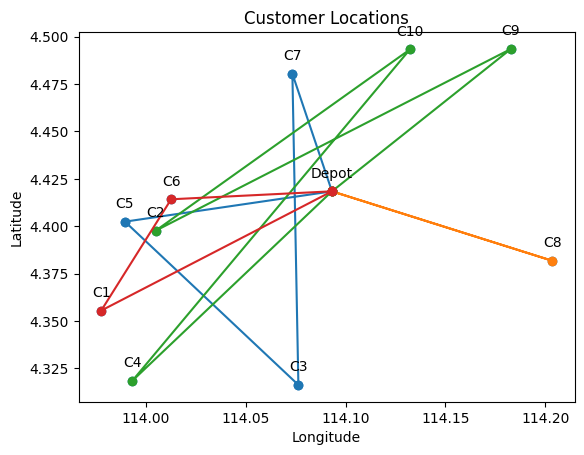

Iteration 1: Best Cost = 182.90125966097028
Iteration 2: Best Cost = 168.36184965304463
Iteration 3: Best Cost = 166.47448350348867
Iteration 4: Best Cost = 153.88933794723346
Iteration 5: Best Cost = 152.72670546618806
Iteration 6: Best Cost = 140.84113282774413
Iteration 7: Best Cost = 133.07420868377767
Iteration 8: Best Cost = 128.08545599638936
Iteration 9: Best Cost = 127.80789410676189
Iteration 10: Best Cost = 125.60484852193801
Iteration 11: Best Cost = 116.94052319391703
Iteration 12: Best Cost = 115.61539707161462
Iteration 13: Best Cost = 104.9901160044567
Iteration 14: Best Cost = 96.34620281654507
Iteration 15: Best Cost = 83.65591507457755
Iteration 16: Best Cost = 82.46736436512778
Iteration 17: Best Cost = 82.46736436512778
Iteration 18: Best Cost = 82.46736436512778
Iteration 19: Best Cost = 82.46736436512778
Iteration 20: Best Cost = 82.46736436512778
Iteration 21: Best Cost = 82.46736436512778
Iteration 22: Best Cost = 82.46736436512778
Iteration 23: Best Cost = 82.

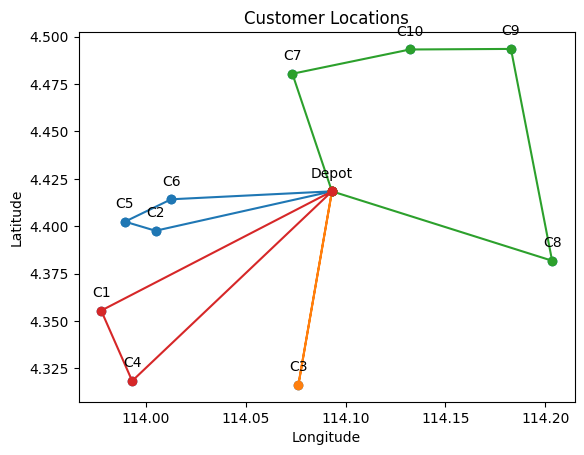

Total Distance = 124.9454 km
Total Cost = RM 149.93

Vehicle 1 (Type A):
Round Trip Distance:23.772 km, Cost: RM 28.53, Demand:8
Depot -> C1 (13.152 km) -> C3 (10.62 km)

Vehicle 2 (Type A):
Round Trip Distance:45.907 km, Cost: RM 55.09, Demand:16
Depot -> C9 (11.691 km) -> C4 (25.809 km) -> C5 (8.408 km)

Vehicle 3 (Type A):
Round Trip Distance:9.072 km, Cost: RM 10.89, Demand:8
Depot -> C2 (9.072 km)

Vehicle 4 (Type A):
Round Trip Distance:46.195 km, Cost: RM 55.43, Demand:25
Depot -> C7 (6.508 km) -> C10 (6.018 km) -> C6 (14.325 km) -> C8 (19.343 km)



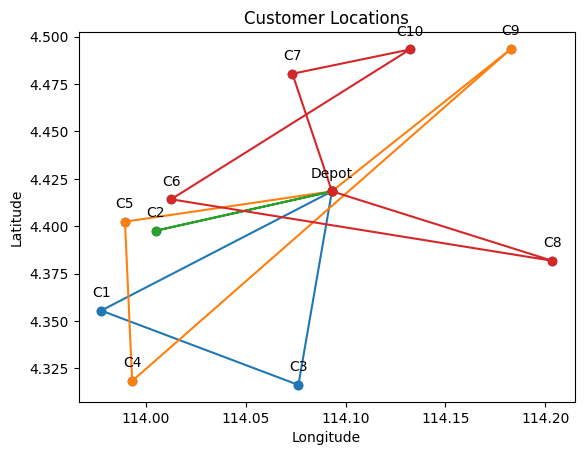

Iteration 1: Best Cost = 144.2455871323647
Iteration 2: Best Cost = 142.06974010081404
Iteration 3: Best Cost = 133.78856726421816
Iteration 4: Best Cost = 124.32446604395987
Iteration 5: Best Cost = 114.13583658623712
Iteration 6: Best Cost = 112.81447725259278
Iteration 7: Best Cost = 92.7347252231583
Iteration 8: Best Cost = 91.16839199805769
Iteration 9: Best Cost = 88.16669025316517
Iteration 10: Best Cost = 81.94756049190195
Iteration 11: Best Cost = 81.94756049190195
Iteration 12: Best Cost = 81.94756049190195
Iteration 13: Best Cost = 81.94756049190195
Iteration 14: Best Cost = 81.94756049190195
Iteration 15: Best Cost = 81.94756049190195
Iteration 16: Best Cost = 81.94756049190195
Iteration 17: Best Cost = 81.94756049190195
Iteration 18: Best Cost = 81.94756049190195
Iteration 19: Best Cost = 81.94756049190195
Iteration 20: Best Cost = 81.94756049190195
Iteration 21: Best Cost = 81.94756049190195
Iteration 22: Best Cost = 81.94756049190195
Iteration 23: Best Cost = 81.94756049

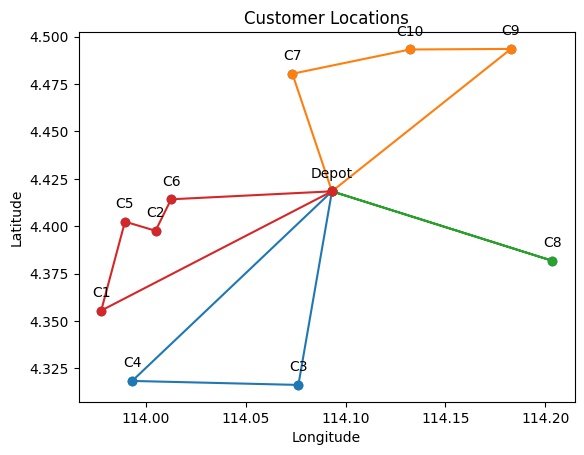

Total Distance = 111.4935 km
Total Cost = RM 148.26

Vehicle 1 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 2 (Type A):
Round Trip Distance:41.186 km, Cost: RM 49.42, Demand:17
Depot -> C7 (6.508 km) -> C1 (15.735 km) -> C3 (10.62 km) -> C4 (8.323 km)

Vehicle 3 (Type B):
Round Trip Distance:48.213 km, Cost: RM 72.32, Demand:29
Depot -> C9 (11.691 km) -> C6 (18.768 km) -> C2 (1.834 km) -> C10 (15.92 km)

Vehicle 4 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)



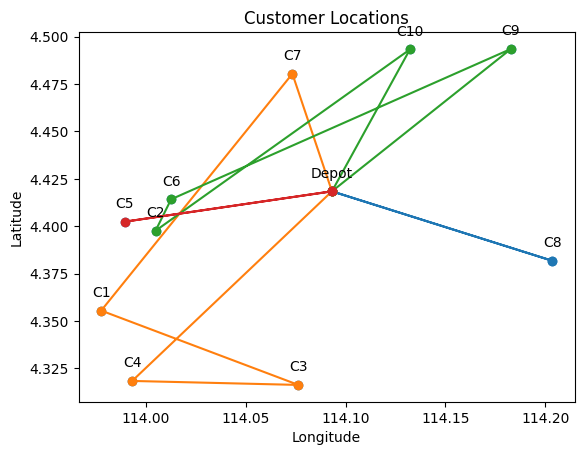

Iteration 1: Best Cost = 124.32476842437539
Iteration 2: Best Cost = 116.68451108894212
Iteration 3: Best Cost = 110.3765792457819
Iteration 4: Best Cost = 109.22743731872251
Iteration 5: Best Cost = 104.7772035902538
Iteration 6: Best Cost = 98.8255992386621
Iteration 7: Best Cost = 98.8255992386621
Iteration 8: Best Cost = 98.8255992386621
Iteration 9: Best Cost = 98.8255992386621
Iteration 10: Best Cost = 98.8255992386621
Iteration 11: Best Cost = 98.8255992386621
Iteration 12: Best Cost = 98.8255992386621
Iteration 13: Best Cost = 98.8255992386621
Iteration 14: Best Cost = 98.8255992386621
Iteration 15: Best Cost = 98.8255992386621
Iteration 16: Best Cost = 98.8255992386621
Iteration 17: Best Cost = 98.8255992386621
Iteration 18: Best Cost = 98.8255992386621
Iteration 19: Best Cost = 98.8255992386621
Iteration 20: Best Cost = 98.8255992386621
Iteration 21: Best Cost = 98.8255992386621
Iteration 22: Best Cost = 98.8255992386621
Iteration 23: Best Cost = 98.8255992386621
Iteration 24

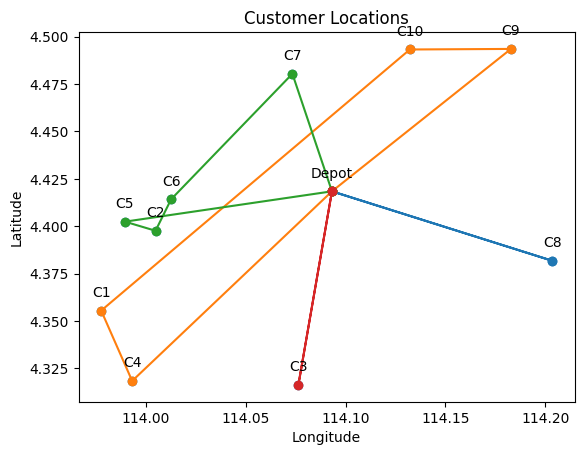

Total Distance = 120.7593 km
Total Cost = RM 144.91

Vehicle 1 (Type A):
Round Trip Distance:26.829 km, Cost: RM 32.19, Demand:13
Depot -> C6 (8.061 km) -> C9 (18.768 km)

Vehicle 2 (Type A):
Round Trip Distance:14.084 km, Cost: RM 16.9, Demand:13
Depot -> C2 (9.072 km) -> C1 (5.012 km)

Vehicle 3 (Type A):
Round Trip Distance:44.539 km, Cost: RM 53.45, Demand:14
Depot -> C8 (11.612 km) -> C5 (21.479 km) -> C7 (11.448 km)

Vehicle 4 (Type A):
Round Trip Distance:35.308 km, Cost: RM 42.37, Demand:17
Depot -> C10 (8.436 km) -> C3 (18.549 km) -> C4 (8.323 km)



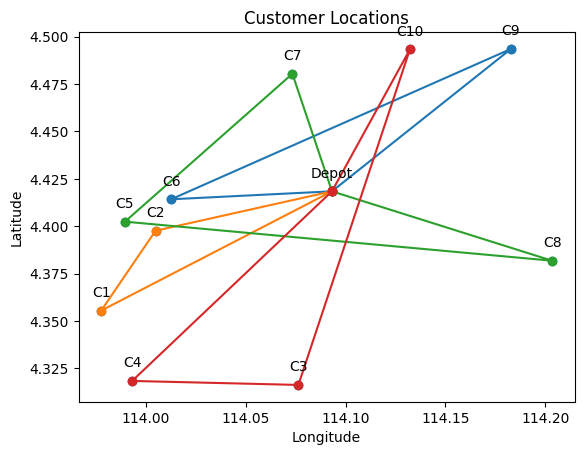

Iteration 1: Best Cost = 142.51113938297735
Iteration 2: Best Cost = 135.93269276711592
Iteration 3: Best Cost = 128.14781394512704
Iteration 4: Best Cost = 120.24776305151272
Iteration 5: Best Cost = 104.41444486390829
Iteration 6: Best Cost = 97.36482421664691
Iteration 7: Best Cost = 93.07187162689792
Iteration 8: Best Cost = 91.20891685688306
Iteration 9: Best Cost = 91.20891685688306
Iteration 10: Best Cost = 91.20891685688306
Iteration 11: Best Cost = 91.20891685688306
Iteration 12: Best Cost = 91.20891685688306
Iteration 13: Best Cost = 91.20891685688306
Iteration 14: Best Cost = 91.20891685688306
Iteration 15: Best Cost = 91.20891685688306
Iteration 16: Best Cost = 91.20891685688306
Iteration 17: Best Cost = 91.20891685688306
Iteration 18: Best Cost = 91.20891685688306
Iteration 19: Best Cost = 91.20891685688306
Iteration 20: Best Cost = 91.20891685688306
Iteration 21: Best Cost = 91.20891685688306
Iteration 22: Best Cost = 91.20891685688306
Iteration 23: Best Cost = 91.2089168

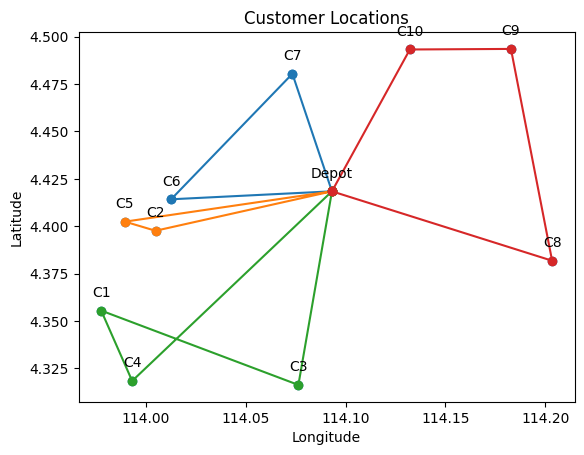

Total Distance = 111.8764 km
Total Cost = RM 144.98

Vehicle 1 (Type B):
Round Trip Distance:35.747 km, Cost: RM 53.62, Demand:26
Depot -> C10 (8.436 km) -> C1 (20.696 km) -> C2 (5.012 km) -> C5 (1.604 km)

Vehicle 2 (Type A):
Round Trip Distance:22.465 km, Cost: RM 26.96, Demand:9
Depot -> C4 (14.142 km) -> C3 (8.323 km)

Vehicle 3 (Type A):
Round Trip Distance:30.955 km, Cost: RM 37.15, Demand:14
Depot -> C8 (11.612 km) -> C6 (19.343 km)

Vehicle 4 (Type A):
Round Trip Distance:22.709 km, Cost: RM 27.25, Demand:8
Depot -> C9 (11.691 km) -> C7 (11.018 km)



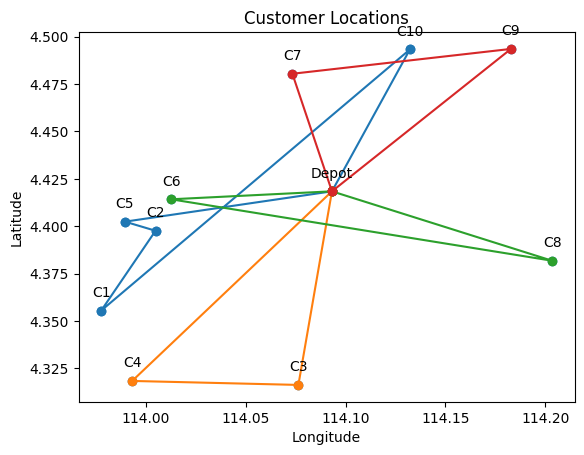

Iteration 1: Best Cost = 139.96150936828755
Iteration 2: Best Cost = 136.87349471942107
Iteration 3: Best Cost = 134.7081935535539
Iteration 4: Best Cost = 128.48369037283314
Iteration 5: Best Cost = 128.14776246712537
Iteration 6: Best Cost = 126.597716106636
Iteration 7: Best Cost = 120.76966667483848
Iteration 8: Best Cost = 107.95619934269344
Iteration 9: Best Cost = 106.00339572926404
Iteration 10: Best Cost = 106.00132100785059
Iteration 11: Best Cost = 105.34874100916186
Iteration 12: Best Cost = 103.28452104428128
Iteration 13: Best Cost = 98.73071149460799
Iteration 14: Best Cost = 98.73071149460799
Iteration 15: Best Cost = 98.73071149460799
Iteration 16: Best Cost = 98.73071149460799
Iteration 17: Best Cost = 98.73071149460799
Iteration 18: Best Cost = 98.73071149460799
Iteration 19: Best Cost = 98.73071149460799
Iteration 20: Best Cost = 98.73071149460799
Iteration 21: Best Cost = 98.73071149460799
Iteration 22: Best Cost = 98.73071149460799
Iteration 23: Best Cost = 98.730

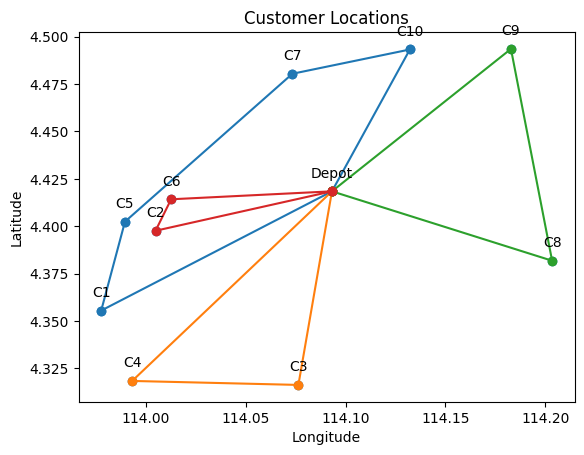

Total Distance = 138.8935 km
Total Cost = RM 166.67

Vehicle 1 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)

Vehicle 2 (Type A):
Round Trip Distance:32.124 km, Cost: RM 38.55, Demand:16
Depot -> C2 (9.072 km) -> C3 (10.827 km) -> C5 (12.226 km)

Vehicle 3 (Type A):
Round Trip Distance:64.309 km, Cost: RM 77.17, Demand:22
Depot -> C7 (6.508 km) -> C1 (15.735 km) -> C8 (22.723 km) -> C6 (19.343 km)

Vehicle 4 (Type A):
Round Trip Distance:30.769 km, Cost: RM 36.92, Demand:14
Depot -> C10 (8.436 km) -> C4 (22.333 km)



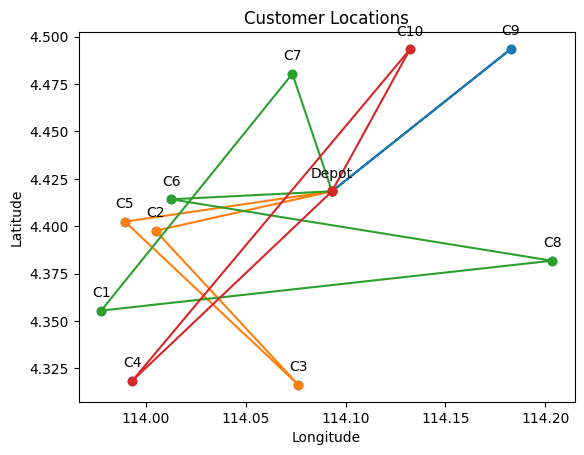

Iteration 1: Best Cost = 160.19735369977525
Iteration 2: Best Cost = 125.19141606171071
Iteration 3: Best Cost = 122.95629458041418
Iteration 4: Best Cost = 118.26381342434388
Iteration 5: Best Cost = 106.19433689429057
Iteration 6: Best Cost = 99.15466453275931
Iteration 7: Best Cost = 95.8797761846098
Iteration 8: Best Cost = 91.39283546208028
Iteration 9: Best Cost = 87.64637550657946
Iteration 10: Best Cost = 83.73985649555067
Iteration 11: Best Cost = 83.73985649555067
Iteration 12: Best Cost = 83.73985649555067
Iteration 13: Best Cost = 83.73985649555067
Iteration 14: Best Cost = 83.73985649555067
Iteration 15: Best Cost = 83.73985649555067
Iteration 16: Best Cost = 83.73985649555067
Iteration 17: Best Cost = 83.73985649555067
Iteration 18: Best Cost = 83.73985649555067
Iteration 19: Best Cost = 83.73985649555067
Iteration 20: Best Cost = 83.73985649555067
Iteration 21: Best Cost = 83.73985649555067
Iteration 22: Best Cost = 83.73985649555067
Iteration 23: Best Cost = 83.73985649

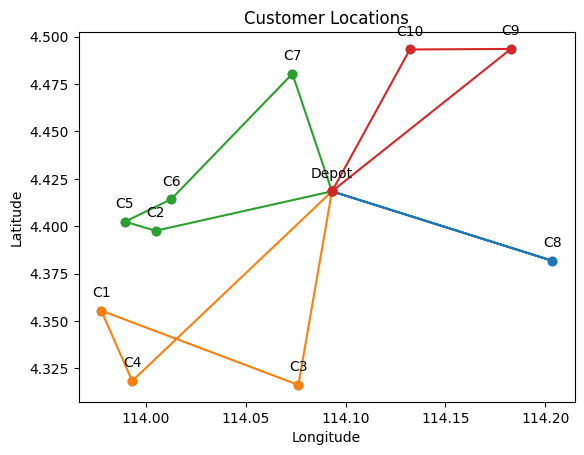

Total Distance = 156.661 km
Total Cost = RM 187.99

Vehicle 1 (Type A):
Round Trip Distance:22.921 km, Cost: RM 27.51, Demand:6
Depot -> C7 (6.508 km) -> C3 (16.413 km)

Vehicle 2 (Type A):
Round Trip Distance:71.677 km, Cost: RM 86.01, Demand:25
Depot -> C5 (10.483 km) -> C10 (16.905 km) -> C4 (22.333 km) -> C8 (21.955 km)

Vehicle 3 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)

Vehicle 4 (Type A):
Round Trip Distance:54.002 km, Cost: RM 64.8, Demand:18
Depot -> C2 (9.072 km) -> C9 (20.21 km) -> C1 (24.72 km)



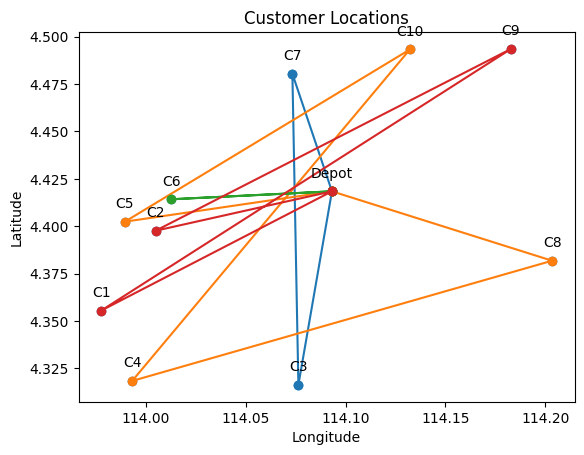

Iteration 1: Best Cost = 150.43728384218565
Iteration 2: Best Cost = 136.22115841120802
Iteration 3: Best Cost = 118.62294895192294
Iteration 4: Best Cost = 115.5355289777535
Iteration 5: Best Cost = 113.80447852577838
Iteration 6: Best Cost = 109.01582174396007
Iteration 7: Best Cost = 108.4652494740608
Iteration 8: Best Cost = 102.20824704588581
Iteration 9: Best Cost = 89.7655018619125
Iteration 10: Best Cost = 88.55423189995398
Iteration 11: Best Cost = 88.55423189995398
Iteration 12: Best Cost = 88.55423189995398
Iteration 13: Best Cost = 88.55423189995398
Iteration 14: Best Cost = 88.55423189995398
Iteration 15: Best Cost = 88.55423189995398
Iteration 16: Best Cost = 88.55423189995398
Iteration 17: Best Cost = 88.55423189995398
Iteration 18: Best Cost = 88.55423189995398
Iteration 19: Best Cost = 88.55423189995398
Iteration 20: Best Cost = 88.55423189995398
Iteration 21: Best Cost = 88.55423189995398
Iteration 22: Best Cost = 88.55423189995398
Iteration 23: Best Cost = 88.5542318

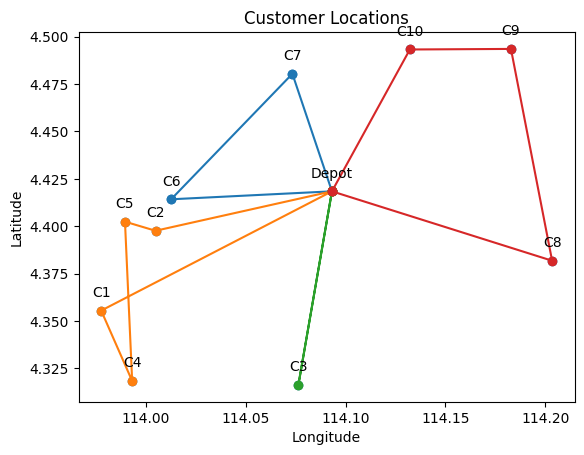

Total Distance = 136.301 km
Total Cost = RM 163.56

Vehicle 1 (Type A):
Round Trip Distance:51.227 km, Cost: RM 61.47, Demand:16
Depot -> C3 (10.347 km) -> C9 (20.669 km) -> C2 (20.21 km)

Vehicle 2 (Type A):
Round Trip Distance:36.017 km, Cost: RM 43.22, Demand:18
Depot -> C5 (10.483 km) -> C1 (4.839 km) -> C10 (20.696 km)

Vehicle 3 (Type A):
Round Trip Distance:15.49 km, Cost: RM 18.59, Demand:11
Depot -> C7 (6.508 km) -> C6 (8.982 km)

Vehicle 4 (Type A):
Round Trip Distance:33.567 km, Cost: RM 40.28, Demand:12
Depot -> C8 (11.612 km) -> C4 (21.955 km)



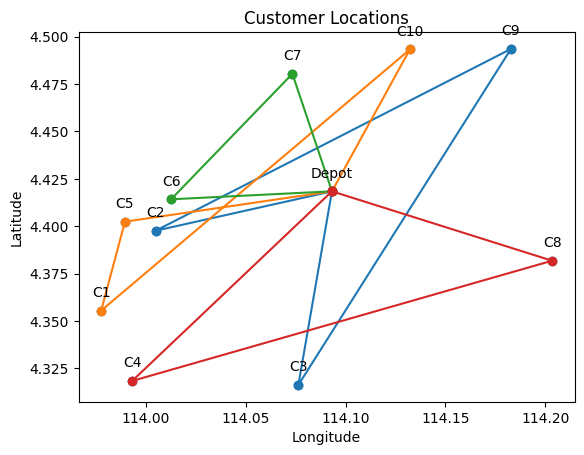

Iteration 1: Best Cost = 133.07000445048624
Iteration 2: Best Cost = 122.92004765402032
Iteration 3: Best Cost = 113.87598253441816
Iteration 4: Best Cost = 107.29791024605157
Iteration 5: Best Cost = 94.40507069410157
Iteration 6: Best Cost = 93.41624187783037
Iteration 7: Best Cost = 92.62803447514568
Iteration 8: Best Cost = 86.37967498004147
Iteration 9: Best Cost = 86.37967498004147
Iteration 10: Best Cost = 86.37967498004147
Iteration 11: Best Cost = 86.37967498004147
Iteration 12: Best Cost = 86.37967498004147
Iteration 13: Best Cost = 86.37967498004147
Iteration 14: Best Cost = 86.37967498004147
Iteration 15: Best Cost = 86.37967498004147
Iteration 16: Best Cost = 86.37967498004147
Iteration 17: Best Cost = 86.37967498004147
Iteration 18: Best Cost = 86.37967498004147
Iteration 19: Best Cost = 86.37967498004147
Iteration 20: Best Cost = 86.37967498004147
Iteration 21: Best Cost = 86.37967498004147
Iteration 22: Best Cost = 86.37967498004147
Iteration 23: Best Cost = 86.37967498

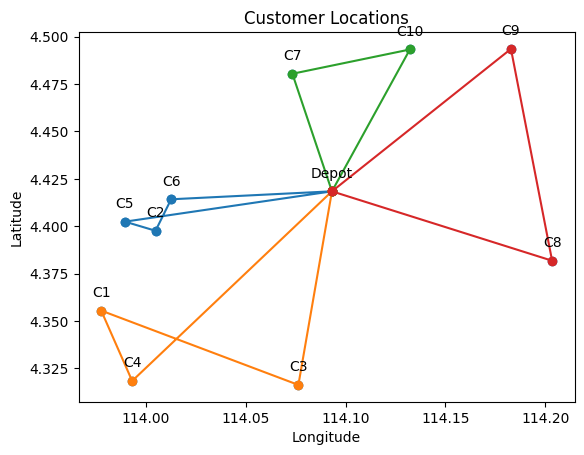

Total Distance = 117.4326 km
Total Cost = RM 140.92

Vehicle 1 (Type A):
Round Trip Distance:33.051 km, Cost: RM 39.66, Demand:10
Depot -> C9 (11.691 km) -> C5 (21.36 km)

Vehicle 2 (Type A):
Round Trip Distance:23.772 km, Cost: RM 28.53, Demand:8
Depot -> C1 (13.152 km) -> C3 (10.62 km)

Vehicle 3 (Type A):
Round Trip Distance:33.206 km, Cost: RM 39.85, Demand:25
Depot -> C10 (8.436 km) -> C7 (6.018 km) -> C2 (10.746 km) -> C4 (8.006 km)

Vehicle 4 (Type A):
Round Trip Distance:27.404 km, Cost: RM 32.89, Demand:14
Depot -> C6 (8.061 km) -> C8 (19.343 km)



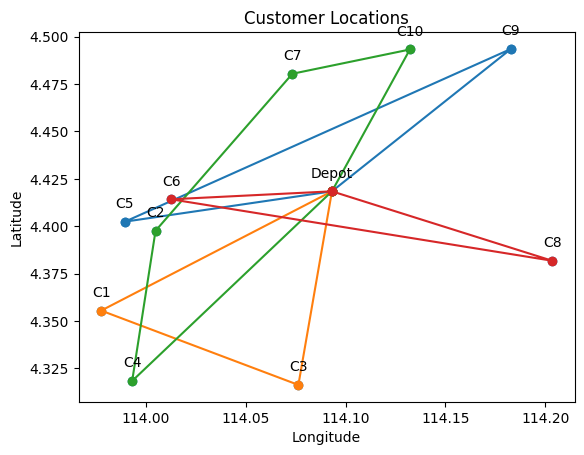

Iteration 1: Best Cost = 108.8177984328961
Iteration 2: Best Cost = 104.2837900370482
Iteration 3: Best Cost = 104.11907965805887
Iteration 4: Best Cost = 103.37914799346984
Iteration 5: Best Cost = 103.2144376144805
Iteration 6: Best Cost = 99.19659877556828
Iteration 7: Best Cost = 98.19867667351222
Iteration 8: Best Cost = 98.1036313406571
Iteration 9: Best Cost = 98.1036313406571
Iteration 10: Best Cost = 98.1036313406571
Iteration 11: Best Cost = 98.1036313406571
Iteration 12: Best Cost = 98.1036313406571
Iteration 13: Best Cost = 98.1036313406571
Iteration 14: Best Cost = 98.1036313406571
Iteration 15: Best Cost = 98.1036313406571
Iteration 16: Best Cost = 98.1036313406571
Iteration 17: Best Cost = 98.1036313406571
Iteration 18: Best Cost = 98.1036313406571
Iteration 19: Best Cost = 98.1036313406571
Iteration 20: Best Cost = 98.1036313406571
Iteration 21: Best Cost = 98.1036313406571
Iteration 22: Best Cost = 98.1036313406571
Iteration 23: Best Cost = 98.1036313406571
Iteration 2

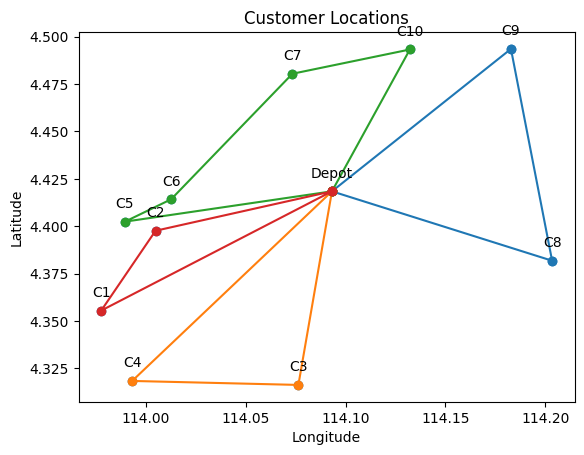

Total Distance = 142.0866 km
Total Cost = RM 170.5

Vehicle 1 (Type A):
Round Trip Distance:34.789 km, Cost: RM 41.75, Demand:19
Depot -> C10 (8.436 km) -> C4 (22.333 km) -> C1 (4.021 km)

Vehicle 2 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)

Vehicle 3 (Type A):
Round Trip Distance:48.773 km, Cost: RM 58.53, Demand:11
Depot -> C9 (11.691 km) -> C3 (20.669 km) -> C7 (16.413 km)

Vehicle 4 (Type A):
Round Trip Distance:50.463 km, Cost: RM 60.56, Demand:19
Depot -> C2 (9.072 km) -> C8 (19.913 km) -> C5 (21.479 km)



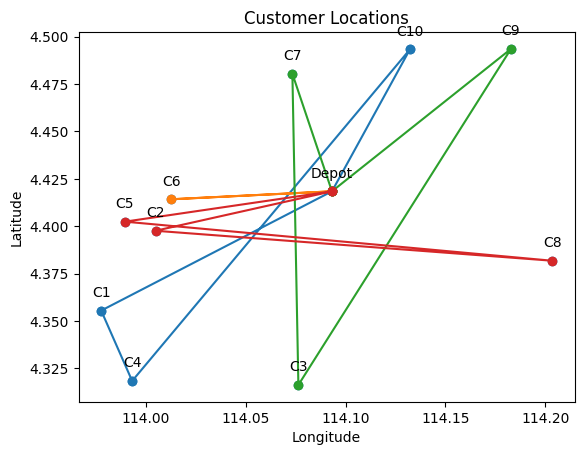

Iteration 1: Best Cost = 159.2845249400194
Iteration 2: Best Cost = 133.9482787634602
Iteration 3: Best Cost = 125.73239008146071
Iteration 4: Best Cost = 122.02981145217065
Iteration 5: Best Cost = 119.58595839354263
Iteration 6: Best Cost = 117.43648630615148
Iteration 7: Best Cost = 115.883506685653
Iteration 8: Best Cost = 104.66405717484632
Iteration 9: Best Cost = 100.96147854555626
Iteration 10: Best Cost = 100.02537741234401
Iteration 11: Best Cost = 96.25705328374606
Iteration 12: Best Cost = 89.80430702062102
Iteration 13: Best Cost = 86.43904818039752
Iteration 14: Best Cost = 76.97676030525422
Iteration 15: Best Cost = 76.97676030525422
Iteration 16: Best Cost = 76.97676030525422
Iteration 17: Best Cost = 76.97676030525422
Iteration 18: Best Cost = 76.97676030525422
Iteration 19: Best Cost = 76.97676030525422
Iteration 20: Best Cost = 76.97676030525422
Iteration 21: Best Cost = 76.97676030525422
Iteration 22: Best Cost = 76.97676030525422
Iteration 23: Best Cost = 76.976760

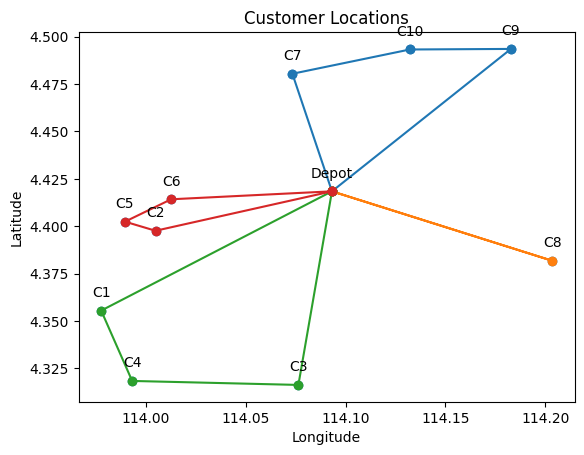

Total Distance = 105.4304 km
Total Cost = RM 126.52

Vehicle 1 (Type A):
Round Trip Distance:18.084 km, Cost: RM 21.7, Demand:16
Depot -> C7 (6.508 km) -> C6 (8.982 km) -> C5 (2.594 km)

Vehicle 2 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)

Vehicle 3 (Type A):
Round Trip Distance:24.992 km, Cost: RM 29.99, Demand:16
Depot -> C2 (9.072 km) -> C10 (15.92 km)

Vehicle 4 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 5 (Type A):
Round Trip Distance:36.521 km, Cost: RM 43.83, Demand:14
Depot -> C8 (11.612 km) -> C3 (14.29 km) -> C1 (10.62 km)



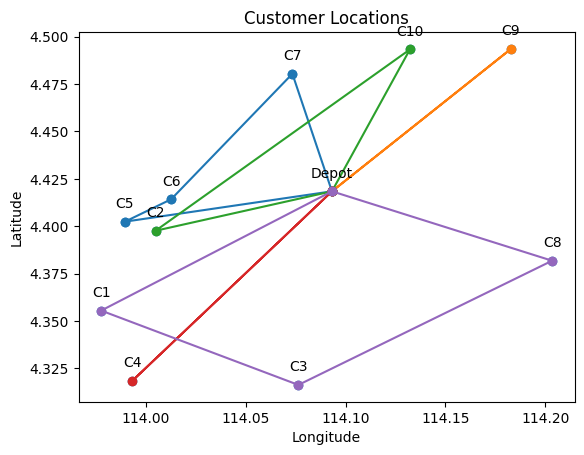

Iteration 1: Best Cost = 119.3561146098292
Iteration 2: Best Cost = 115.28333765104688
Iteration 3: Best Cost = 110.17182096180065
Iteration 4: Best Cost = 103.82260008621866
Iteration 5: Best Cost = 103.82260008621866
Iteration 6: Best Cost = 103.82260008621866
Iteration 7: Best Cost = 103.82260008621866
Iteration 8: Best Cost = 103.82260008621866
Iteration 9: Best Cost = 103.82260008621866
Iteration 10: Best Cost = 103.82260008621866
Iteration 11: Best Cost = 103.82260008621866
Iteration 12: Best Cost = 103.82260008621866
Iteration 13: Best Cost = 103.82260008621866
Iteration 14: Best Cost = 103.82260008621866
Iteration 15: Best Cost = 103.82260008621866
Iteration 16: Best Cost = 103.82260008621866
Iteration 17: Best Cost = 103.82260008621866
Iteration 18: Best Cost = 103.82260008621866
Iteration 19: Best Cost = 103.82260008621866
Iteration 20: Best Cost = 103.82260008621866
Iteration 21: Best Cost = 103.82260008621866
Iteration 22: Best Cost = 103.82260008621866
Iteration 23: Best C

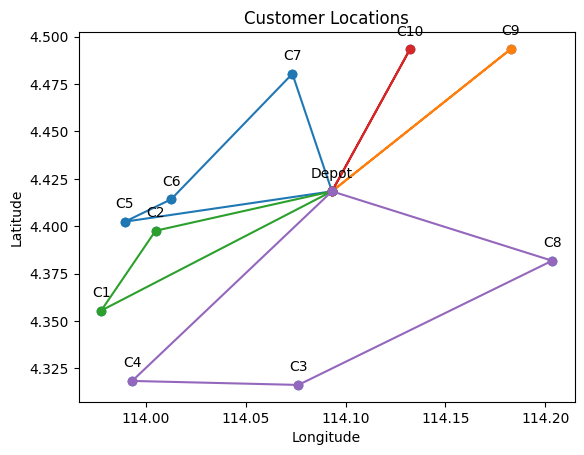

Total Distance = 107.3255 km
Total Cost = RM 128.79

Vehicle 1 (Type A):
Round Trip Distance:45.183 km, Cost: RM 54.22, Demand:19
Depot -> C5 (10.483 km) -> C8 (21.479 km) -> C10 (13.221 km)

Vehicle 2 (Type A):
Round Trip Distance:22.267 km, Cost: RM 26.72, Demand:16
Depot -> C7 (6.508 km) -> C2 (10.746 km) -> C1 (5.012 km)

Vehicle 3 (Type A):
Round Trip Distance:17.837 km, Cost: RM 21.4, Demand:14
Depot -> C6 (8.061 km) -> C4 (9.776 km)

Vehicle 4 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 5 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)



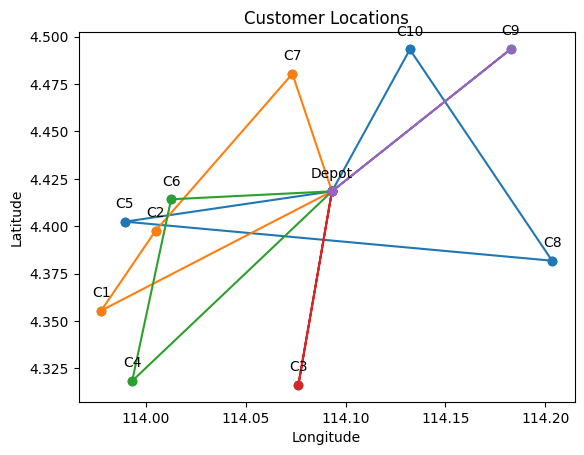

Iteration 1: Best Cost = 122.64897814014124
Iteration 2: Best Cost = 113.41423406198622
Iteration 3: Best Cost = 108.99286440279343
Iteration 4: Best Cost = 104.7650251546136
Iteration 5: Best Cost = 101.47672521869463
Iteration 6: Best Cost = 92.83281203078299
Iteration 7: Best Cost = 92.19479962472481
Iteration 8: Best Cost = 87.47601782399009
Iteration 9: Best Cost = 85.73146218459476
Iteration 10: Best Cost = 85.73146218459476
Iteration 11: Best Cost = 85.73146218459476
Iteration 12: Best Cost = 85.73146218459476
Iteration 13: Best Cost = 85.73146218459476
Iteration 14: Best Cost = 85.73146218459476
Iteration 15: Best Cost = 85.73146218459476
Iteration 16: Best Cost = 85.73146218459476
Iteration 17: Best Cost = 85.73146218459476
Iteration 18: Best Cost = 85.73146218459476
Iteration 19: Best Cost = 85.73146218459476
Iteration 20: Best Cost = 85.73146218459476
Iteration 21: Best Cost = 85.73146218459476
Iteration 22: Best Cost = 85.73146218459476
Iteration 23: Best Cost = 85.73146218

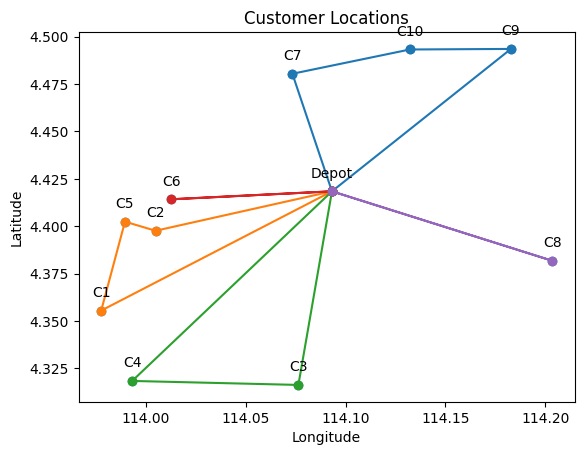

Total Distance = 136.2364 km
Total Cost = RM 178.66

Vehicle 1 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 2 (Type A):
Round Trip Distance:61.172 km, Cost: RM 73.41, Demand:22
Depot -> C1 (13.152 km) -> C8 (22.723 km) -> C7 (16.316 km) -> C6 (8.982 km)

Vehicle 3 (Type B):
Round Trip Distance:50.575 km, Cost: RM 75.86, Demand:26
Depot -> C9 (11.691 km) -> C5 (21.36 km) -> C2 (1.604 km) -> C10 (15.92 km)

Vehicle 4 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)



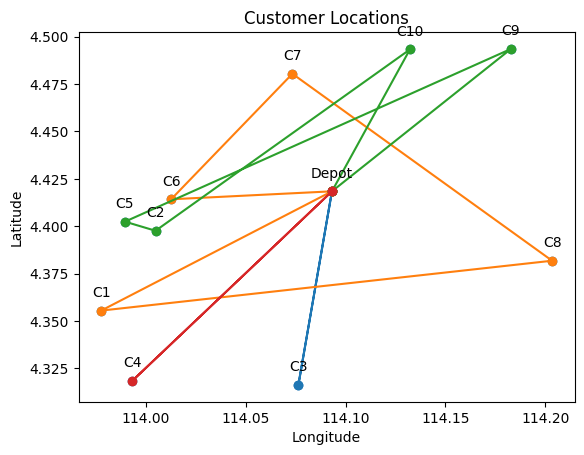

Iteration 1: Best Cost = 147.13906347266402
Iteration 2: Best Cost = 143.13272535322304
Iteration 3: Best Cost = 126.69261970619694
Iteration 4: Best Cost = 113.37490359637002
Iteration 5: Best Cost = 110.705273669511
Iteration 6: Best Cost = 99.21571030493901
Iteration 7: Best Cost = 89.53748954870107
Iteration 8: Best Cost = 89.53748954870107
Iteration 9: Best Cost = 89.53748954870107
Iteration 10: Best Cost = 89.53748954870107
Iteration 11: Best Cost = 89.53748954870107
Iteration 12: Best Cost = 89.53748954870107
Iteration 13: Best Cost = 89.53748954870107
Iteration 14: Best Cost = 89.53748954870107
Iteration 15: Best Cost = 89.53748954870107
Iteration 16: Best Cost = 89.53748954870107
Iteration 17: Best Cost = 89.53748954870107
Iteration 18: Best Cost = 89.53748954870107
Iteration 19: Best Cost = 89.53748954870107
Iteration 20: Best Cost = 89.53748954870107
Iteration 21: Best Cost = 89.53748954870107
Iteration 22: Best Cost = 89.53748954870107
Iteration 23: Best Cost = 89.537489548

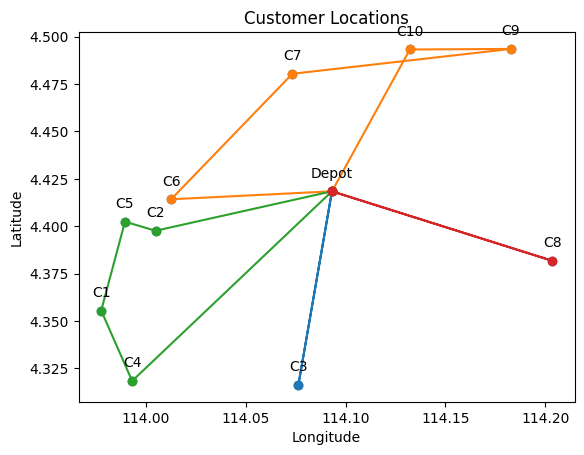

Total Distance = 127.9868 km
Total Cost = RM 153.58

Vehicle 1 (Type A):
Round Trip Distance:9.072 km, Cost: RM 10.89, Demand:8
Depot -> C2 (9.072 km)

Vehicle 2 (Type A):
Round Trip Distance:13.152 km, Cost: RM 15.78, Demand:5
Depot -> C1 (13.152 km)

Vehicle 3 (Type A):
Round Trip Distance:25.901 km, Cost: RM 31.08, Demand:9
Depot -> C8 (11.612 km) -> C3 (14.29 km)

Vehicle 4 (Type A):
Round Trip Distance:39.317 km, Cost: RM 47.18, Demand:13
Depot -> C7 (6.508 km) -> C5 (11.448 km) -> C9 (21.36 km)

Vehicle 5 (Type A):
Round Trip Distance:40.545 km, Cost: RM 48.65, Demand:22
Depot -> C10 (8.436 km) -> C4 (22.333 km) -> C6 (9.776 km)



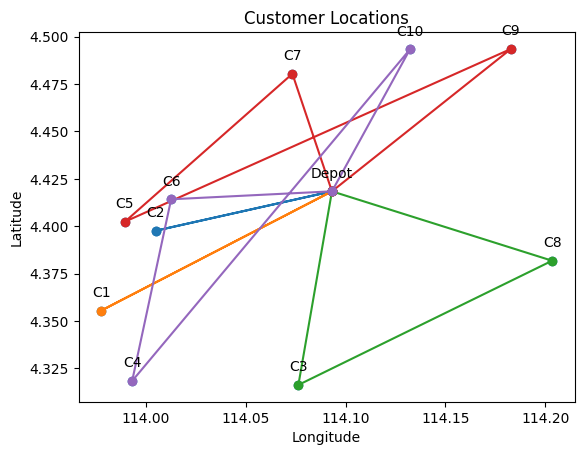

Iteration 1: Best Cost = 150.30331250809638
Iteration 2: Best Cost = 139.22151758067085
Iteration 3: Best Cost = 137.794071422929
Iteration 4: Best Cost = 106.2771904107498
Iteration 5: Best Cost = 105.36541338100709
Iteration 6: Best Cost = 100.9618382947652
Iteration 7: Best Cost = 95.32701838671574
Iteration 8: Best Cost = 91.3091795478035
Iteration 9: Best Cost = 89.42343142605664
Iteration 10: Best Cost = 84.26117692835119
Iteration 11: Best Cost = 81.85981553243718
Iteration 12: Best Cost = 81.85981553243718
Iteration 13: Best Cost = 81.85981553243718
Iteration 14: Best Cost = 81.85981553243718
Iteration 15: Best Cost = 81.85981553243718
Iteration 16: Best Cost = 81.85981553243718
Iteration 17: Best Cost = 81.85981553243718
Iteration 18: Best Cost = 81.85981553243718
Iteration 19: Best Cost = 81.85981553243718
Iteration 20: Best Cost = 81.85981553243718
Iteration 21: Best Cost = 81.85981553243718
Iteration 22: Best Cost = 81.85981553243718
Iteration 23: Best Cost = 81.85981553243

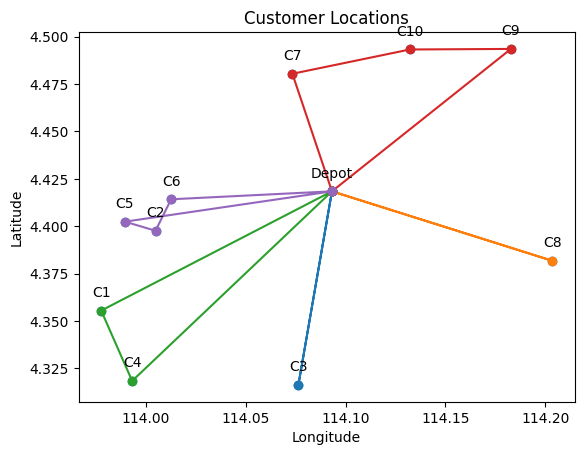

Total Distance = 135.2482 km
Total Cost = RM 162.3

Vehicle 1 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 2 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 3 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)

Vehicle 4 (Type A):
Round Trip Distance:52.196 km, Cost: RM 62.64, Demand:21
Depot -> C2 (9.072 km) -> C7 (10.746 km) -> C9 (11.018 km) -> C5 (21.36 km)

Vehicle 5 (Type A):
Round Trip Distance:50.127 km, Cost: RM 60.15, Demand:19
Depot -> C6 (8.061 km) -> C8 (19.343 km) -> C1 (22.723 km)



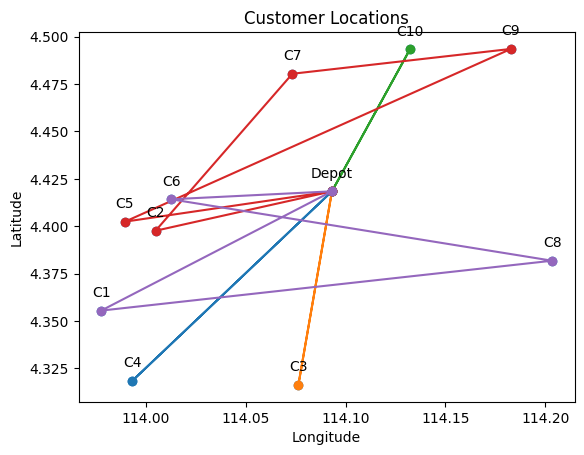

Iteration 1: Best Cost = 134.49482162923672
Iteration 2: Best Cost = 133.86153050014073
Iteration 3: Best Cost = 115.79795599337706
Iteration 4: Best Cost = 112.08363305316928
Iteration 5: Best Cost = 111.75926168391149
Iteration 6: Best Cost = 103.84024911535059
Iteration 7: Best Cost = 100.91216384708142
Iteration 8: Best Cost = 96.32439090203776
Iteration 9: Best Cost = 96.32439090203775
Iteration 10: Best Cost = 86.86210302689446
Iteration 11: Best Cost = 86.86210302689446
Iteration 12: Best Cost = 86.86210302689446
Iteration 13: Best Cost = 86.86210302689446
Iteration 14: Best Cost = 86.86210302689446
Iteration 15: Best Cost = 86.86210302689446
Iteration 16: Best Cost = 86.86210302689446
Iteration 17: Best Cost = 86.86210302689446
Iteration 18: Best Cost = 86.86210302689446
Iteration 19: Best Cost = 86.86210302689446
Iteration 20: Best Cost = 86.86210302689446
Iteration 21: Best Cost = 86.86210302689446
Iteration 22: Best Cost = 86.86210302689446
Iteration 23: Best Cost = 86.86210

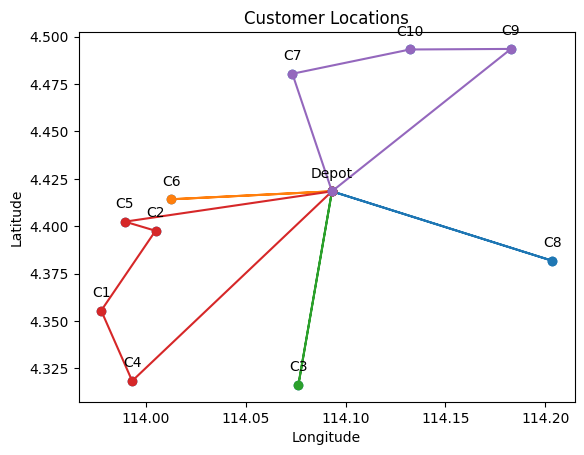

Total Distance = 119.0162 km
Total Cost = RM 142.82

Vehicle 1 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)

Vehicle 2 (Type A):
Round Trip Distance:27.388 km, Cost: RM 32.87, Demand:13
Depot -> C5 (10.483 km) -> C10 (16.905 km)

Vehicle 3 (Type A):
Round Trip Distance:22.921 km, Cost: RM 27.51, Demand:6
Depot -> C7 (6.508 km) -> C3 (16.413 km)

Vehicle 4 (Type A):
Round Trip Distance:36.097 km, Cost: RM 43.32, Demand:12
Depot -> C4 (14.142 km) -> C8 (21.955 km)

Vehicle 5 (Type A):
Round Trip Distance:20.918 km, Cost: RM 25.1, Demand:21
Depot -> C2 (9.072 km) -> C1 (5.012 km) -> C6 (6.834 km)



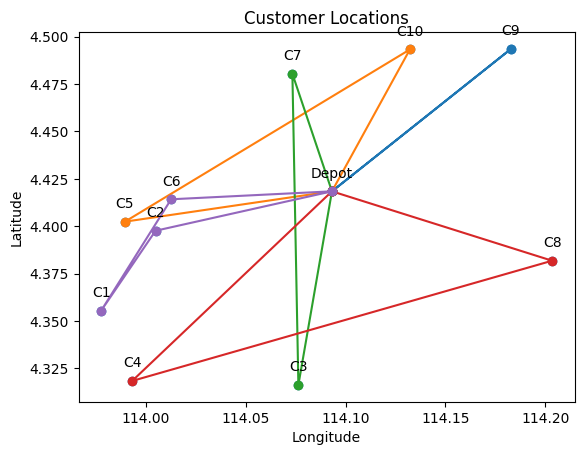

Iteration 1: Best Cost = 139.17864000366353
Iteration 2: Best Cost = 136.55041148528372
Iteration 3: Best Cost = 130.77943067417144
Iteration 4: Best Cost = 126.4306658164003
Iteration 5: Best Cost = 107.05891319433096
Iteration 6: Best Cost = 105.90977126727155
Iteration 7: Best Cost = 105.14252557859069
Iteration 8: Best Cost = 103.32731309885656
Iteration 9: Best Cost = 102.20719263798148
Iteration 10: Best Cost = 101.41898523529679
Iteration 11: Best Cost = 100.42106313324075
Iteration 12: Best Cost = 97.90123437373722
Iteration 13: Best Cost = 91.682104612474
Iteration 14: Best Cost = 87.12829506280073
Iteration 15: Best Cost = 87.12829506280073
Iteration 16: Best Cost = 87.12829506280073
Iteration 17: Best Cost = 87.12829506280073
Iteration 18: Best Cost = 87.12829506280073
Iteration 19: Best Cost = 87.12829506280073
Iteration 20: Best Cost = 87.12829506280073
Iteration 21: Best Cost = 87.12829506280073
Iteration 22: Best Cost = 87.12829506280073
Iteration 23: Best Cost = 87.1282

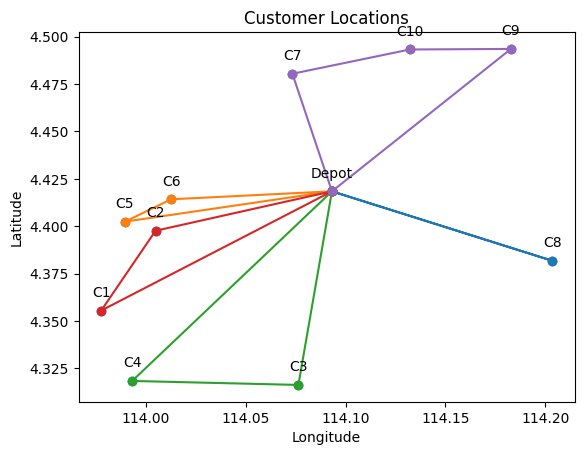

Total Distance = 119.952 km
Total Cost = RM 143.94

Vehicle 1 (Type A):
Round Trip Distance:19.741 km, Cost: RM 23.69, Demand:11
Depot -> C6 (8.061 km) -> C3 (11.68 km)

Vehicle 2 (Type A):
Round Trip Distance:17.99 km, Cost: RM 21.59, Demand:10
Depot -> C1 (13.152 km) -> C5 (4.839 km)

Vehicle 3 (Type A):
Round Trip Distance:37.5 km, Cost: RM 45.0, Demand:11
Depot -> C9 (11.691 km) -> C4 (25.809 km)

Vehicle 4 (Type A):
Round Trip Distance:38.213 km, Cost: RM 45.86, Demand:22
Depot -> C2 (9.072 km) -> C10 (15.92 km) -> C8 (13.221 km)

Vehicle 5 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)



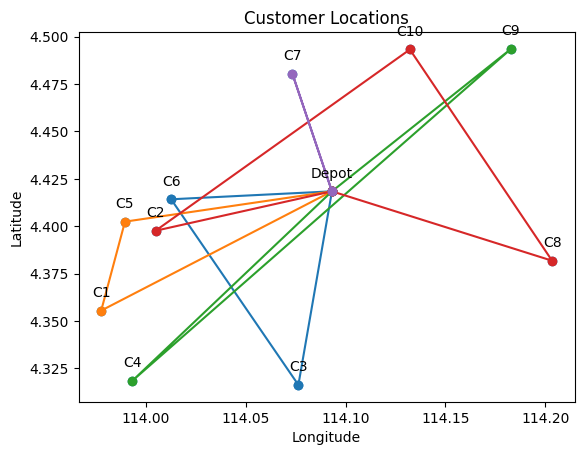

Iteration 1: Best Cost = 141.4225336917756
Iteration 2: Best Cost = 138.18369175633373
Iteration 3: Best Cost = 137.55021374950582
Iteration 4: Best Cost = 122.90511811689703
Iteration 5: Best Cost = 115.53684642857442
Iteration 6: Best Cost = 106.89293324066279
Iteration 7: Best Cost = 95.45798535102195
Iteration 8: Best Cost = 94.76939008821462
Iteration 9: Best Cost = 93.83743402054444
Iteration 10: Best Cost = 89.8195951816322
Iteration 11: Best Cost = 87.70155261870107
Iteration 12: Best Cost = 87.12829506280073
Iteration 13: Best Cost = 87.12829506280073
Iteration 14: Best Cost = 87.12829506280073
Iteration 15: Best Cost = 87.12829506280073
Iteration 16: Best Cost = 87.12829506280073
Iteration 17: Best Cost = 87.12829506280073
Iteration 18: Best Cost = 87.12829506280073
Iteration 19: Best Cost = 87.12829506280073
Iteration 20: Best Cost = 87.12829506280073
Iteration 21: Best Cost = 87.12829506280073
Iteration 22: Best Cost = 87.12829506280073
Iteration 23: Best Cost = 87.12829506

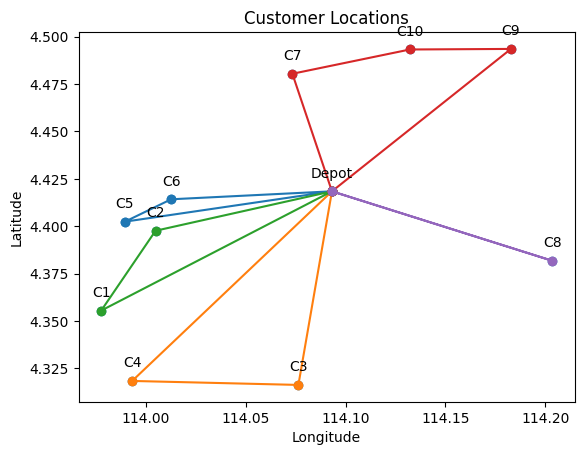

Total Distance = 100.7712 km
Total Cost = RM 120.93

Vehicle 1 (Type A):
Round Trip Distance:14.895 km, Cost: RM 17.87, Demand:13
Depot -> C6 (8.061 km) -> C1 (6.834 km)

Vehicle 2 (Type A):
Round Trip Distance:31.92 km, Cost: RM 38.3, Demand:14
Depot -> C3 (10.347 km) -> C2 (10.827 km) -> C7 (10.746 km)

Vehicle 3 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)

Vehicle 4 (Type A):
Round Trip Distance:22.55 km, Cost: RM 27.06, Demand:11
Depot -> C4 (14.142 km) -> C5 (8.408 km)

Vehicle 5 (Type A):
Round Trip Distance:22.97 km, Cost: RM 27.56, Demand:11
Depot -> C8 (11.612 km) -> C9 (11.358 km)



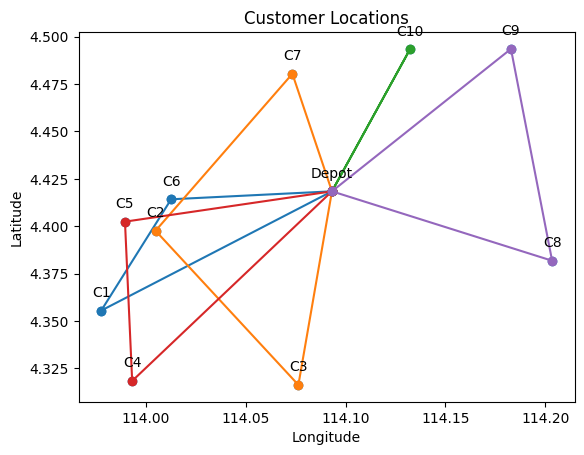

Iteration 1: Best Cost = 113.36756524930851
Iteration 2: Best Cost = 103.01486633328224
Iteration 3: Best Cost = 103.0127916118688
Iteration 4: Best Cost = 102.36021161318007
Iteration 5: Best Cost = 99.6196436689466
Iteration 6: Best Cost = 97.07186620663038
Iteration 7: Best Cost = 90.17160408688432
Iteration 8: Best Cost = 89.59834653098397
Iteration 9: Best Cost = 88.08083118063064
Iteration 10: Best Cost = 88.08083118063064
Iteration 11: Best Cost = 88.08083118063064
Iteration 12: Best Cost = 88.08083118063064
Iteration 13: Best Cost = 88.08083118063064
Iteration 14: Best Cost = 88.08083118063064
Iteration 15: Best Cost = 88.08083118063064
Iteration 16: Best Cost = 88.08083118063064
Iteration 17: Best Cost = 88.08083118063064
Iteration 18: Best Cost = 88.08083118063064
Iteration 19: Best Cost = 88.08083118063064
Iteration 20: Best Cost = 88.08083118063064
Iteration 21: Best Cost = 88.08083118063064
Iteration 22: Best Cost = 88.08083118063064
Iteration 23: Best Cost = 88.0808311806

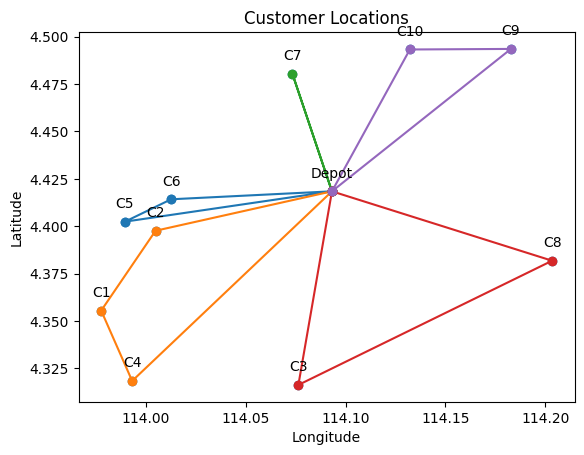

Total Distance = 115.0483 km
Total Cost = RM 138.06

Vehicle 1 (Type A):
Round Trip Distance:13.152 km, Cost: RM 15.78, Demand:5
Depot -> C1 (13.152 km)

Vehicle 2 (Type A):
Round Trip Distance:19.741 km, Cost: RM 23.69, Demand:11
Depot -> C6 (8.061 km) -> C3 (11.68 km)

Vehicle 3 (Type A):
Round Trip Distance:43.612 km, Cost: RM 52.33, Demand:20
Depot -> C10 (8.436 km) -> C8 (13.221 km) -> C4 (21.955 km)

Vehicle 4 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 5 (Type A):
Round Trip Distance:32.035 km, Cost: RM 38.44, Demand:18
Depot -> C2 (9.072 km) -> C5 (1.604 km) -> C9 (21.36 km)



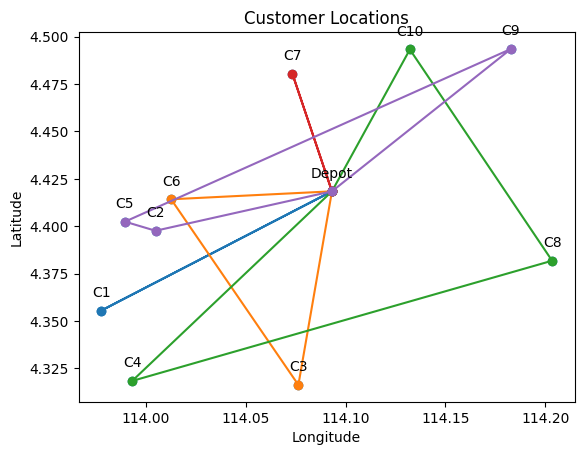

Iteration 1: Best Cost = 109.79875675881328
Iteration 2: Best Cost = 106.87067149054413
Iteration 3: Best Cost = 103.1628164335423
Iteration 4: Best Cost = 99.74755960941133
Iteration 5: Best Cost = 90.28527173426804
Iteration 6: Best Cost = 85.73146218459476
Iteration 7: Best Cost = 85.73146218459476
Iteration 8: Best Cost = 85.73146218459476
Iteration 9: Best Cost = 85.73146218459476
Iteration 10: Best Cost = 85.73146218459476
Iteration 11: Best Cost = 85.73146218459476
Iteration 12: Best Cost = 85.73146218459476
Iteration 13: Best Cost = 85.73146218459476
Iteration 14: Best Cost = 85.73146218459476
Iteration 15: Best Cost = 85.73146218459476
Iteration 16: Best Cost = 85.73146218459476
Iteration 17: Best Cost = 85.73146218459476
Iteration 18: Best Cost = 85.73146218459476
Iteration 19: Best Cost = 85.73146218459476
Iteration 20: Best Cost = 85.73146218459476
Iteration 21: Best Cost = 85.73146218459476
Iteration 22: Best Cost = 85.73146218459476
Iteration 23: Best Cost = 85.7314621845

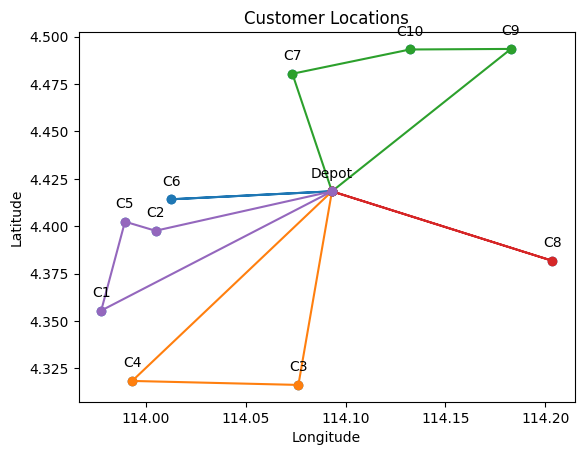

Total Distance = 132.6787 km
Total Cost = RM 159.21

Vehicle 1 (Type A):
Round Trip Distance:17.078 km, Cost: RM 20.49, Demand:14
Depot -> C2 (9.072 km) -> C4 (8.006 km)

Vehicle 2 (Type A):
Round Trip Distance:27.388 km, Cost: RM 32.87, Demand:13
Depot -> C5 (10.483 km) -> C10 (16.905 km)

Vehicle 3 (Type A):
Round Trip Distance:27.928 km, Cost: RM 33.51, Demand:9
Depot -> C8 (11.612 km) -> C7 (16.316 km)

Vehicle 4 (Type A):
Round Trip Distance:60.285 km, Cost: RM 72.34, Demand:21
Depot -> C6 (8.061 km) -> C1 (6.834 km) -> C9 (24.72 km) -> C3 (20.669 km)



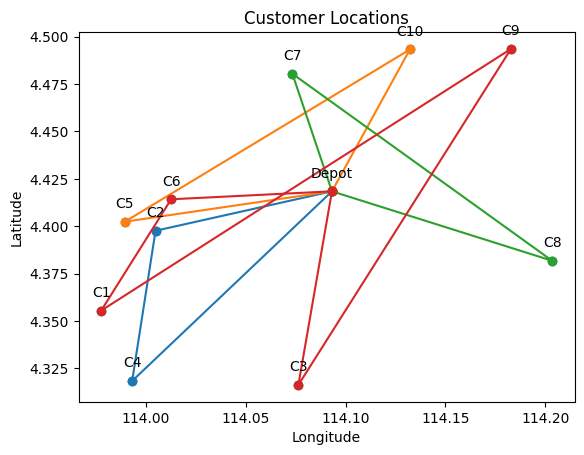

Iteration 1: Best Cost = 153.03626944955894
Iteration 2: Best Cost = 145.75042135142604
Iteration 3: Best Cost = 125.3591302066555
Iteration 4: Best Cost = 122.62794485720656
Iteration 5: Best Cost = 117.67031084613583
Iteration 6: Best Cost = 97.30152995209028
Iteration 7: Best Cost = 93.16400592016262
Iteration 8: Best Cost = 92.37579851747793
Iteration 9: Best Cost = 91.3778764154219
Iteration 10: Best Cost = 86.82406686574862
Iteration 11: Best Cost = 86.82406686574862
Iteration 12: Best Cost = 86.82406686574862
Iteration 13: Best Cost = 86.82406686574862
Iteration 14: Best Cost = 86.82406686574862
Iteration 15: Best Cost = 86.82406686574862
Iteration 16: Best Cost = 86.82406686574862
Iteration 17: Best Cost = 86.82406686574862
Iteration 18: Best Cost = 86.82406686574862
Iteration 19: Best Cost = 86.82406686574862
Iteration 20: Best Cost = 86.82406686574862
Iteration 21: Best Cost = 86.82406686574862
Iteration 22: Best Cost = 86.82406686574862
Iteration 23: Best Cost = 86.824066865

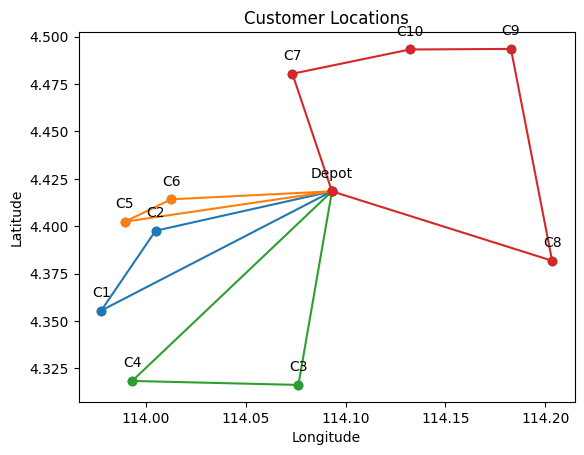

Total Distance = 103.245 km
Total Cost = RM 123.89

Vehicle 1 (Type A):
Round Trip Distance:17.043 km, Cost: RM 20.45, Demand:11
Depot -> C6 (8.061 km) -> C7 (8.982 km)

Vehicle 2 (Type A):
Round Trip Distance:34.691 km, Cost: RM 41.63, Demand:14
Depot -> C4 (14.142 km) -> C3 (8.323 km) -> C5 (12.226 km)

Vehicle 3 (Type A):
Round Trip Distance:21.657 km, Cost: RM 25.99, Demand:14
Depot -> C10 (8.436 km) -> C8 (13.221 km)

Vehicle 4 (Type A):
Round Trip Distance:18.164 km, Cost: RM 21.8, Demand:13
Depot -> C1 (13.152 km) -> C2 (5.012 km)

Vehicle 5 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)



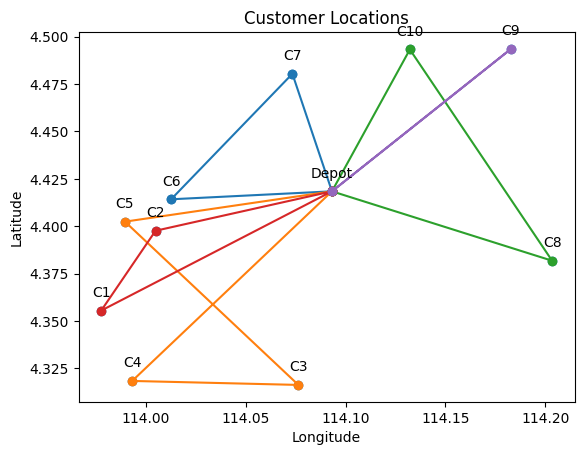

Iteration 1: Best Cost = 114.0058481524808
Iteration 2: Best Cost = 112.11848200292486
Iteration 3: Best Cost = 108.09023818467814
Iteration 4: Best Cost = 107.32455391742823
Iteration 5: Best Cost = 103.09216387132876
Iteration 6: Best Cost = 101.903613161879
Iteration 7: Best Cost = 98.30630059306169
Iteration 8: Best Cost = 95.75852313074549
Iteration 9: Best Cost = 94.76060102868945
Iteration 10: Best Cost = 94.76060102868945
Iteration 11: Best Cost = 94.76060102868945
Iteration 12: Best Cost = 94.76060102868945
Iteration 13: Best Cost = 94.76060102868945
Iteration 14: Best Cost = 94.76060102868945
Iteration 15: Best Cost = 94.76060102868945
Iteration 16: Best Cost = 94.76060102868945
Iteration 17: Best Cost = 94.76060102868945
Iteration 18: Best Cost = 94.76060102868945
Iteration 19: Best Cost = 94.76060102868945
Iteration 20: Best Cost = 94.76060102868945
Iteration 21: Best Cost = 94.76060102868945
Iteration 22: Best Cost = 94.76060102868945
Iteration 23: Best Cost = 94.760601028

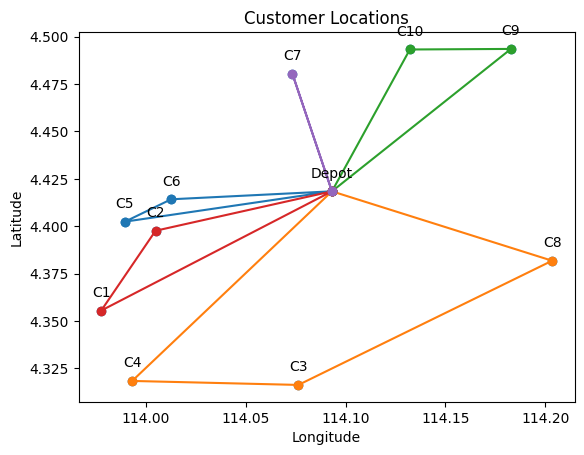

Total Distance = 102.9483 km
Total Cost = RM 123.54

Vehicle 1 (Type A):
Round Trip Distance:13.077 km, Cost: RM 15.69, Demand:13
Depot -> C5 (10.483 km) -> C6 (2.594 km)

Vehicle 2 (Type A):
Round Trip Distance:22.769 km, Cost: RM 27.32, Demand:16
Depot -> C9 (11.691 km) -> C10 (5.06 km) -> C7 (6.018 km)

Vehicle 3 (Type A):
Round Trip Distance:22.148 km, Cost: RM 26.58, Demand:14
Depot -> C4 (14.142 km) -> C2 (8.006 km)

Vehicle 4 (Type A):
Round Trip Distance:44.955 km, Cost: RM 53.95, Demand:14
Depot -> C8 (11.612 km) -> C1 (22.723 km) -> C3 (10.62 km)



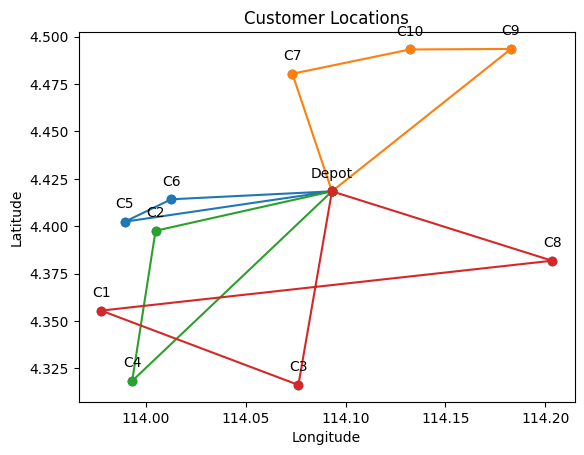

Iteration 1: Best Cost = 115.63202477180792
Iteration 2: Best Cost = 114.78391218493333
Iteration 3: Best Cost = 104.86973514470841
Iteration 4: Best Cost = 104.21715514601968
Iteration 5: Best Cost = 102.09911258308854
Iteration 6: Best Cost = 101.5258550271882
Iteration 7: Best Cost = 96.97204547751492
Iteration 8: Best Cost = 96.87700014465982
Iteration 9: Best Cost = 96.87700014465982
Iteration 10: Best Cost = 96.87700014465982
Iteration 11: Best Cost = 96.87700014465982
Iteration 12: Best Cost = 96.87700014465982
Iteration 13: Best Cost = 96.87700014465982
Iteration 14: Best Cost = 96.87700014465982
Iteration 15: Best Cost = 96.87700014465982
Iteration 16: Best Cost = 96.87700014465982
Iteration 17: Best Cost = 96.87700014465982
Iteration 18: Best Cost = 96.87700014465982
Iteration 19: Best Cost = 96.87700014465982
Iteration 20: Best Cost = 96.87700014465982
Iteration 21: Best Cost = 96.87700014465982
Iteration 22: Best Cost = 96.87700014465982
Iteration 23: Best Cost = 96.8770001

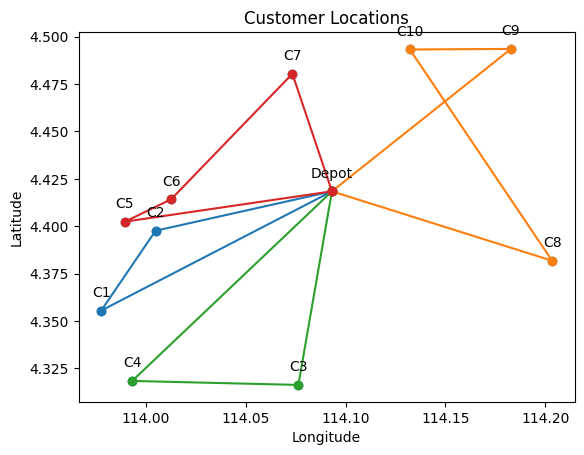

Total Distance = 116.5063 km
Total Cost = RM 139.81

Vehicle 1 (Type A):
Round Trip Distance:23.919 km, Cost: RM 28.7, Demand:14
Depot -> C4 (14.142 km) -> C6 (9.776 km)

Vehicle 2 (Type A):
Round Trip Distance:15.321 km, Cost: RM 18.39, Demand:10
Depot -> C5 (10.483 km) -> C1 (4.839 km)

Vehicle 3 (Type A):
Round Trip Distance:31.901 km, Cost: RM 38.28, Demand:13
Depot -> C9 (11.691 km) -> C2 (20.21 km)

Vehicle 4 (Type A):
Round Trip Distance:45.365 km, Cost: RM 54.44, Demand:20
Depot -> C7 (6.508 km) -> C10 (6.018 km) -> C3 (18.549 km) -> C8 (14.29 km)



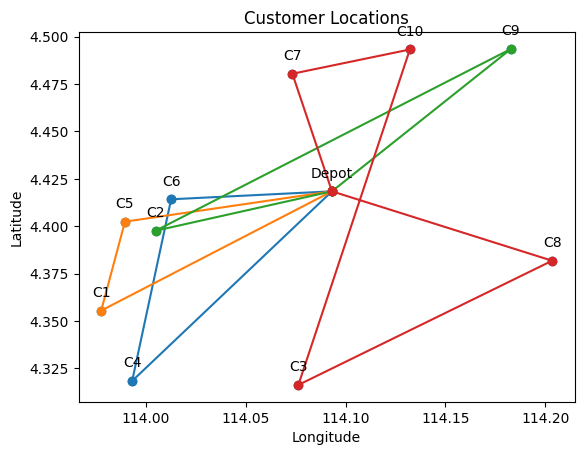

Iteration 1: Best Cost = 118.03473708314718
Iteration 2: Best Cost = 114.8164115785268
Iteration 3: Best Cost = 106.15208625050583
Iteration 4: Best Cost = 102.24556723947703
Iteration 5: Best Cost = 100.5521892227016
Iteration 6: Best Cost = 99.36363851325183
Iteration 7: Best Cost = 99.36363851325183
Iteration 8: Best Cost = 99.36363851325183
Iteration 9: Best Cost = 99.36363851325183
Iteration 10: Best Cost = 99.36363851325183
Iteration 11: Best Cost = 99.36363851325183
Iteration 12: Best Cost = 99.36363851325183
Iteration 13: Best Cost = 99.36363851325183
Iteration 14: Best Cost = 99.36363851325183
Iteration 15: Best Cost = 99.36363851325183
Iteration 16: Best Cost = 99.36363851325183
Iteration 17: Best Cost = 99.36363851325183
Iteration 18: Best Cost = 99.36363851325183
Iteration 19: Best Cost = 99.36363851325183
Iteration 20: Best Cost = 99.36363851325183
Iteration 21: Best Cost = 99.36363851325183
Iteration 22: Best Cost = 99.36363851325183
Iteration 23: Best Cost = 99.363638513

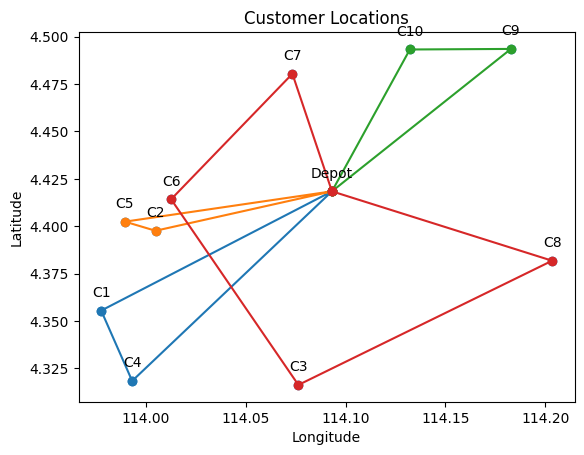

Total Distance = 116.2681 km
Total Cost = RM 139.52

Vehicle 1 (Type A):
Round Trip Distance:22.55 km, Cost: RM 27.06, Demand:11
Depot -> C4 (14.142 km) -> C5 (8.408 km)

Vehicle 2 (Type A):
Round Trip Distance:25.836 km, Cost: RM 31.0, Demand:19
Depot -> C2 (9.072 km) -> C7 (10.746 km) -> C10 (6.018 km)

Vehicle 3 (Type A):
Round Trip Distance:43.246 km, Cost: RM 51.89, Demand:18
Depot -> C9 (11.691 km) -> C1 (24.72 km) -> C6 (6.834 km)

Vehicle 4 (Type A):
Round Trip Distance:24.637 km, Cost: RM 29.56, Demand:9
Depot -> C3 (10.347 km) -> C8 (14.29 km)



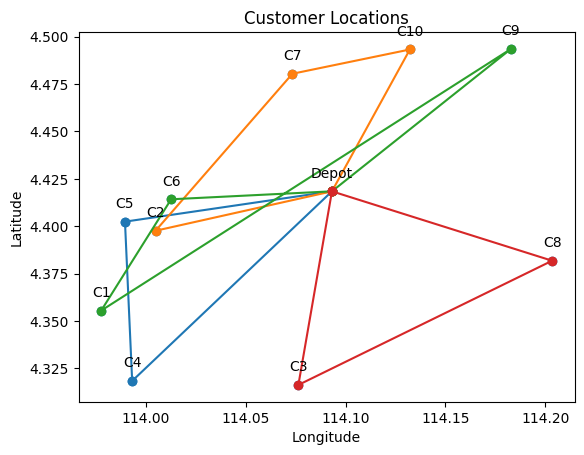

Iteration 1: Best Cost = 134.09450177704355
Iteration 2: Best Cost = 130.75740804480233
Iteration 3: Best Cost = 125.1366322364093
Iteration 4: Best Cost = 110.65819374158231
Iteration 5: Best Cost = 104.71110046776586
Iteration 6: Best Cost = 101.75506649668398
Iteration 7: Best Cost = 100.5421945478436
Iteration 8: Best Cost = 96.6356755368148
Iteration 9: Best Cost = 87.17338766167151
Iteration 10: Best Cost = 85.98483695222173
Iteration 11: Best Cost = 85.98483695222173
Iteration 12: Best Cost = 85.98483695222173
Iteration 13: Best Cost = 85.98483695222173
Iteration 14: Best Cost = 85.98483695222173
Iteration 15: Best Cost = 85.98483695222173
Iteration 16: Best Cost = 85.98483695222173
Iteration 17: Best Cost = 85.98483695222173
Iteration 18: Best Cost = 85.98483695222173
Iteration 19: Best Cost = 85.98483695222173
Iteration 20: Best Cost = 85.98483695222173
Iteration 21: Best Cost = 85.98483695222173
Iteration 22: Best Cost = 85.98483695222173
Iteration 23: Best Cost = 85.98483695

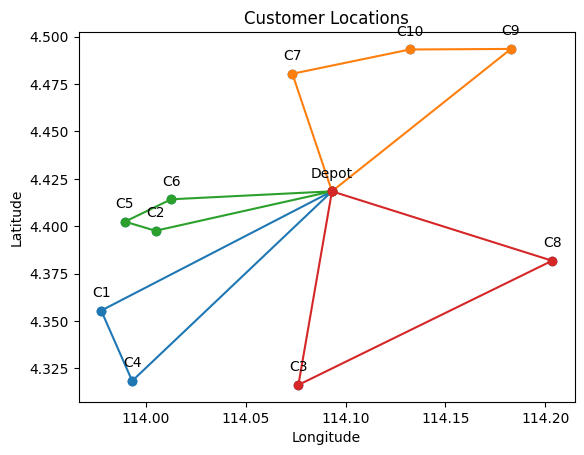

Total Distance = 105.3229 km
Total Cost = RM 126.39

Vehicle 1 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 2 (Type A):
Round Trip Distance:23.049 km, Cost: RM 27.66, Demand:11
Depot -> C9 (11.691 km) -> C8 (11.358 km)

Vehicle 3 (Type A):
Round Trip Distance:15.321 km, Cost: RM 18.39, Demand:10
Depot -> C5 (10.483 km) -> C1 (4.839 km)

Vehicle 4 (Type A):
Round Trip Distance:40.545 km, Cost: RM 48.65, Demand:22
Depot -> C10 (8.436 km) -> C4 (22.333 km) -> C6 (9.776 km)

Vehicle 5 (Type A):
Round Trip Distance:19.898 km, Cost: RM 23.88, Demand:11
Depot -> C2 (9.072 km) -> C3 (10.827 km)



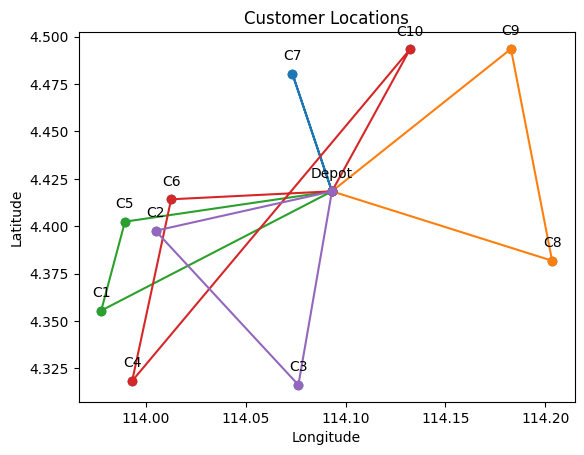

Iteration 1: Best Cost = 113.85172969102274
Iteration 2: Best Cost = 111.64868410619883
Iteration 3: Best Cost = 105.23632693520624
Iteration 4: Best Cost = 101.46800280660828
Iteration 5: Best Cost = 97.4616646871673
Iteration 6: Best Cost = 94.0964058469438
Iteration 7: Best Cost = 92.40302783016837
Iteration 8: Best Cost = 92.30798249731326
Iteration 9: Best Cost = 92.30798249731326
Iteration 10: Best Cost = 92.30798249731326
Iteration 11: Best Cost = 92.30798249731326
Iteration 12: Best Cost = 92.30798249731326
Iteration 13: Best Cost = 92.30798249731326
Iteration 14: Best Cost = 92.30798249731326
Iteration 15: Best Cost = 92.30798249731326
Iteration 16: Best Cost = 92.30798249731326
Iteration 17: Best Cost = 92.30798249731326
Iteration 18: Best Cost = 92.30798249731326
Iteration 19: Best Cost = 92.30798249731326
Iteration 20: Best Cost = 92.30798249731326
Iteration 21: Best Cost = 92.30798249731326
Iteration 22: Best Cost = 92.30798249731326
Iteration 23: Best Cost = 92.3079824973

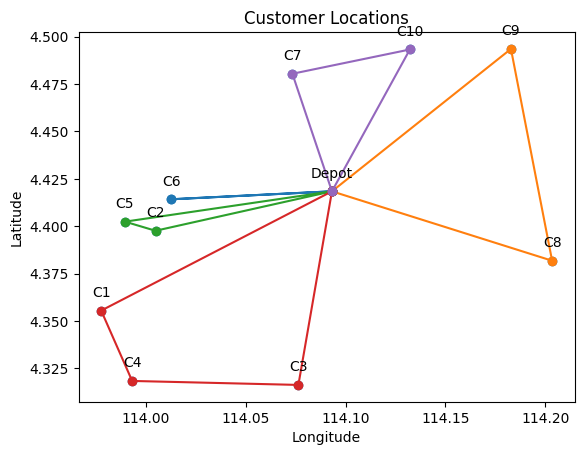

Total Distance = 115.1149 km
Total Cost = RM 138.14

Vehicle 1 (Type A):
Round Trip Distance:9.072 km, Cost: RM 10.89, Demand:8
Depot -> C2 (9.072 km)

Vehicle 2 (Type A):
Round Trip Distance:33.847 km, Cost: RM 40.62, Demand:13
Depot -> C1 (13.152 km) -> C10 (20.696 km)

Vehicle 3 (Type A):
Round Trip Distance:35.995 km, Cost: RM 43.19, Demand:14
Depot -> C3 (10.347 km) -> C8 (14.29 km) -> C9 (11.358 km)

Vehicle 4 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 5 (Type A):
Round Trip Distance:22.058 km, Cost: RM 26.47, Demand:16
Depot -> C5 (10.483 km) -> C6 (2.594 km) -> C7 (8.982 km)



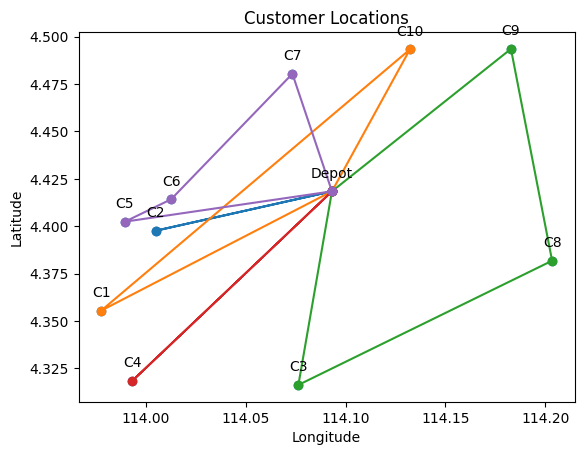

Iteration 1: Best Cost = 135.12115469729085
Iteration 2: Best Cost = 134.50143021190303
Iteration 3: Best Cost = 130.68182261934808
Iteration 4: Best Cost = 113.30323208651133
Iteration 5: Best Cost = 111.89571598137897
Iteration 6: Best Cost = 108.09274508577113
Iteration 7: Best Cost = 107.18096805602842
Iteration 8: Best Cost = 101.54614814797894
Iteration 9: Best Cost = 97.52830930906671
Iteration 10: Best Cost = 95.64256118731986
Iteration 11: Best Cost = 90.48030668961441
Iteration 12: Best Cost = 90.4803066896144
Iteration 13: Best Cost = 84.26117692835118
Iteration 14: Best Cost = 81.85981553243717
Iteration 15: Best Cost = 81.85981553243717
Iteration 16: Best Cost = 81.85981553243717
Iteration 17: Best Cost = 81.85981553243717
Iteration 18: Best Cost = 81.85981553243717
Iteration 19: Best Cost = 81.85981553243717
Iteration 20: Best Cost = 81.85981553243717
Iteration 21: Best Cost = 81.85981553243717
Iteration 22: Best Cost = 81.85981553243717
Iteration 23: Best Cost = 81.85981

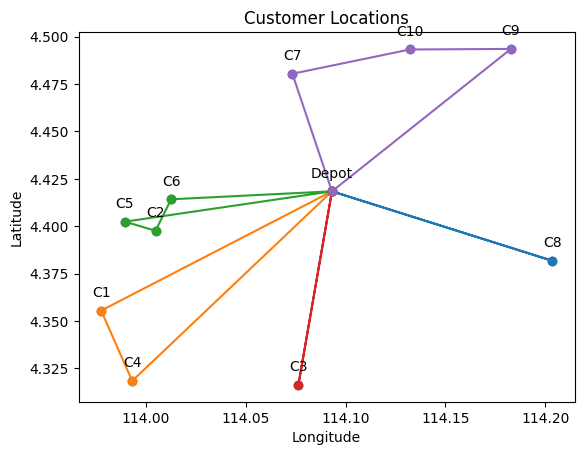

Total Distance = 138.6016 km
Total Cost = RM 166.32

Vehicle 1 (Type A):
Round Trip Distance:36.967 km, Cost: RM 44.36, Demand:14
Depot -> C5 (10.483 km) -> C4 (8.408 km) -> C7 (18.077 km)

Vehicle 2 (Type A):
Round Trip Distance:24.992 km, Cost: RM 29.99, Demand:16
Depot -> C2 (9.072 km) -> C10 (15.92 km)

Vehicle 3 (Type A):
Round Trip Distance:45.688 km, Cost: RM 54.83, Demand:13
Depot -> C3 (10.347 km) -> C1 (10.62 km) -> C9 (24.72 km)

Vehicle 4 (Type A):
Round Trip Distance:30.955 km, Cost: RM 37.15, Demand:14
Depot -> C8 (11.612 km) -> C6 (19.343 km)



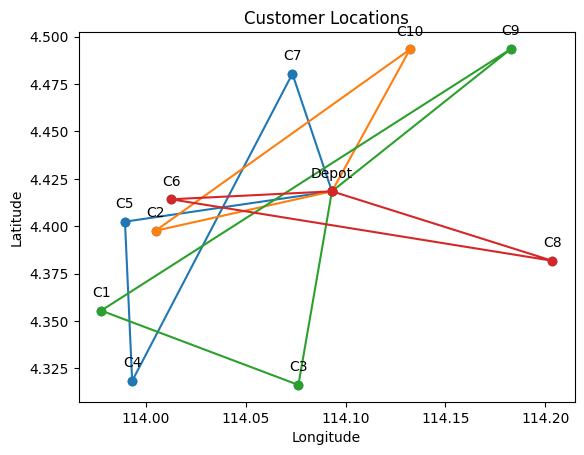

Iteration 1: Best Cost = 135.2765680805458
Iteration 2: Best Cost = 128.69849579217922
Iteration 3: Best Cost = 121.3597926431737
Iteration 4: Best Cost = 120.246126965391
Iteration 5: Best Cost = 118.16823395854058
Iteration 6: Best Cost = 111.15775651353357
Iteration 7: Best Cost = 109.62147150859491
Iteration 8: Best Cost = 92.76584410090699
Iteration 9: Best Cost = 91.22536424342924
Iteration 10: Best Cost = 90.289263110217
Iteration 11: Best Cost = 88.77174775986366
Iteration 12: Best Cost = 88.77174775986366
Iteration 13: Best Cost = 88.77174775986366
Iteration 14: Best Cost = 88.77174775986366
Iteration 15: Best Cost = 88.77174775986366
Iteration 16: Best Cost = 88.77174775986366
Iteration 17: Best Cost = 88.77174775986366
Iteration 18: Best Cost = 88.77174775986366
Iteration 19: Best Cost = 88.77174775986366
Iteration 20: Best Cost = 88.77174775986366
Iteration 21: Best Cost = 88.77174775986366
Iteration 22: Best Cost = 88.77174775986366
Iteration 23: Best Cost = 88.77174775986

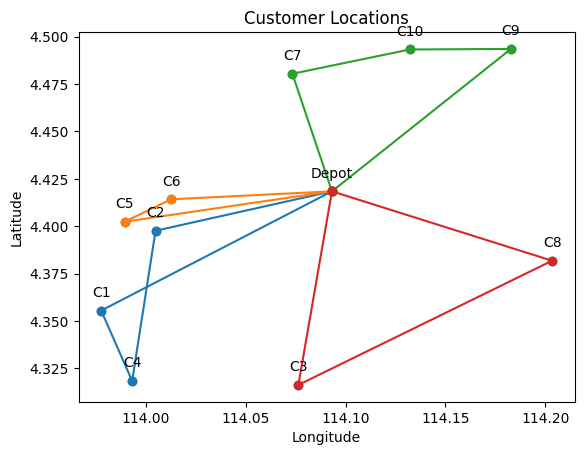

Total Distance = 108.4563 km
Total Cost = RM 130.15

Vehicle 1 (Type A):
Round Trip Distance:22.709 km, Cost: RM 27.25, Demand:8
Depot -> C9 (11.691 km) -> C7 (11.018 km)

Vehicle 2 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 3 (Type A):
Round Trip Distance:43.382 km, Cost: RM 52.06, Demand:17
Depot -> C8 (11.612 km) -> C10 (13.221 km) -> C3 (18.549 km)

Vehicle 4 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 5 (Type A):
Round Trip Distance:17.74 km, Cost: RM 21.29, Demand:21
Depot -> C2 (9.072 km) -> C6 (1.834 km) -> C1 (6.834 km)



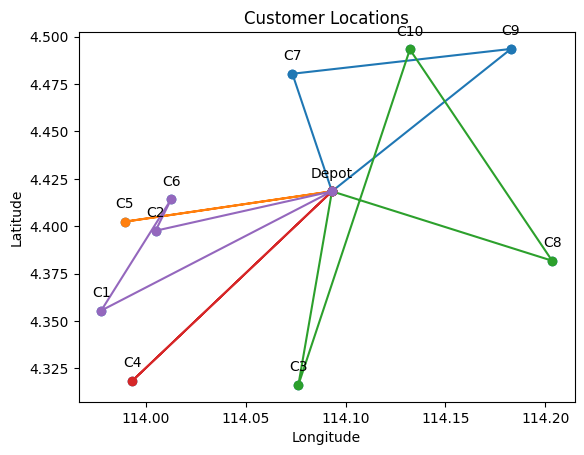

Iteration 1: Best Cost = 126.88016644870689
Iteration 2: Best Cost = 125.6359178891951
Iteration 3: Best Cost = 124.93507402489607
Iteration 4: Best Cost = 124.55503908400554
Iteration 5: Best Cost = 120.36907198828709
Iteration 6: Best Cost = 112.31029239986431
Iteration 7: Best Cost = 112.3102923998643
Iteration 8: Best Cost = 110.42454427811744
Iteration 9: Best Cost = 106.02096919187554
Iteration 10: Best Cost = 100.30514127223309
Iteration 11: Best Cost = 96.55868131673226
Iteration 12: Best Cost = 94.15731992081825
Iteration 13: Best Cost = 85.6298065828893
Iteration 14: Best Cost = 81.7232875718605
Iteration 15: Best Cost = 81.7232875718605
Iteration 16: Best Cost = 81.7232875718605
Iteration 17: Best Cost = 81.7232875718605
Iteration 18: Best Cost = 81.7232875718605
Iteration 19: Best Cost = 81.7232875718605
Iteration 20: Best Cost = 81.7232875718605
Iteration 21: Best Cost = 81.7232875718605
Iteration 22: Best Cost = 81.7232875718605
Iteration 23: Best Cost = 81.7232875718605


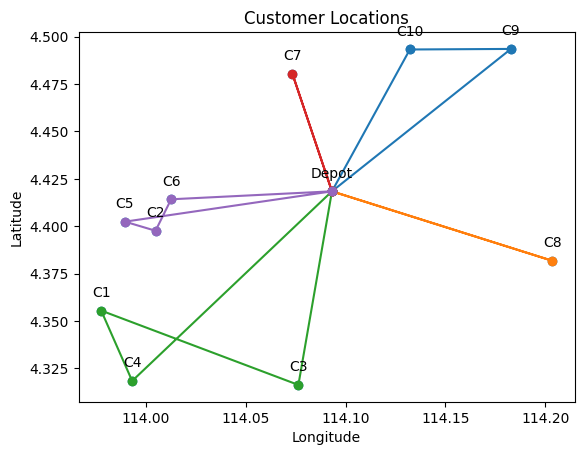

Total Distance = 138.914 km
Total Cost = RM 166.7

Vehicle 1 (Type A):
Round Trip Distance:22.243 km, Cost: RM 26.69, Demand:8
Depot -> C7 (6.508 km) -> C1 (15.735 km)

Vehicle 2 (Type A):
Round Trip Distance:54.479 km, Cost: RM 65.37, Demand:22
Depot -> C5 (10.483 km) -> C3 (12.226 km) -> C10 (18.549 km) -> C8 (13.221 km)

Vehicle 3 (Type A):
Round Trip Distance:48.05 km, Cost: RM 57.66, Demand:21
Depot -> C2 (9.072 km) -> C9 (20.21 km) -> C6 (18.768 km)

Vehicle 4 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)



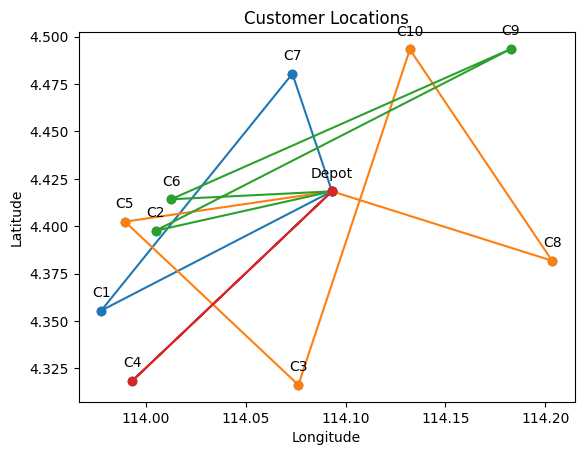

Iteration 1: Best Cost = 138.3209419172249
Iteration 2: Best Cost = 128.43284146939877
Iteration 3: Best Cost = 127.06778473565338
Iteration 4: Best Cost = 121.06644978760623
Iteration 5: Best Cost = 108.05076650224201
Iteration 6: Best Cost = 105.30035500439482
Iteration 7: Best Cost = 104.95698406958769
Iteration 8: Best Cost = 104.95698406958769
Iteration 9: Best Cost = 104.95698406958769
Iteration 10: Best Cost = 104.95698406958769
Iteration 11: Best Cost = 104.95698406958769
Iteration 12: Best Cost = 104.95698406958769
Iteration 13: Best Cost = 104.95698406958769
Iteration 14: Best Cost = 104.95698406958769
Iteration 15: Best Cost = 104.95698406958769
Iteration 16: Best Cost = 104.95698406958769
Iteration 17: Best Cost = 104.95698406958769
Iteration 18: Best Cost = 104.95698406958769
Iteration 19: Best Cost = 104.95698406958769
Iteration 20: Best Cost = 104.95698406958769
Iteration 21: Best Cost = 104.95698406958769
Iteration 22: Best Cost = 104.95698406958769
Iteration 23: Best C

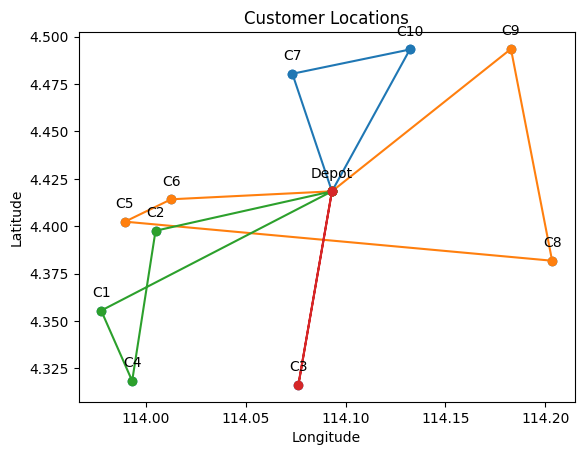

Total Distance = 133.9972 km
Total Cost = RM 185.53

Vehicle 1 (Type B):
Round Trip Distance:82.439 km, Cost: RM 123.66, Demand:27
Depot -> C1 (13.152 km) -> C9 (24.72 km) -> C4 (25.809 km) -> C6 (9.776 km) -> C7 (8.982 km)

Vehicle 2 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 3 (Type A):
Round Trip Distance:9.072 km, Cost: RM 10.89, Demand:8
Depot -> C2 (9.072 km)

Vehicle 4 (Type A):
Round Trip Distance:21.657 km, Cost: RM 25.99, Demand:14
Depot -> C10 (8.436 km) -> C8 (13.221 km)

Vehicle 5 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)



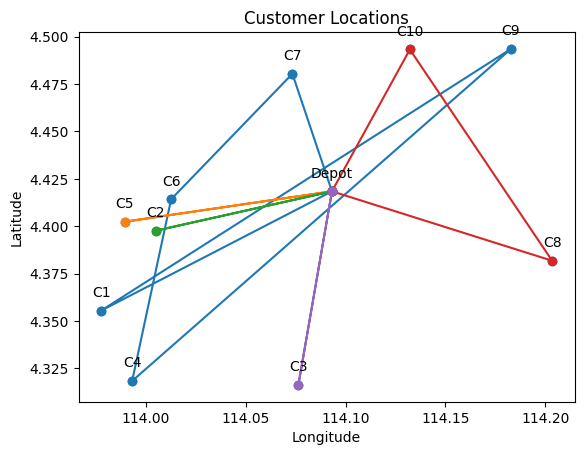

Iteration 1: Best Cost = 184.96913130412267
Iteration 2: Best Cost = 182.44930254461914
Iteration 3: Best Cost = 170.3932860801091
Iteration 4: Best Cost = 153.84967696962588
Iteration 5: Best Cost = 146.48140528130324
Iteration 6: Best Cost = 146.4814052813032
Iteration 7: Best Cost = 123.41141174228774
Iteration 8: Best Cost = 123.41141174228773
Iteration 9: Best Cost = 109.41388085998935
Iteration 10: Best Cost = 104.1631992541098
Iteration 11: Best Cost = 104.16319925410978
Iteration 12: Best Cost = 101.24896122556781
Iteration 13: Best Cost = 101.2489612255678
Iteration 14: Best Cost = 98.64837603430647
Iteration 15: Best Cost = 95.16602558139243
Iteration 16: Best Cost = 95.16602558139242
Iteration 17: Best Cost = 95.16602558139242
Iteration 18: Best Cost = 95.16602558139242
Iteration 19: Best Cost = 95.16602558139242
Iteration 20: Best Cost = 95.16602558139242
Iteration 21: Best Cost = 95.16602558139242
Iteration 22: Best Cost = 95.16602558139242
Iteration 23: Best Cost = 95.166

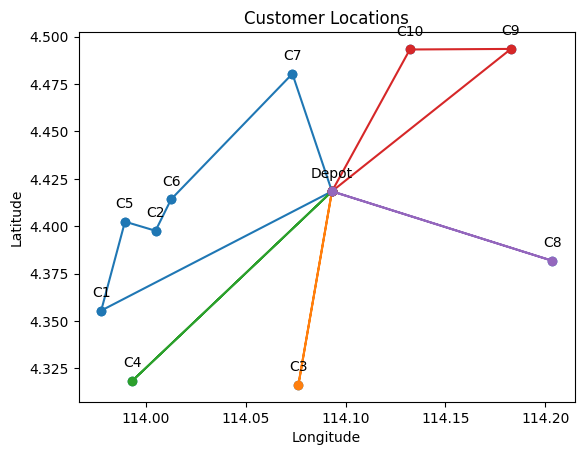

Total Distance = 102.6353 km
Total Cost = RM 123.16

Vehicle 1 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)

Vehicle 2 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 3 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 4 (Type A):
Round Trip Distance:44.362 km, Cost: RM 53.23, Demand:21
Depot -> C4 (14.142 km) -> C1 (4.021 km) -> C5 (4.839 km) -> C9 (21.36 km)

Vehicle 5 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)

Vehicle 6 (Type A):
Round Trip Distance:19.818 km, Cost: RM 23.78, Demand:11
Depot -> C2 (9.072 km) -> C7 (10.746 km)



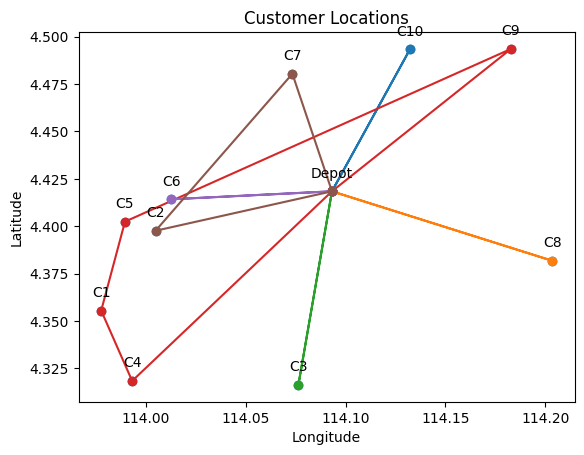

Iteration 1: Best Cost = 122.62503680973185
Iteration 2: Best Cost = 120.89398635775675
Iteration 3: Best Cost = 99.10634434207853
Iteration 4: Best Cost = 91.95666721716967
Iteration 5: Best Cost = 89.55530582125564
Iteration 6: Best Cost = 89.55530582125564
Iteration 7: Best Cost = 89.55530582125564
Iteration 8: Best Cost = 89.55530582125564
Iteration 9: Best Cost = 89.55530582125564
Iteration 10: Best Cost = 89.55530582125564
Iteration 11: Best Cost = 89.55530582125564
Iteration 12: Best Cost = 89.55530582125564
Iteration 13: Best Cost = 89.55530582125564
Iteration 14: Best Cost = 89.55530582125564
Iteration 15: Best Cost = 89.55530582125564
Iteration 16: Best Cost = 89.55530582125564
Iteration 17: Best Cost = 89.55530582125564
Iteration 18: Best Cost = 89.55530582125564
Iteration 19: Best Cost = 89.55530582125564
Iteration 20: Best Cost = 89.55530582125564
Iteration 21: Best Cost = 89.55530582125564
Iteration 22: Best Cost = 89.55530582125564
Iteration 23: Best Cost = 89.5553058212

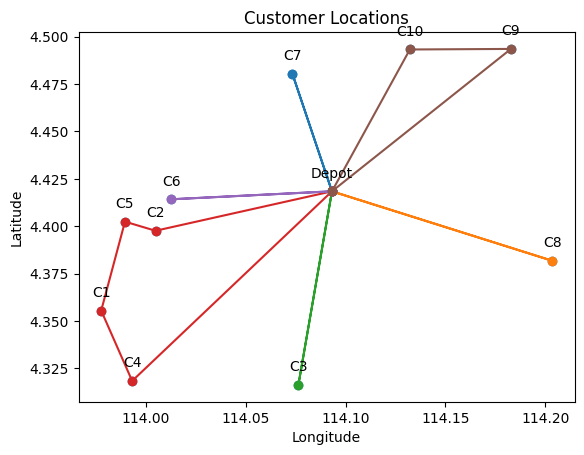

Total Distance = 97.1119 km
Total Cost = RM 116.53

Vehicle 1 (Type A):
Round Trip Distance:27.256 km, Cost: RM 32.71, Demand:16
Depot -> C7 (6.508 km) -> C1 (15.735 km) -> C2 (5.012 km)

Vehicle 2 (Type A):
Round Trip Distance:13.496 km, Cost: RM 16.19, Demand:13
Depot -> C10 (8.436 km) -> C9 (5.06 km)

Vehicle 3 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 4 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 5 (Type A):
Round Trip Distance:23.919 km, Cost: RM 28.7, Demand:14
Depot -> C4 (14.142 km) -> C6 (9.776 km)

Vehicle 6 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)



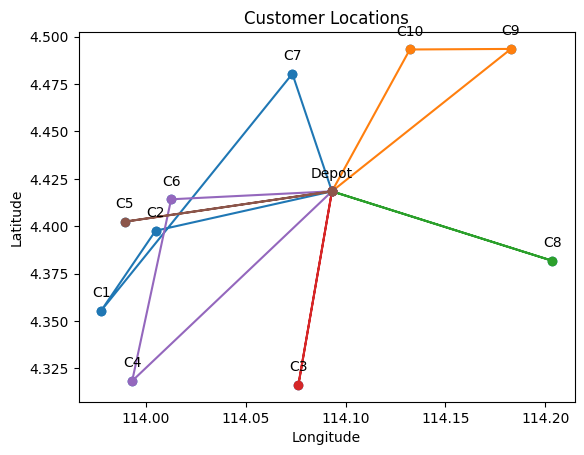

Iteration 1: Best Cost = 111.98554479145456
Iteration 2: Best Cost = 105.00901417664633
Iteration 3: Best Cost = 105.00901417664632
Iteration 4: Best Cost = 98.87115126802252
Iteration 5: Best Cost = 98.8711512680225
Iteration 6: Best Cost = 97.75103080714744
Iteration 7: Best Cost = 97.75103080714743
Iteration 8: Best Cost = 92.37844359409404
Iteration 9: Best Cost = 91.59684260706135
Iteration 10: Best Cost = 90.40835315998773
Iteration 11: Best Cost = 85.86550889264485
Iteration 12: Best Cost = 84.86758679058882
Iteration 13: Best Cost = 84.86758679058882
Iteration 14: Best Cost = 84.86758679058882
Iteration 15: Best Cost = 84.86758679058882
Iteration 16: Best Cost = 84.86758679058882
Iteration 17: Best Cost = 84.86758679058882
Iteration 18: Best Cost = 84.86758679058882
Iteration 19: Best Cost = 84.86758679058882
Iteration 20: Best Cost = 84.86758679058882
Iteration 21: Best Cost = 84.86758679058882
Iteration 22: Best Cost = 84.86758679058882
Iteration 23: Best Cost = 84.8675867905

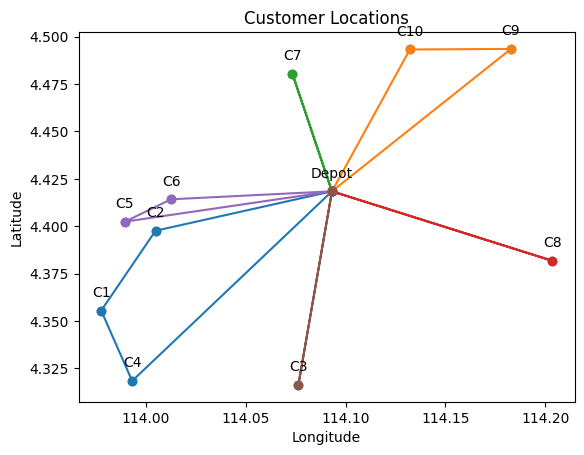

Total Distance = 121.5585 km
Total Cost = RM 145.87

Vehicle 1 (Type A):
Round Trip Distance:22.825 km, Cost: RM 27.39, Demand:9
Depot -> C7 (6.508 km) -> C8 (16.316 km)

Vehicle 2 (Type A):
Round Trip Distance:38.665 km, Cost: RM 46.4, Demand:19
Depot -> C10 (8.436 km) -> C3 (18.549 km) -> C6 (11.68 km)

Vehicle 3 (Type A):
Round Trip Distance:14.084 km, Cost: RM 16.9, Demand:13
Depot -> C2 (9.072 km) -> C1 (5.012 km)

Vehicle 4 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 5 (Type A):
Round Trip Distance:31.843 km, Cost: RM 38.21, Demand:10
Depot -> C5 (10.483 km) -> C9 (21.36 km)



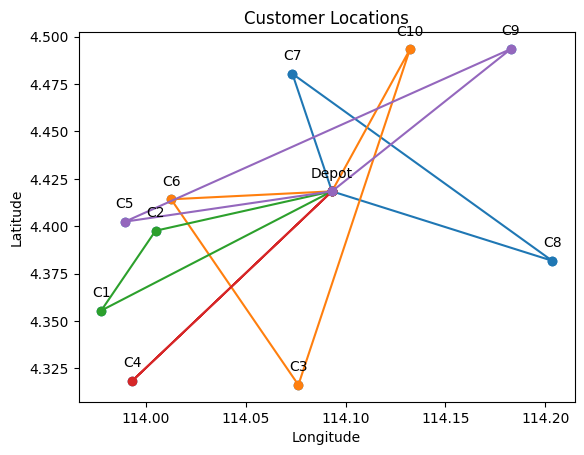

Iteration 1: Best Cost = 144.28196299942476
Iteration 2: Best Cost = 140.31635644624103
Iteration 3: Best Cost = 138.84674157282484
Iteration 4: Best Cost = 131.51677835461513
Iteration 5: Best Cost = 120.45981159090684
Iteration 6: Best Cost = 115.89121693661653
Iteration 7: Best Cost = 111.43450595712353
Iteration 8: Best Cost = 107.99915177242244
Iteration 9: Best Cost = 107.01032295615127
Iteration 10: Best Cost = 92.30798249731326
Iteration 11: Best Cost = 92.30798249731326
Iteration 12: Best Cost = 92.30798249731326
Iteration 13: Best Cost = 92.30798249731326
Iteration 14: Best Cost = 92.30798249731326
Iteration 15: Best Cost = 92.30798249731326
Iteration 16: Best Cost = 92.30798249731326
Iteration 17: Best Cost = 92.30798249731326
Iteration 18: Best Cost = 92.30798249731326
Iteration 19: Best Cost = 92.30798249731326
Iteration 20: Best Cost = 92.30798249731326
Iteration 21: Best Cost = 92.30798249731326
Iteration 22: Best Cost = 92.30798249731326
Iteration 23: Best Cost = 92.307

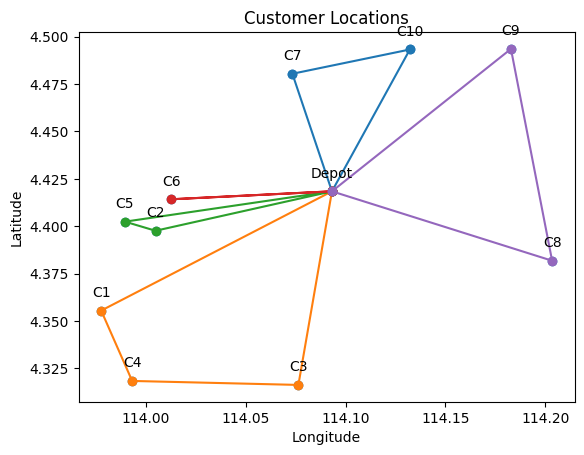

Total Distance = 117.4733 km
Total Cost = RM 140.97

Vehicle 1 (Type A):
Round Trip Distance:34.335 km, Cost: RM 41.2, Demand:11
Depot -> C8 (11.612 km) -> C1 (22.723 km)

Vehicle 2 (Type A):
Round Trip Distance:39.176 km, Cost: RM 47.01, Demand:19
Depot -> C10 (8.436 km) -> C4 (22.333 km) -> C5 (8.408 km)

Vehicle 3 (Type A):
Round Trip Distance:10.906 km, Cost: RM 13.09, Demand:16
Depot -> C2 (9.072 km) -> C6 (1.834 km)

Vehicle 4 (Type A):
Round Trip Distance:22.709 km, Cost: RM 27.25, Demand:8
Depot -> C9 (11.691 km) -> C7 (11.018 km)

Vehicle 5 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)



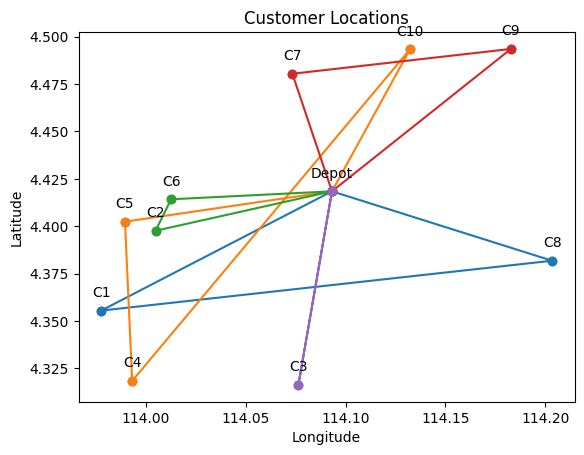

Iteration 1: Best Cost = 124.15556172158558
Iteration 2: Best Cost = 114.69327384644228
Iteration 3: Best Cost = 106.30781599994079
Iteration 4: Best Cost = 102.01768280807876
Iteration 5: Best Cost = 92.66290599410853
Iteration 6: Best Cost = 88.75638698307972
Iteration 7: Best Cost = 88.75638698307972
Iteration 8: Best Cost = 88.75638698307972
Iteration 9: Best Cost = 88.75638698307972
Iteration 10: Best Cost = 88.75638698307972
Iteration 11: Best Cost = 88.75638698307972
Iteration 12: Best Cost = 88.75638698307972
Iteration 13: Best Cost = 88.75638698307972
Iteration 14: Best Cost = 88.75638698307972
Iteration 15: Best Cost = 88.75638698307972
Iteration 16: Best Cost = 88.75638698307972
Iteration 17: Best Cost = 88.75638698307972
Iteration 18: Best Cost = 88.75638698307972
Iteration 19: Best Cost = 88.75638698307972
Iteration 20: Best Cost = 88.75638698307972
Iteration 21: Best Cost = 88.75638698307972
Iteration 22: Best Cost = 88.75638698307972
Iteration 23: Best Cost = 88.75638698

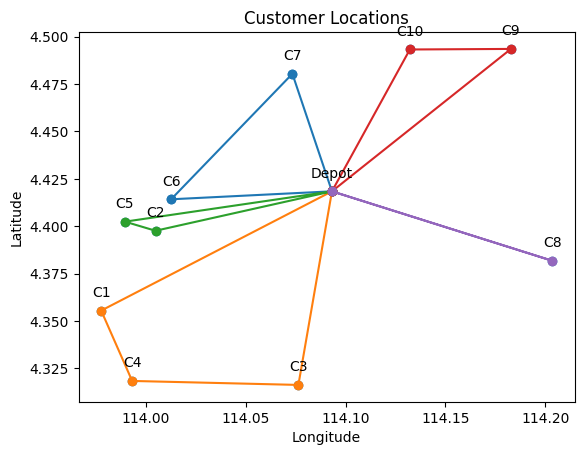

Total Distance = 109.591 km
Total Cost = RM 131.51

Vehicle 1 (Type A):
Round Trip Distance:32.36 km, Cost: RM 38.83, Demand:8
Depot -> C9 (11.691 km) -> C3 (20.669 km)

Vehicle 2 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)

Vehicle 3 (Type A):
Round Trip Distance:10.655 km, Cost: RM 12.79, Demand:13
Depot -> C6 (8.061 km) -> C5 (2.594 km)

Vehicle 4 (Type A):
Round Trip Distance:17.255 km, Cost: RM 20.71, Demand:11
Depot -> C7 (6.508 km) -> C2 (10.746 km)

Vehicle 5 (Type A):
Round Trip Distance:40.886 km, Cost: RM 49.06, Demand:17
Depot -> C4 (14.142 km) -> C1 (4.021 km) -> C8 (22.723 km)



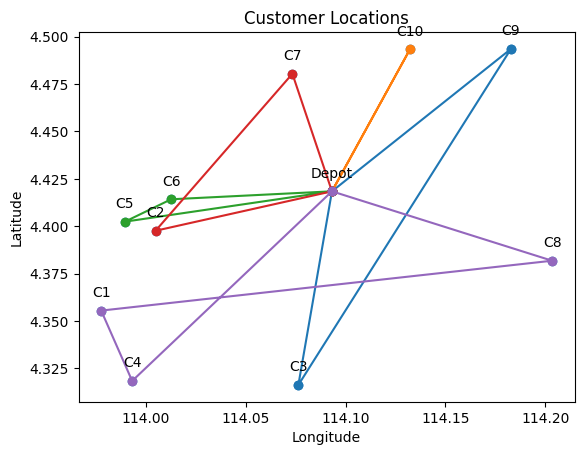

Iteration 1: Best Cost = 131.41338098698623
Iteration 2: Best Cost = 121.38941253864614
Iteration 3: Best Cost = 106.76178483265238
Iteration 4: Best Cost = 106.59707445366304
Iteration 5: Best Cost = 105.9444944549743
Iteration 6: Best Cost = 98.79481733006543
Iteration 7: Best Cost = 97.79689522800938
Iteration 8: Best Cost = 94.76060102868945
Iteration 9: Best Cost = 94.76060102868945
Iteration 10: Best Cost = 94.76060102868945
Iteration 11: Best Cost = 94.76060102868945
Iteration 12: Best Cost = 94.76060102868945
Iteration 13: Best Cost = 94.76060102868945
Iteration 14: Best Cost = 94.76060102868945
Iteration 15: Best Cost = 94.76060102868945
Iteration 16: Best Cost = 94.76060102868945
Iteration 17: Best Cost = 94.76060102868945
Iteration 18: Best Cost = 94.76060102868945
Iteration 19: Best Cost = 94.76060102868945
Iteration 20: Best Cost = 94.76060102868945
Iteration 21: Best Cost = 94.76060102868945
Iteration 22: Best Cost = 94.76060102868945
Iteration 23: Best Cost = 94.76060102

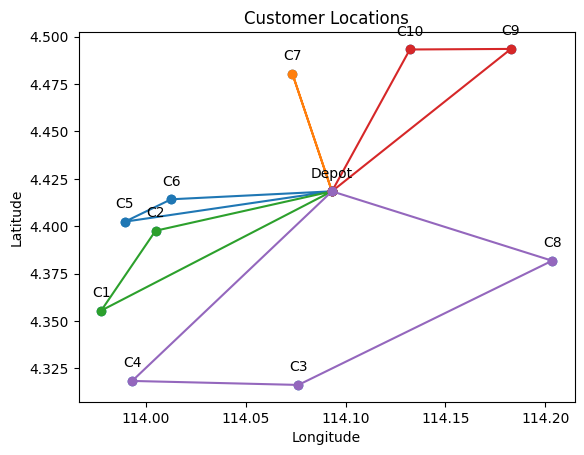

Total Distance = 116.4267 km
Total Cost = RM 139.71

Vehicle 1 (Type A):
Round Trip Distance:9.072 km, Cost: RM 10.89, Demand:8
Depot -> C2 (9.072 km)

Vehicle 2 (Type A):
Round Trip Distance:69.1 km, Cost: RM 82.92, Demand:24
Depot -> C10 (8.436 km) -> C8 (13.221 km) -> C1 (22.723 km) -> C9 (24.72 km)

Vehicle 3 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 4 (Type A):
Round Trip Distance:18.67 km, Cost: RM 22.4, Demand:9
Depot -> C3 (10.347 km) -> C4 (8.323 km)

Vehicle 5 (Type A):
Round Trip Distance:13.077 km, Cost: RM 15.69, Demand:13
Depot -> C5 (10.483 km) -> C6 (2.594 km)



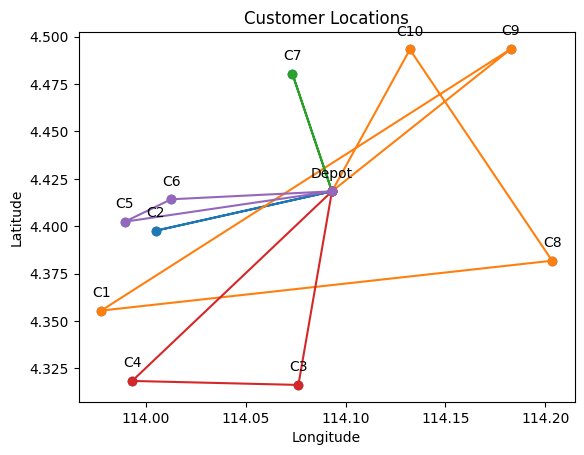

Iteration 1: Best Cost = 136.71218576293157
Iteration 2: Best Cost = 120.41012594743913
Iteration 3: Best Cost = 117.64602074046341
Iteration 4: Best Cost = 117.26598579957287
Iteration 5: Best Cost = 108.60166047155191
Iteration 6: Best Cost = 108.12191687263059
Iteration 7: Best Cost = 105.60208811312707
Iteration 8: Best Cost = 105.24518643163218
Iteration 9: Best Cost = 97.87691474330956
Iteration 10: Best Cost = 86.87702072811462
Iteration 11: Best Cost = 86.59945883848715
Iteration 12: Best Cost = 86.43850057634515
Iteration 13: Best Cost = 85.06992879558746
Iteration 14: Best Cost = 85.06992879558746
Iteration 15: Best Cost = 85.06992879558746
Iteration 16: Best Cost = 85.06992879558746
Iteration 17: Best Cost = 85.06992879558746
Iteration 18: Best Cost = 85.06992879558746
Iteration 19: Best Cost = 85.06992879558746
Iteration 20: Best Cost = 85.06992879558746
Iteration 21: Best Cost = 85.06992879558746
Iteration 22: Best Cost = 85.06992879558746
Iteration 23: Best Cost = 85.0699

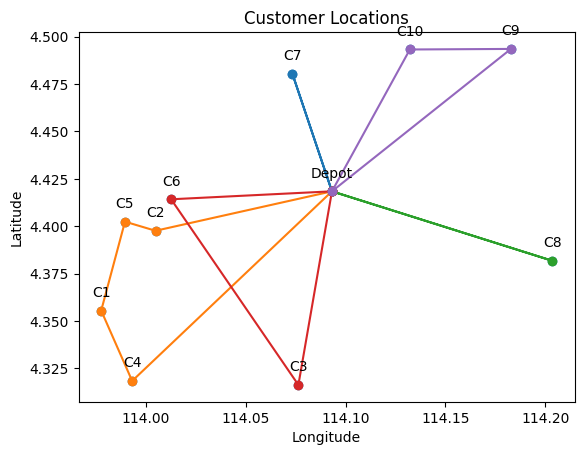

Total Distance = 126.5788 km
Total Cost = RM 151.89

Vehicle 1 (Type A):
Round Trip Distance:42.104 km, Cost: RM 50.53, Demand:22
Depot -> C10 (8.436 km) -> C6 (14.325 km) -> C8 (19.343 km)

Vehicle 2 (Type A):
Round Trip Distance:22.243 km, Cost: RM 26.69, Demand:8
Depot -> C7 (6.508 km) -> C1 (15.735 km)

Vehicle 3 (Type A):
Round Trip Distance:29.18 km, Cost: RM 35.02, Demand:17
Depot -> C3 (10.347 km) -> C2 (10.827 km) -> C4 (8.006 km)

Vehicle 4 (Type A):
Round Trip Distance:33.051 km, Cost: RM 39.66, Demand:10
Depot -> C9 (11.691 km) -> C5 (21.36 km)



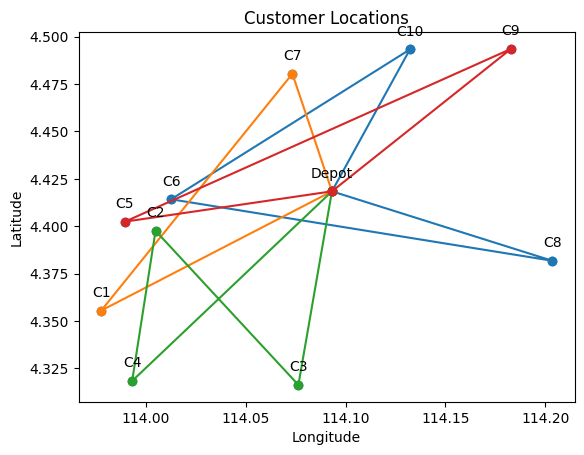

Iteration 1: Best Cost = 149.54972361186032
Iteration 2: Best Cost = 147.99174452621892
Iteration 3: Best Cost = 147.41767476230206
Iteration 4: Best Cost = 138.12095809639715
Iteration 5: Best Cost = 137.5836195013839
Iteration 6: Best Cost = 105.95042804670626
Iteration 7: Best Cost = 105.80988660259939
Iteration 8: Best Cost = 100.81981193061802
Iteration 9: Best Cost = 97.51380849112564
Iteration 10: Best Cost = 97.41876315827054
Iteration 11: Best Cost = 95.72538514149512
Iteration 12: Best Cost = 95.27572916127556
Iteration 13: Best Cost = 95.27572916127556
Iteration 14: Best Cost = 95.27572916127556
Iteration 15: Best Cost = 95.27572916127556
Iteration 16: Best Cost = 95.27572916127556
Iteration 17: Best Cost = 95.27572916127556
Iteration 18: Best Cost = 95.27572916127556
Iteration 19: Best Cost = 95.27572916127556
Iteration 20: Best Cost = 95.27572916127556
Iteration 21: Best Cost = 95.27572916127556
Iteration 22: Best Cost = 95.27572916127556
Iteration 23: Best Cost = 95.27572

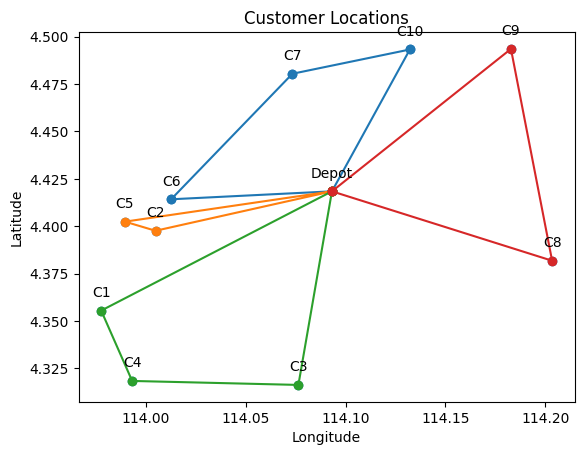

Total Distance = 98.9738 km
Total Cost = RM 118.77

Vehicle 1 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)

Vehicle 2 (Type A):
Round Trip Distance:38.213 km, Cost: RM 45.86, Demand:22
Depot -> C2 (9.072 km) -> C10 (15.92 km) -> C8 (13.221 km)

Vehicle 3 (Type A):
Round Trip Distance:13.152 km, Cost: RM 15.78, Demand:5
Depot -> C1 (13.152 km)

Vehicle 4 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 5 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 6 (Type A):
Round Trip Distance:19.063 km, Cost: RM 22.88, Demand:19
Depot -> C6 (8.061 km) -> C5 (2.594 km) -> C4 (8.408 km)



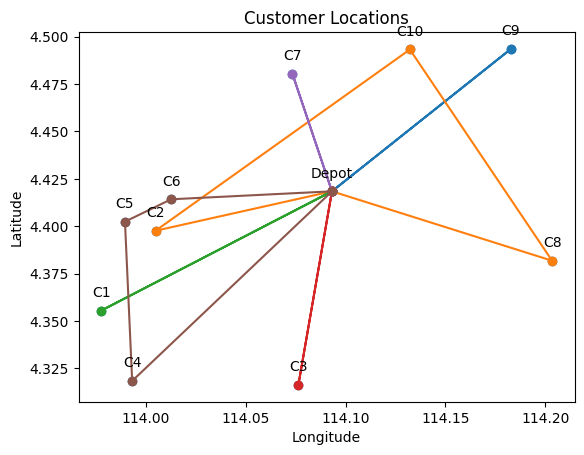

Iteration 1: Best Cost = 115.66634849023642
Iteration 2: Best Cost = 115.6663484902364
Iteration 3: Best Cost = 112.57198490901037
Iteration 4: Best Cost = 110.74688457869921
Iteration 5: Best Cost = 109.19390495820073
Iteration 6: Best Cost = 108.25780382498849
Iteration 7: Best Cost = 106.580993380508
Iteration 8: Best Cost = 98.67167529244104
Iteration 9: Best Cost = 94.96909666315098
Iteration 10: Best Cost = 91.20077253455302
Iteration 11: Best Cost = 87.83551369432952
Iteration 12: Best Cost = 87.83551369432952
Iteration 13: Best Cost = 87.83551369432952
Iteration 14: Best Cost = 87.83551369432952
Iteration 15: Best Cost = 87.83551369432952
Iteration 16: Best Cost = 87.83551369432952
Iteration 17: Best Cost = 87.83551369432952
Iteration 18: Best Cost = 87.83551369432952
Iteration 19: Best Cost = 87.83551369432952
Iteration 20: Best Cost = 87.83551369432952
Iteration 21: Best Cost = 87.83551369432952
Iteration 22: Best Cost = 87.83551369432952
Iteration 23: Best Cost = 87.83551369

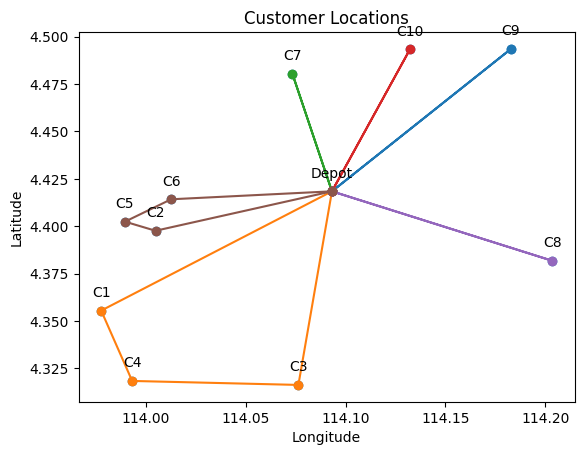

Total Distance = 120.6816 km
Total Cost = RM 144.82

Vehicle 1 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)

Vehicle 2 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 3 (Type A):
Round Trip Distance:22.573 km, Cost: RM 27.09, Demand:8
Depot -> C3 (10.347 km) -> C5 (12.226 km)

Vehicle 4 (Type A):
Round Trip Distance:29.131 km, Cost: RM 34.96, Demand:13
Depot -> C10 (8.436 km) -> C1 (20.696 km)

Vehicle 5 (Type A):
Round Trip Distance:39.951 km, Cost: RM 47.94, Demand:11
Depot -> C4 (14.142 km) -> C9 (25.809 km)

Vehicle 6 (Type A):
Round Trip Distance:10.906 km, Cost: RM 13.09, Demand:16
Depot -> C2 (9.072 km) -> C6 (1.834 km)



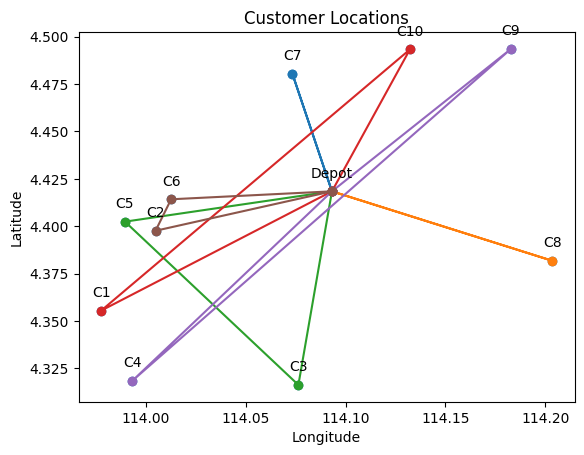

Iteration 1: Best Cost = 140.98698644182784
Iteration 2: Best Cost = 133.07919977403873
Iteration 3: Best Cost = 99.90972331442245
Iteration 4: Best Cost = 98.97776724675224
Iteration 5: Best Cost = 97.92960567690119
Iteration 6: Best Cost = 90.02984128829426
Iteration 7: Best Cost = 90.02984128829426
Iteration 8: Best Cost = 90.02984128829426
Iteration 9: Best Cost = 90.02984128829426
Iteration 10: Best Cost = 90.02984128829426
Iteration 11: Best Cost = 90.02984128829426
Iteration 12: Best Cost = 90.02984128829426
Iteration 13: Best Cost = 90.02984128829426
Iteration 14: Best Cost = 90.02984128829426
Iteration 15: Best Cost = 90.02984128829426
Iteration 16: Best Cost = 90.02984128829426
Iteration 17: Best Cost = 90.02984128829426
Iteration 18: Best Cost = 90.02984128829426
Iteration 19: Best Cost = 90.02984128829426
Iteration 20: Best Cost = 90.02984128829426
Iteration 21: Best Cost = 90.02984128829426
Iteration 22: Best Cost = 90.02984128829426
Iteration 23: Best Cost = 90.0298412882

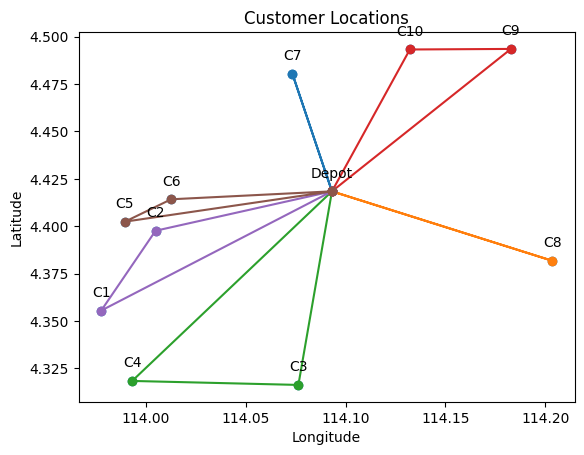

Total Distance = 115.3545 km
Total Cost = RM 138.43

Vehicle 1 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 2 (Type A):
Round Trip Distance:53.364 km, Cost: RM 64.04, Demand:22
Depot -> C5 (10.483 km) -> C3 (12.226 km) -> C4 (8.323 km) -> C10 (22.333 km)

Vehicle 3 (Type A):
Round Trip Distance:14.084 km, Cost: RM 16.9, Demand:13
Depot -> C2 (9.072 km) -> C1 (5.012 km)

Vehicle 4 (Type A):
Round Trip Distance:36.294 km, Cost: RM 43.55, Demand:16
Depot -> C7 (6.508 km) -> C9 (11.018 km) -> C6 (18.768 km)



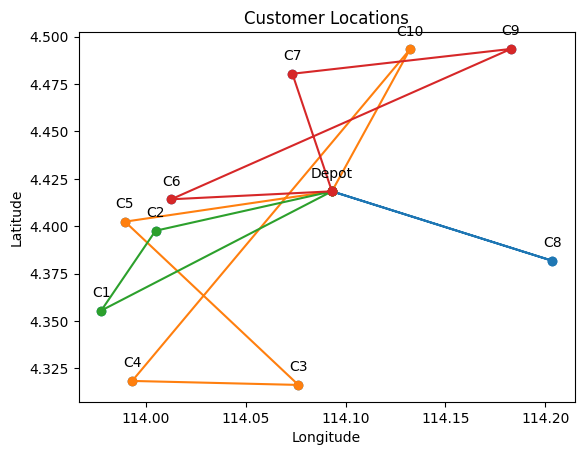

Iteration 1: Best Cost = 106.90851190008712
Iteration 2: Best Cost = 96.18796497797882
Iteration 3: Best Cost = 95.42071928929798
Iteration 4: Best Cost = 95.1954463666591
Iteration 5: Best Cost = 93.59735063830786
Iteration 6: Best Cost = 91.58417459207436
Iteration 7: Best Cost = 89.3475235751497
Iteration 8: Best Cost = 89.3475235751497
Iteration 9: Best Cost = 89.3475235751497
Iteration 10: Best Cost = 89.3475235751497
Iteration 11: Best Cost = 89.3475235751497
Iteration 12: Best Cost = 89.3475235751497
Iteration 13: Best Cost = 89.3475235751497
Iteration 14: Best Cost = 89.3475235751497
Iteration 15: Best Cost = 89.3475235751497
Iteration 16: Best Cost = 89.3475235751497
Iteration 17: Best Cost = 89.3475235751497
Iteration 18: Best Cost = 89.3475235751497
Iteration 19: Best Cost = 89.3475235751497
Iteration 20: Best Cost = 89.3475235751497
Iteration 21: Best Cost = 89.3475235751497
Iteration 22: Best Cost = 89.3475235751497
Iteration 23: Best Cost = 89.3475235751497
Iteration 24: 

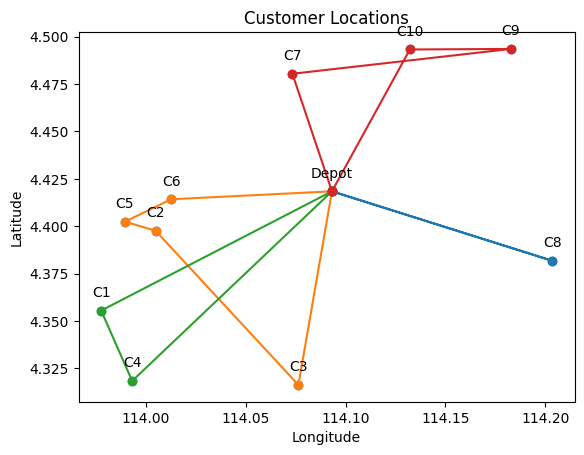

Total Distance = 104.2087 km
Total Cost = RM 125.05

Vehicle 1 (Type A):
Round Trip Distance:32.36 km, Cost: RM 38.83, Demand:8
Depot -> C9 (11.691 km) -> C3 (20.669 km)

Vehicle 2 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)

Vehicle 3 (Type A):
Round Trip Distance:28.799 km, Cost: RM 34.56, Demand:19
Depot -> C2 (9.072 km) -> C7 (10.746 km) -> C6 (8.982 km)

Vehicle 4 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 5 (Type A):
Round Trip Distance:23.002 km, Cost: RM 27.6, Demand:16
Depot -> C4 (14.142 km) -> C1 (4.021 km) -> C5 (4.839 km)



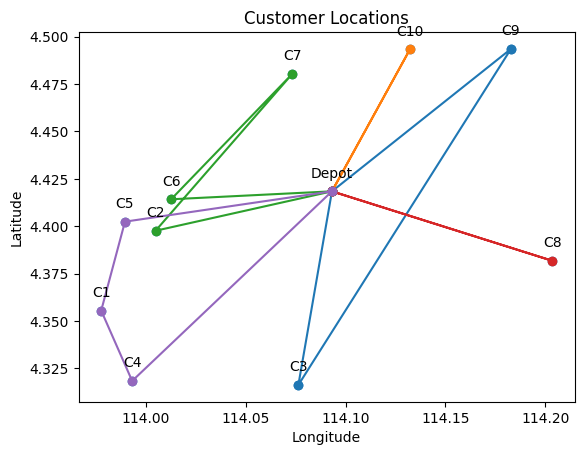

Iteration 1: Best Cost = 112.36011534357192
Iteration 2: Best Cost = 111.08824779960827
Iteration 3: Best Cost = 103.13824394320633
Iteration 4: Best Cost = 101.37805439553736
Iteration 5: Best Cost = 91.77762793430415
Iteration 6: Best Cost = 88.03116797880332
Iteration 7: Best Cost = 88.0311679788033
Iteration 8: Best Cost = 85.6298065828893
Iteration 9: Best Cost = 81.72328757186048
Iteration 10: Best Cost = 81.72328757186048
Iteration 11: Best Cost = 81.72328757186048
Iteration 12: Best Cost = 81.72328757186048
Iteration 13: Best Cost = 81.72328757186048
Iteration 14: Best Cost = 81.72328757186048
Iteration 15: Best Cost = 81.72328757186048
Iteration 16: Best Cost = 81.72328757186048
Iteration 17: Best Cost = 81.72328757186048
Iteration 18: Best Cost = 81.72328757186048
Iteration 19: Best Cost = 81.72328757186048
Iteration 20: Best Cost = 81.72328757186048
Iteration 21: Best Cost = 81.72328757186048
Iteration 22: Best Cost = 81.72328757186048
Iteration 23: Best Cost = 81.7232875718

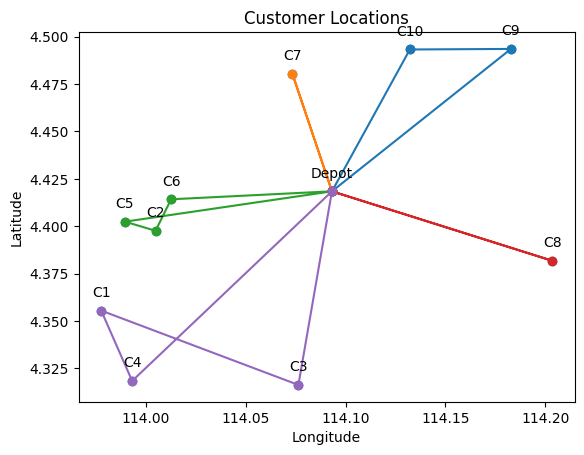

Total Distance = 119.1527 km
Total Cost = RM 142.98

Vehicle 1 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 2 (Type A):
Round Trip Distance:11.612 km, Cost: RM 13.93, Demand:6
Depot -> C8 (11.612 km)

Vehicle 3 (Type A):
Round Trip Distance:52.637 km, Cost: RM 63.16, Demand:19
Depot -> C6 (8.061 km) -> C9 (18.768 km) -> C4 (25.809 km)

Vehicle 4 (Type A):
Round Trip Distance:18.164 km, Cost: RM 21.8, Demand:13
Depot -> C1 (13.152 km) -> C2 (5.012 km)

Vehicle 5 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)

Vehicle 6 (Type A):
Round Trip Distance:17.957 km, Cost: RM 21.55, Demand:8
Depot -> C7 (6.508 km) -> C5 (11.448 km)



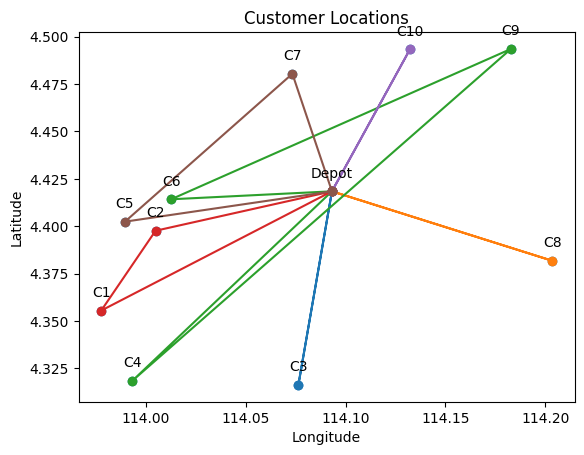

Iteration 1: Best Cost = 141.93239546332853
Iteration 2: Best Cost = 100.57536421086056
Iteration 3: Best Cost = 93.4256870859517
Iteration 4: Best Cost = 84.76136175793073
Iteration 5: Best Cost = 84.7613617579307
Iteration 6: Best Cost = 84.7613617579307
Iteration 7: Best Cost = 84.7613617579307
Iteration 8: Best Cost = 84.7613617579307
Iteration 9: Best Cost = 84.7613617579307
Iteration 10: Best Cost = 84.7613617579307
Iteration 11: Best Cost = 84.7613617579307
Iteration 12: Best Cost = 84.7613617579307
Iteration 13: Best Cost = 84.7613617579307
Iteration 14: Best Cost = 84.7613617579307
Iteration 15: Best Cost = 84.7613617579307
Iteration 16: Best Cost = 84.7613617579307
Iteration 17: Best Cost = 84.7613617579307
Iteration 18: Best Cost = 84.7613617579307
Iteration 19: Best Cost = 84.7613617579307
Iteration 20: Best Cost = 84.7613617579307
Iteration 21: Best Cost = 84.7613617579307
Iteration 22: Best Cost = 84.7613617579307
Iteration 23: Best Cost = 84.7613617579307
Iteration 24: B

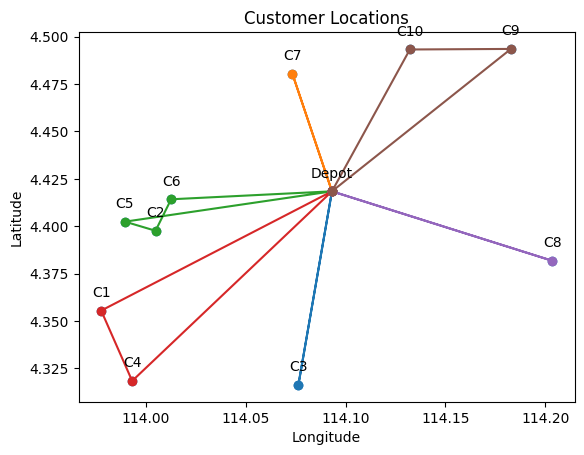

Total Distance = 122.0388 km
Total Cost = RM 146.45

Vehicle 1 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 2 (Type A):
Round Trip Distance:32.124 km, Cost: RM 38.55, Demand:16
Depot -> C2 (9.072 km) -> C3 (10.827 km) -> C5 (12.226 km)

Vehicle 3 (Type A):
Round Trip Distance:11.691 km, Cost: RM 14.03, Demand:5
Depot -> C9 (11.691 km)

Vehicle 4 (Type A):
Round Trip Distance:55.645 km, Cost: RM 66.77, Demand:22
Depot -> C1 (13.152 km) -> C6 (6.834 km) -> C8 (19.343 km) -> C7 (16.316 km)

Vehicle 5 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)



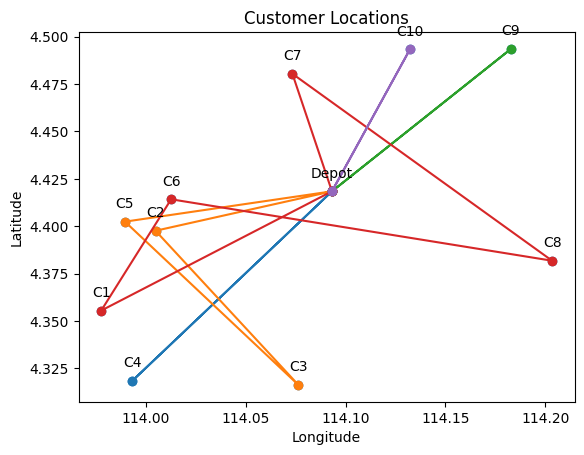

Iteration 1: Best Cost = 131.8781189913542
Iteration 2: Best Cost = 119.14005171786329
Iteration 3: Best Cost = 116.38329364700783
Iteration 4: Best Cost = 109.01502195868521
Iteration 5: Best Cost = 107.6499652249398
Iteration 6: Best Cost = 105.2486038290258
Iteration 7: Best Cost = 105.24860382902578
Iteration 8: Best Cost = 105.24860382902578
Iteration 9: Best Cost = 105.24860382902578
Iteration 10: Best Cost = 105.24860382902578
Iteration 11: Best Cost = 105.24860382902578
Iteration 12: Best Cost = 105.24860382902578
Iteration 13: Best Cost = 105.24860382902578
Iteration 14: Best Cost = 105.24860382902578
Iteration 15: Best Cost = 105.24860382902578
Iteration 16: Best Cost = 105.24860382902578
Iteration 17: Best Cost = 105.24860382902578
Iteration 18: Best Cost = 105.24860382902578
Iteration 19: Best Cost = 105.24860382902578
Iteration 20: Best Cost = 105.24860382902578
Iteration 21: Best Cost = 105.24860382902578
Iteration 22: Best Cost = 105.24860382902578
Iteration 23: Best Cos

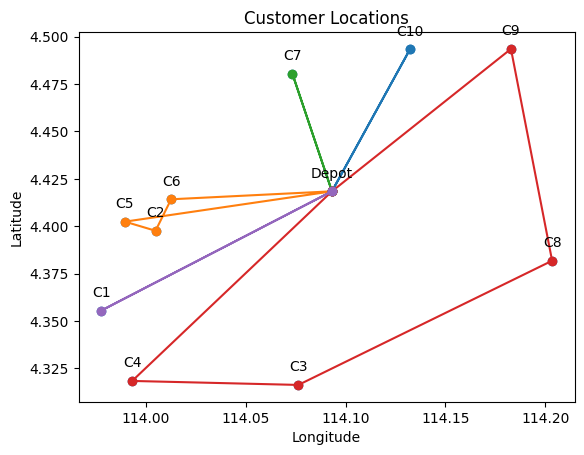

Total Distance = 124.0825 km
Total Cost = RM 148.9

Vehicle 1 (Type A):
Round Trip Distance:13.152 km, Cost: RM 15.78, Demand:5
Depot -> C1 (13.152 km)

Vehicle 2 (Type A):
Round Trip Distance:41.569 km, Cost: RM 49.88, Demand:22
Depot -> C10 (8.436 km) -> C8 (13.221 km) -> C2 (19.913 km)

Vehicle 3 (Type A):
Round Trip Distance:22.709 km, Cost: RM 27.25, Demand:8
Depot -> C9 (11.691 km) -> C7 (11.018 km)

Vehicle 4 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 5 (Type A):
Round Trip Distance:22.027 km, Cost: RM 26.43, Demand:11
Depot -> C3 (10.347 km) -> C6 (11.68 km)

Vehicle 6 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)



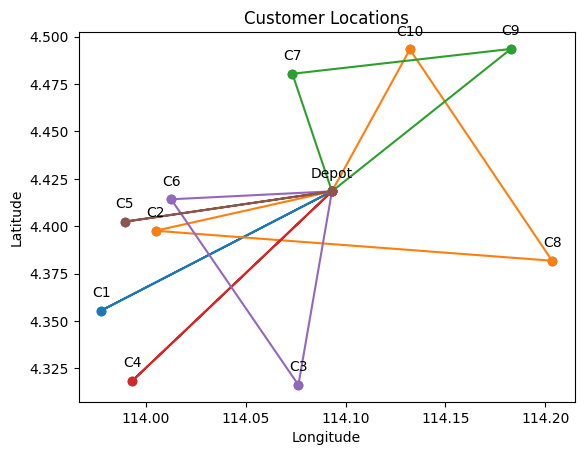

Iteration 1: Best Cost = 146.64803183147762
Iteration 2: Best Cost = 135.0895823803497
Iteration 3: Best Cost = 135.08958238034967
Iteration 4: Best Cost = 131.45607359394282
Iteration 5: Best Cost = 130.2675841468692
Iteration 6: Best Cost = 127.82373108824116
Iteration 7: Best Cost = 118.04863839202005
Iteration 8: Best Cost = 109.84206440107765
Iteration 9: Best Cost = 106.91397913280848
Iteration 10: Best Cost = 105.97787799959625
Iteration 11: Best Cost = 101.19565844278132
Iteration 12: Best Cost = 101.19565844278131
Iteration 13: Best Cost = 100.0071689957077
Iteration 14: Best Cost = 90.54488112056441
Iteration 15: Best Cost = 90.54488112056441
Iteration 16: Best Cost = 90.54488112056441
Iteration 17: Best Cost = 90.54488112056441
Iteration 18: Best Cost = 90.54488112056441
Iteration 19: Best Cost = 90.54488112056441
Iteration 20: Best Cost = 90.54488112056441
Iteration 21: Best Cost = 90.54488112056441
Iteration 22: Best Cost = 90.54488112056441
Iteration 23: Best Cost = 90.54

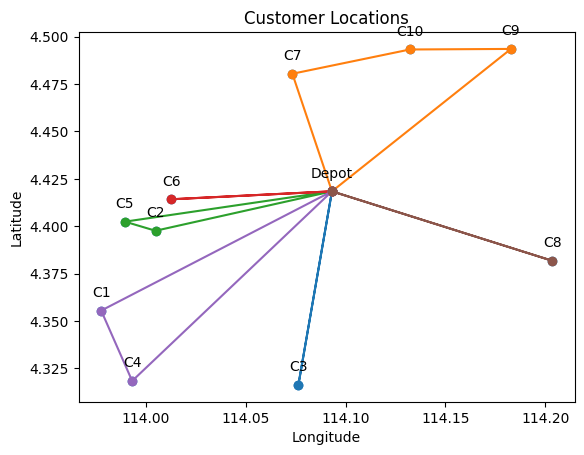

Total Distance = 134.1049 km
Total Cost = RM 160.93

Vehicle 1 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)

Vehicle 2 (Type A):
Round Trip Distance:22.156 km, Cost: RM 26.59, Demand:18
Depot -> C5 (10.483 km) -> C1 (4.839 km) -> C6 (6.834 km)

Vehicle 3 (Type A):
Round Trip Distance:71.989 km, Cost: RM 86.39, Demand:17
Depot -> C9 (11.691 km) -> C4 (25.809 km) -> C7 (18.077 km) -> C3 (16.413 km)

Vehicle 4 (Type A):
Round Trip Distance:31.525 km, Cost: RM 37.83, Demand:14
Depot -> C8 (11.612 km) -> C2 (19.913 km)



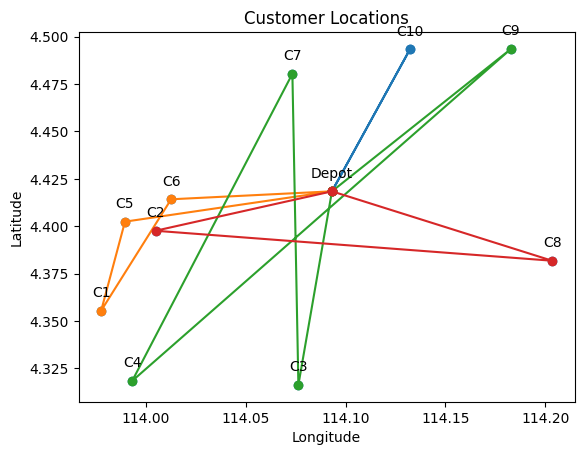

Iteration 1: Best Cost = 147.3782446364018
Iteration 2: Best Cost = 138.20228230865087
Iteration 3: Best Cost = 136.92880352306483
Iteration 4: Best Cost = 131.47279116877644
Iteration 5: Best Cost = 117.54508475037471
Iteration 6: Best Cost = 115.36574978911217
Iteration 7: Best Cost = 109.36521459126271
Iteration 8: Best Cost = 106.22539755731945
Iteration 9: Best Cost = 104.64520286700386
Iteration 10: Best Cost = 104.07194531110353
Iteration 11: Best Cost = 98.07141011325406
Iteration 12: Best Cost = 92.94137684295166
Iteration 13: Best Cost = 92.94137684295166
Iteration 14: Best Cost = 92.94137684295166
Iteration 15: Best Cost = 92.94137684295166
Iteration 16: Best Cost = 92.94137684295166
Iteration 17: Best Cost = 92.94137684295166
Iteration 18: Best Cost = 92.94137684295166
Iteration 19: Best Cost = 92.94137684295166
Iteration 20: Best Cost = 92.94137684295166
Iteration 21: Best Cost = 92.94137684295166
Iteration 22: Best Cost = 92.94137684295166
Iteration 23: Best Cost = 92.941

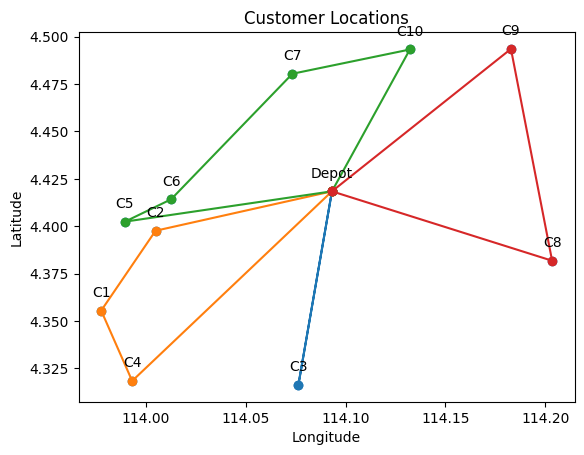

Total Distance = 116.8597 km
Total Cost = RM 140.23

Vehicle 1 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)

Vehicle 2 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)

Vehicle 3 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 4 (Type A):
Round Trip Distance:14.084 km, Cost: RM 16.9, Demand:13
Depot -> C2 (9.072 km) -> C1 (5.012 km)

Vehicle 5 (Type A):
Round Trip Distance:44.78 km, Cost: RM 53.74, Demand:15
Depot -> C7 (6.508 km) -> C8 (16.316 km) -> C4 (21.955 km)

Vehicle 6 (Type A):
Round Trip Distance:31.016 km, Cost: RM 37.22, Demand:8
Depot -> C3 (10.347 km) -> C9 (20.669 km)



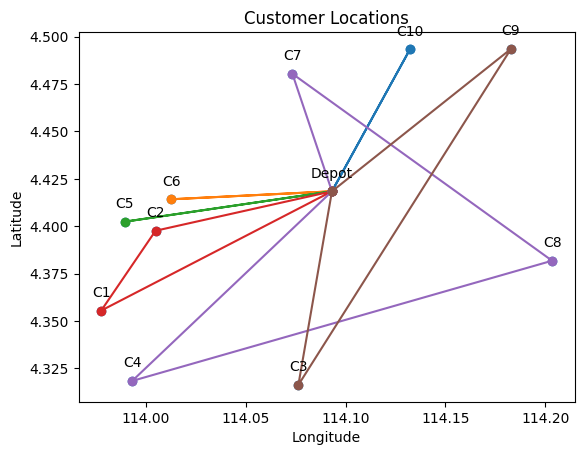

Iteration 1: Best Cost = 112.69965772158088
Iteration 2: Best Cost = 108.98533478137313
Iteration 3: Best Cost = 108.77699135024076
Iteration 4: Best Cost = 108.39695640935024
Iteration 5: Best Cost = 104.62863228075227
Iteration 6: Best Cost = 101.70054701248311
Iteration 7: Best Cost = 92.23825913733982
Iteration 8: Best Cost = 90.54488112056441
Iteration 9: Best Cost = 90.54488112056441
Iteration 10: Best Cost = 90.54488112056441
Iteration 11: Best Cost = 90.54488112056441
Iteration 12: Best Cost = 90.54488112056441
Iteration 13: Best Cost = 90.54488112056441
Iteration 14: Best Cost = 90.54488112056441
Iteration 15: Best Cost = 90.54488112056441
Iteration 16: Best Cost = 90.54488112056441
Iteration 17: Best Cost = 90.54488112056441
Iteration 18: Best Cost = 90.54488112056441
Iteration 19: Best Cost = 90.54488112056441
Iteration 20: Best Cost = 90.54488112056441
Iteration 21: Best Cost = 90.54488112056441
Iteration 22: Best Cost = 90.54488112056441
Iteration 23: Best Cost = 90.544881

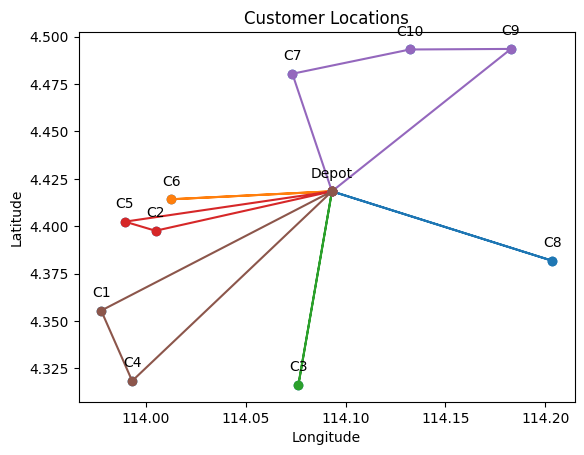

Total Distance = 154.6958 km
Total Cost = RM 185.63

Vehicle 1 (Type A):
Round Trip Distance:56.64 km, Cost: RM 67.97, Demand:18
Depot -> C1 (13.152 km) -> C9 (24.72 km) -> C6 (18.768 km)

Vehicle 2 (Type A):
Round Trip Distance:0.0 km, Cost: RM 0.0, Demand:0
Depot

Vehicle 3 (Type A):
Round Trip Distance:19.818 km, Cost: RM 23.78, Demand:11
Depot -> C2 (9.072 km) -> C7 (10.746 km)

Vehicle 4 (Type A):
Round Trip Distance:8.436 km, Cost: RM 10.12, Demand:8
Depot -> C10 (8.436 km)

Vehicle 5 (Type A):
Round Trip Distance:69.802 km, Cost: RM 83.76, Demand:20
Depot -> C4 (14.142 km) -> C8 (21.955 km) -> C5 (21.479 km) -> C3 (12.226 km)



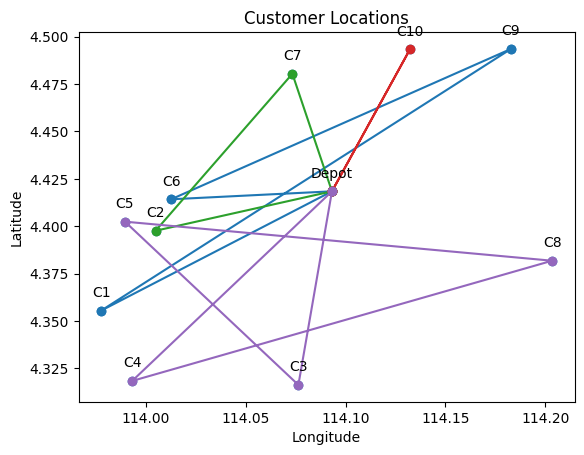

Iteration 1: Best Cost = 185.52773619089214
Iteration 2: Best Cost = 179.4390606726246
Iteration 3: Best Cost = 147.76093308736276
Iteration 4: Best Cost = 146.12200765614938
Iteration 5: Best Cost = 130.0437315496676
Iteration 6: Best Cost = 115.79840662351106
Iteration 7: Best Cost = 108.24047298983653
Iteration 8: Best Cost = 106.60715201157731
Iteration 9: Best Cost = 106.17748303665147
Iteration 10: Best Cost = 101.18873034926315
Iteration 11: Best Cost = 100.49827886331389
Iteration 12: Best Cost = 100.45296667557012
Iteration 13: Best Cost = 98.7084110361748
Iteration 14: Best Cost = 94.16798670567007
Iteration 15: Best Cost = 92.0739705188494
Iteration 16: Best Cost = 92.0739705188494
Iteration 17: Best Cost = 92.0739705188494
Iteration 18: Best Cost = 92.0739705188494
Iteration 19: Best Cost = 92.0739705188494
Iteration 20: Best Cost = 92.0739705188494
Iteration 21: Best Cost = 92.0739705188494
Iteration 22: Best Cost = 92.0739705188494
Iteration 23: Best Cost = 92.07397051884

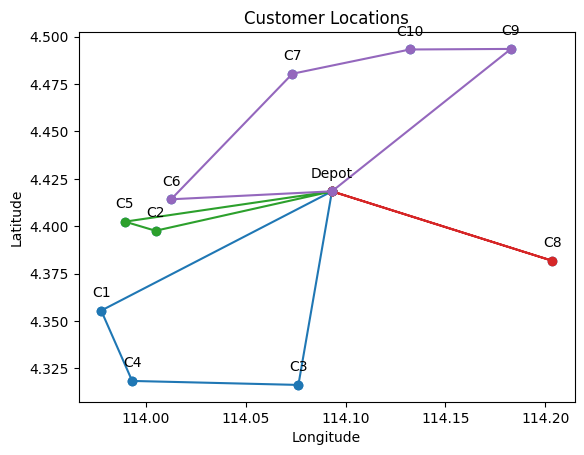

Total Distance = 131.3633 km
Total Cost = RM 180.82

Vehicle 1 (Type A):
Round Trip Distance:0.0 km, Cost: RM 0.0, Demand:0
Depot

Vehicle 2 (Type A):
Round Trip Distance:39.505 km, Cost: RM 47.41, Demand:19
Depot -> C1 (13.152 km) -> C4 (4.021 km) -> C10 (22.333 km)

Vehicle 3 (Type A):
Round Trip Distance:8.061 km, Cost: RM 9.67, Demand:8
Depot -> C6 (8.061 km)

Vehicle 4 (Type B):
Round Trip Distance:77.288 km, Cost: RM 115.93, Demand:27
Depot -> C5 (10.483 km) -> C8 (21.479 km) -> C3 (14.29 km) -> C2 (10.827 km) -> C9 (20.21 km)

Vehicle 5 (Type A):
Round Trip Distance:6.508 km, Cost: RM 7.81, Demand:3
Depot -> C7 (6.508 km)



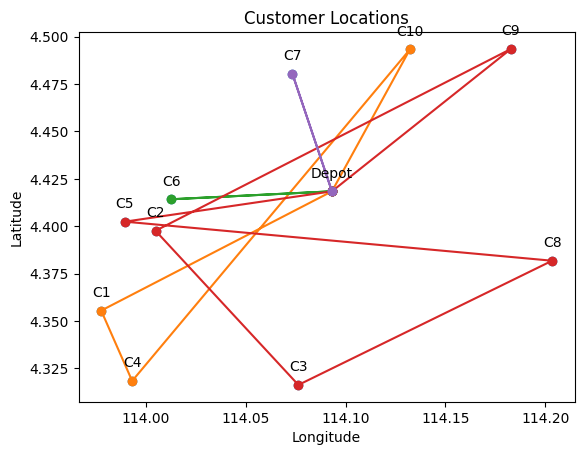

Iteration 1: Best Cost = 152.49823442833912
Iteration 2: Best Cost = 140.35345916519566
Iteration 3: Best Cost = 139.5438547419272
Iteration 4: Best Cost = 132.87664786853975
Iteration 5: Best Cost = 128.6120229748951
Iteration 6: Best Cost = 122.18562555260513
Iteration 7: Best Cost = 118.95136485997537
Iteration 8: Best Cost = 118.83300982848382
Iteration 9: Best Cost = 103.99132304614785
Iteration 10: Best Cost = 98.86664002020012
Iteration 11: Best Cost = 98.86664002020011
Iteration 12: Best Cost = 95.5013811799766
Iteration 13: Best Cost = 95.5013811799766
Iteration 14: Best Cost = 95.5013811799766
Iteration 15: Best Cost = 95.5013811799766
Iteration 16: Best Cost = 95.5013811799766
Iteration 17: Best Cost = 95.5013811799766
Iteration 18: Best Cost = 95.5013811799766
Iteration 19: Best Cost = 95.5013811799766
Iteration 20: Best Cost = 95.5013811799766
Iteration 21: Best Cost = 95.5013811799766
Iteration 22: Best Cost = 95.5013811799766
Iteration 23: Best Cost = 95.5013811799766
It

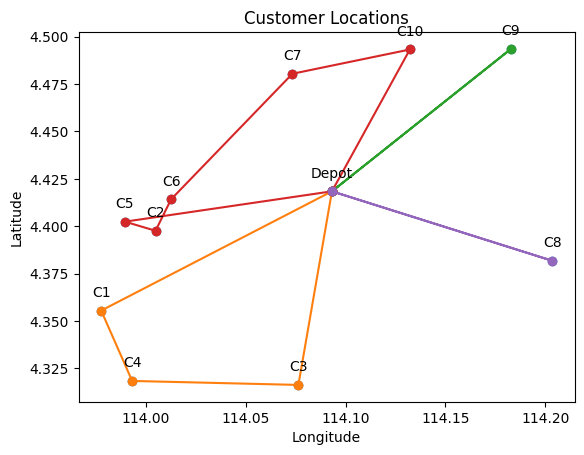

Total Distance = 134.1341 km
Total Cost = RM 160.96

Vehicle 1 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 2 (Type A):
Round Trip Distance:32.36 km, Cost: RM 38.83, Demand:8
Depot -> C9 (11.691 km) -> C3 (20.669 km)

Vehicle 3 (Type A):
Round Trip Distance:10.483 km, Cost: RM 12.58, Demand:5
Depot -> C5 (10.483 km)

Vehicle 4 (Type A):
Round Trip Distance:66.243 km, Cost: RM 79.49, Demand:22
Depot -> C7 (6.508 km) -> C8 (16.316 km) -> C1 (22.723 km) -> C10 (20.696 km)

Vehicle 5 (Type A):
Round Trip Distance:10.906 km, Cost: RM 13.09, Demand:16
Depot -> C2 (9.072 km) -> C6 (1.834 km)



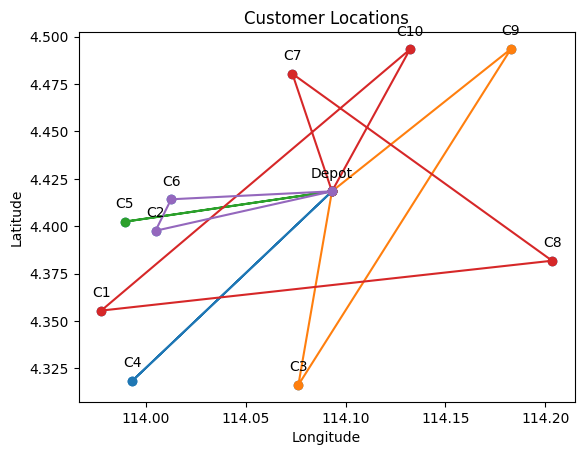

Iteration 1: Best Cost = 153.07466454117537
Iteration 2: Best Cost = 152.86632111004303
Iteration 3: Best Cost = 149.741425077099
Iteration 4: Best Cost = 129.35013393232842
Iteration 5: Best Cost = 111.90177901283717
Iteration 6: Best Cost = 107.74641508756233
Iteration 7: Best Cost = 106.58378260651692
Iteration 8: Best Cost = 104.19167191659054
Iteration 9: Best Cost = 103.3496419158553
Iteration 10: Best Cost = 103.25636185737761
Iteration 11: Best Cost = 102.97879996775013
Iteration 12: Best Cost = 102.81784170560813
Iteration 13: Best Cost = 94.61126771466573
Iteration 14: Best Cost = 88.97644780661625
Iteration 15: Best Cost = 85.06992879558744
Iteration 16: Best Cost = 85.06992879558744
Iteration 17: Best Cost = 85.06992879558744
Iteration 18: Best Cost = 85.06992879558744
Iteration 19: Best Cost = 85.06992879558744
Iteration 20: Best Cost = 85.06992879558744
Iteration 21: Best Cost = 85.06992879558744
Iteration 22: Best Cost = 85.06992879558744
Iteration 23: Best Cost = 85.069

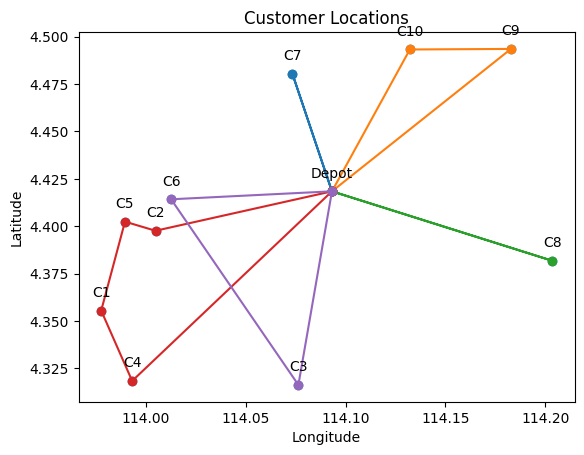

Total Distance = 121.9782 km
Total Cost = RM 146.37

Vehicle 1 (Type A):
Round Trip Distance:45.66 km, Cost: RM 54.79, Demand:25
Depot -> C7 (6.508 km) -> C10 (6.018 km) -> C8 (13.221 km) -> C2 (19.913 km)

Vehicle 2 (Type A):
Round Trip Distance:31.843 km, Cost: RM 38.21, Demand:10
Depot -> C5 (10.483 km) -> C9 (21.36 km)

Vehicle 3 (Type A):
Round Trip Distance:14.142 km, Cost: RM 16.97, Demand:6
Depot -> C4 (14.142 km)

Vehicle 4 (Type A):
Round Trip Distance:10.347 km, Cost: RM 12.42, Demand:3
Depot -> C3 (10.347 km)

Vehicle 5 (Type A):
Round Trip Distance:19.986 km, Cost: RM 23.98, Demand:13
Depot -> C1 (13.152 km) -> C6 (6.834 km)



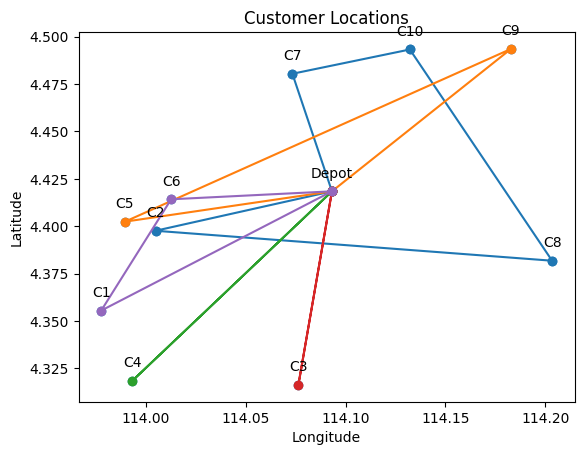

Iteration 1: Best Cost = 145.3178992102232
Iteration 2: Best Cost = 111.40275611213393
Iteration 3: Best Cost = 104.17376250299542
Iteration 4: Best Cost = 103.1923491820394
Iteration 5: Best Cost = 102.91563676470851
Iteration 6: Best Cost = 101.22225874793308
Iteration 7: Best Cost = 100.03370803848331
Iteration 8: Best Cost = 100.03370803848331
Iteration 9: Best Cost = 100.03370803848331
Iteration 10: Best Cost = 100.03370803848331
Iteration 11: Best Cost = 100.03370803848331
Iteration 12: Best Cost = 100.03370803848331
Iteration 13: Best Cost = 100.03370803848331
Iteration 14: Best Cost = 100.03370803848331
Iteration 15: Best Cost = 100.03370803848331
Iteration 16: Best Cost = 100.03370803848331
Iteration 17: Best Cost = 100.03370803848331
Iteration 18: Best Cost = 100.03370803848331
Iteration 19: Best Cost = 100.03370803848331
Iteration 20: Best Cost = 100.03370803848331
Iteration 21: Best Cost = 100.03370803848331
Iteration 22: Best Cost = 100.03370803848331
Iteration 23: Best Co

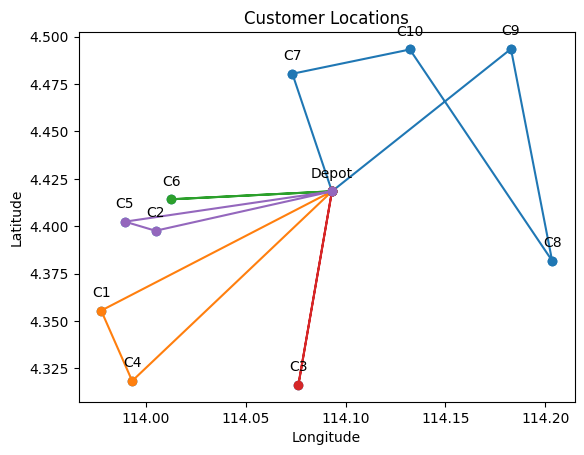

In [164]:
summary = []

for i in range(2,7):
    for j in range(20):
        solution = gen_route(i,L,C,D)
        Dist, g_dist, g_cost, g_demand, g_vehicle = calc_dist(solution,vehicles,dist_matrix,D,C)
        report(solution,g_dist,g_cost,g_vehicle,g_demand,Dist)
        plot(solution,x,y,data,f"{i}_{j+1}_i")

        ts_sol = tabu(solution,20,100,vehicles,dist_matrix,D,L,C)
        tsDist, ts_dist, ts_cost, ts_demand, ts_vehicle = calc_dist(ts_sol,vehicles,dist_matrix,D,C)

        report(ts_sol,ts_dist,ts_cost,ts_vehicle,ts_demand,tsDist)
        plot(ts_sol,x,y,data,f"{i}_{j+1}_f")
        summary.append([i,j,sum(g_dist),sum(g_cost),sum(ts_dist),sum(ts_cost)])


In [194]:
df = pd.DataFrame(summary,columns=["Max Vehicles","Iterration","Total Distance (before)","Total Cost (before)","Total Distance (after)","Total Cost (after)"])
df.groupby("Max Vehicles").mean()

    

,Iterration,Total Distance (before),Total Cost (before),Total Distance (after),Total Cost (after)
Max Vehicles,,,,,
2,9.5,134.802192,202.203288,79.404923,105.982921
3,9.5,130.664960,169.008236,77.826602,94.194063
4,9.5,128.455085,157.402870,76.144048,91.617916
5,9.5,118.953407,144.739291,74.889518,90.223917
6,9.5,119.450195,144.499560,75.341166,90.812489


In [168]:
df.groupby("Max Vehicles").min()

,Iterration,Total Distance (before),Total Cost (before),Total Distance (after),Total Cost (after)
Max Vehicles,,,,,
2,0,97.182427,145.773641,63.592228,82.418069
3,0,100.181163,135.959825,66.369051,79.642861
4,0,97.572819,117.087383,64.147300,76.976760
5,0,100.771249,120.925499,68.102740,81.723288
6,0,97.111898,116.534277,68.102740,81.723288


In [176]:
df

,Max Vehicles,Iterration,Total Distance (before),Total Cost (before),Total Distance (after),Total Cost (after)
0,2,0,152.385583,228.578374,79.242441,107.161884
1,2,1,135.819558,203.729337,82.336064,109.408041
2,2,2,165.339836,248.009754,82.038322,113.482602
3,2,3,137.603611,206.405416,79.974466,104.198233
4,2,4,148.497253,222.745879,90.922801,118.396922
...,...,...,...,...,...,...
95,6,15,116.859694,140.231632,75.454068,90.544881
96,6,16,154.695759,185.634911,76.728309,92.073971
97,6,17,131.363250,180.822427,72.866328,95.501381
98,6,18,134.134084,160.960900,70.891607,85.069929


In [190]:
df[df["Max Vehicles"] == 4]

,Max Vehicles,Iterration,Total Distance (before),Total Cost (before),Total Distance (after),Total Cost (after)
40,4,0,97.572819,117.087383,79.566806,95.480167
41,4,1,116.094778,139.313733,69.481104,83.377325
42,4,2,119.146554,142.975865,78.401405,94.081686
43,4,3,140.472811,168.567374,86.903172,104.283806
44,4,4,126.932021,152.318425,83.671469,100.405762
45,4,5,148.528008,196.399351,78.401405,94.081686
46,4,6,153.540006,184.248008,70.894217,85.073060
47,4,7,124.229942,149.075930,94.729648,113.675578
48,4,8,132.674375,159.209250,70.507555,84.609066
49,4,9,110.110778,132.132934,75.296558,90.355870
